In [ ]:
# @title importing packages

import numpy as np
import pandas as pd
import io
from google.colab import files

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Model training and validation
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    precision_score,
    recall_score,
    roc_auc_score
)


In [ ]:
# @title ML Model, preprocessing classes...

class DiabetesClassifier:
    def __init__(self, input_shape=(8,), n_layer1=12, n_layer2=8, layer1_actv_fnc = 'relu', layer2_actv_fnc = 'relu'):
        self.model = Sequential()
        self.model.add(Dense(n_layer1, input_shape=input_shape, activation=layer1_actv_fnc))
        self.model.add(Dense(n_layer2, activation=layer2_actv_fnc))
        self.model.add(Dense(1, activation='sigmoid'))
        self.model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    def train(self, X_train, y_train, epochs=150, batch_size=10):
        history = self.model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)
        return history

    def evaluate(self, X_test, y_test):
        _, accuracy = self.model.evaluate(X_test, y_test, verbose=0)
        predictions = (self.model.predict(X_test) > 0.5).astype(int)
        conf_matrix = confusion_matrix(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)
        return accuracy, conf_matrix, precision, recall, roc_auc

class DataPreprocessor:
    def __init__(self):
        pass

    def preprocess(self, X):
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)

        # Convert the scaled array back to a DataFrame
        X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns if isinstance(X, pd.DataFrame) else None)
        return X_scaled_df

    def plot_correlation(self, dataset):
        plt.figure(figsize=(10, 8))
        sns.heatmap(dataset.corr(), annot=True, cmap='coolwarm')
        plt.title('Feature Correlation Matrix')
        plt.show()

    def dataset_summary(self, X):
        print("### Dataset Summary ###")
        print(X.describe())  # Basic statistics
        print("\nMissing Values:\n", X.isnull().sum())  # Missing values
        print("\nTotal Null Values:", X.isnull().sum().sum())  # Total null count
        print("=" * 50)

    def check_class_balance(self, y):
        """Prints the number of samples in class 0 and class 1."""
        class_counts = y.value_counts()

        print("### Class Distribution ###")
        print(f"Class 0: {class_counts.get(0, 0)} samples")
        print(f"Class 1: {class_counts.get(1, 0)} samples")
        print("=" * 50)


def load_data(file_path):
    dataset = pd.read_csv(file_path, index_col=False, header=None)
    X = dataset.iloc[:, :-1]
    y = dataset.iloc[:, -1]
    return X, y

In [ ]:
# @title explore the datasets in short!
X, y = load_data('pima-indians-diabetes.csv')

preprocessor = DataPreprocessor()
preprocessor.dataset_summary(X)

### Dataset Summary ###
                0           1           2           3           4           5  \
count  768.000000  768.000000  768.000000  768.000000  768.000000  768.000000   
mean     3.845052  120.894531   69.105469   20.536458   79.799479   31.992578   
std      3.369578   31.972618   19.355807   15.952218  115.244002    7.884160   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000   99.000000   62.000000    0.000000    0.000000   27.300000   
50%      3.000000  117.000000   72.000000   23.000000   30.500000   32.000000   
75%      6.000000  140.250000   80.000000   32.000000  127.250000   36.600000   
max     17.000000  199.000000  122.000000   99.000000  846.000000   67.100000   

                6           7  
count  768.000000  768.000000  
mean     0.471876   33.240885  
std      0.331329   11.760232  
min      0.078000   21.000000  
25%      0.243750   24.000000  
50%      0.372500   29.000000  
75%      0.626250   41

**Task-1**: Do plain validation and k-fold cross validation. For plain validation, try different train:test ratios like 80:20, 70:30, 90:10, etc. And for k-fold CrossCV, try k=[3,4,5,6,7,8,9,10]. Document the results and identify the best cases. Try to intuitively justify the reason behind the best hyperparameter values.

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Training for Test Size 0.1.......



Training Data Summary for test_size of 0.1


### Dataset Summary ###
                0           1           2           3           4           5  \
count  691.000000  691.000000  691.000000  691.000000  691.000000  691.000000   
mean     3.800289  120.824891   69.104197   20.422576   80.432706   31.972504   
std      3.357112   32.098215   19.126069   15.621919  115.369159    7.884084   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000   99.000000   62.000000    0.000000    0.000000   27.200000   
50%      3.000000  117.000000   72.000000   23.000000   38.000000   32.000000   
75%      6.000000  140.000000   80.000000   32.000000  129.500000   36.500000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   67.100000   

                6           7  
count  691.000000  691.000000  
mean     0.473645   32.706223  
std      0.335638   11.317254  
min      0.078000   21.000000  
25% 

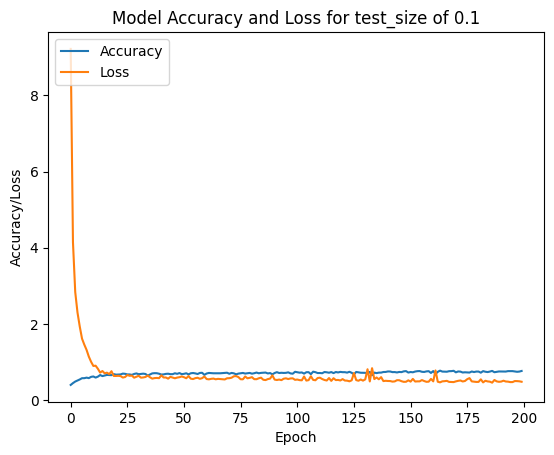

Testing for Test Size 0.1.......


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Test accuracy: 0.71
Precision on test data: 0.57
Recall on test data: 0.74
ROC AUC Score on test data: 0.72


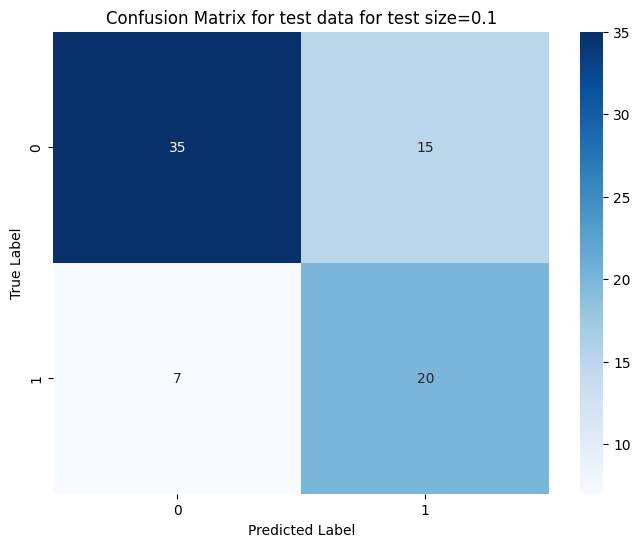

Training for Test Size 0.15.......



Training Data Summary for test_size of 0.15


### Dataset Summary ###
                0           1           2           3           4           5  \
count  652.000000  652.000000  652.000000  652.000000  652.000000  652.000000   
mean     3.828221  120.835890   69.199387   20.269939   80.384969   31.931595   
std      3.373512   32.076029   18.841977   15.593457  116.223435    7.791226   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000   99.000000   62.000000    0.000000    0.000000   27.000000   
50%      3.000000  117.000000   72.000000   22.000000   36.500000   32.000000   
75%      6.000000  139.000000   80.000000   32.000000  127.500000   36.425000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   67.100000   

                6           7  
count  652.000000  652.000000  
mean     0.471844   32.874233  
std      0.338286   11.476931  
min      0.078000   21.000000  
25

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


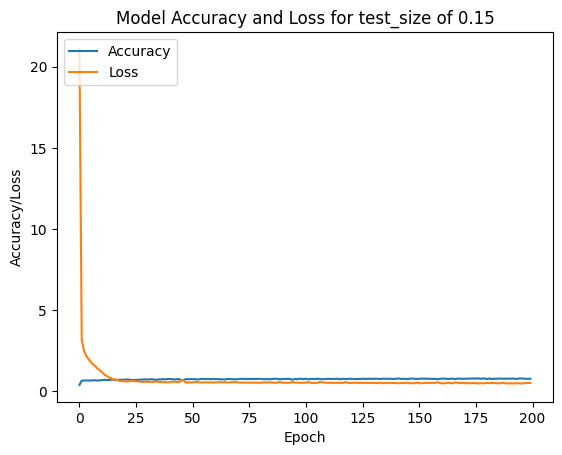

Testing for Test Size 0.15.......


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Test accuracy: 0.74
Precision on test data: 0.66
Recall on test data: 0.53
ROC AUC Score on test data: 0.69


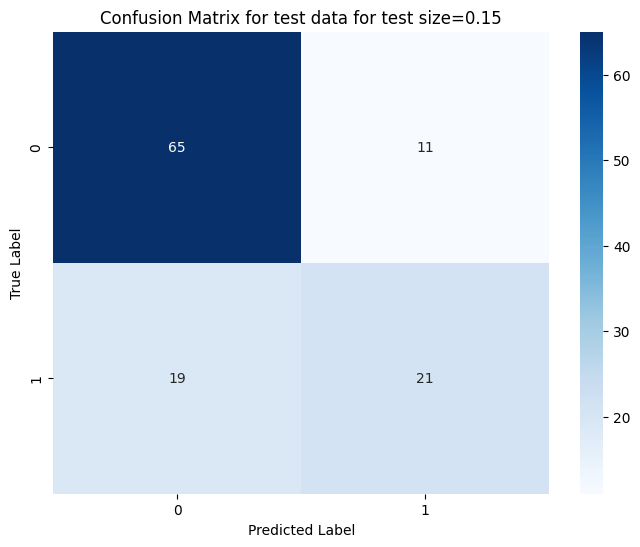

Training for Test Size 0.2.......



Training Data Summary for test_size of 0.2


### Dataset Summary ###
                0           1           2           3           4           5  \
count  614.000000  614.000000  614.000000  614.000000  614.000000  614.000000   
mean     3.742671  120.855049   69.415309   20.399023   81.438111   31.983388   
std      3.313264   32.035057   18.512599   15.433974  116.234835    7.740625   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000  100.000000   64.000000    0.000000    0.000000   27.100000   
50%      3.000000  117.000000   72.000000   23.000000   42.500000   32.000000   
75%      6.000000  139.000000   80.000000   32.000000  129.750000   36.375000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   67.100000   

                6           7  
count  614.000000  614.000000  
mean     0.469168   32.907166  
std      0.336847   11.503437  
min      0.078000   21.000000  
25% 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


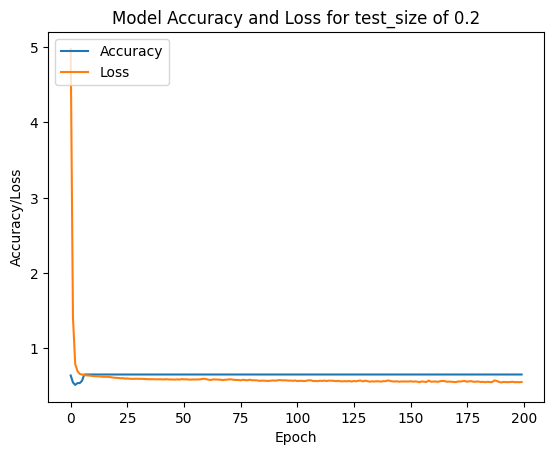

Testing for Test Size 0.2.......




1/5 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Test accuracy: 0.64
Precision on test data: 0.00
Recall on test data: 0.00
ROC AUC Score on test data: 0.50


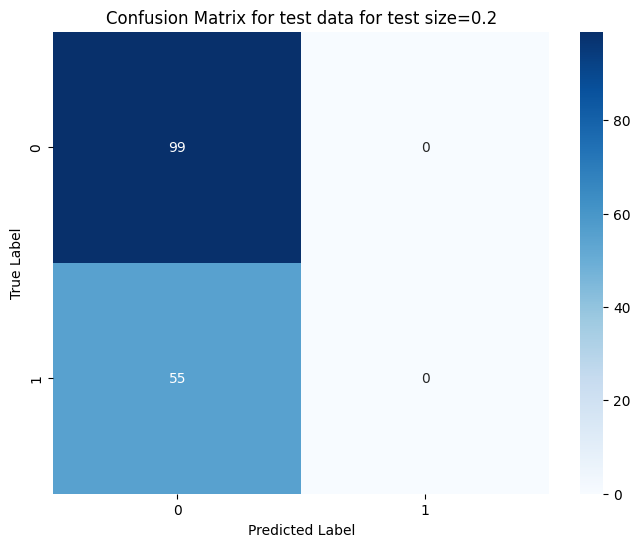

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Training for Test Size 0.25.......



Training Data Summary for test_size of 0.25


### Dataset Summary ###
                0           1           2           3           4           5  \
count  576.000000  576.000000  576.000000  576.000000  576.000000  576.000000   
mean     3.741319  120.659722   69.505208   20.494792   80.362847   31.981771   
std      3.305452   32.133182   18.399810   15.424655  116.223541    7.622203   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000   99.000000   64.000000    0.000000    0.000000   27.000000   
50%      3.000000  117.000000   72.000000   23.000000   37.000000   32.000000   
75%      6.000000  138.250000   80.000000   32.000000  127.500000   36.325000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   67.100000   

                6           7  
count  576.000000  576.000000  
mean     0.468618   32.921875  
std      0.339325   11.507539  
min      0.078000   21.000000  
25

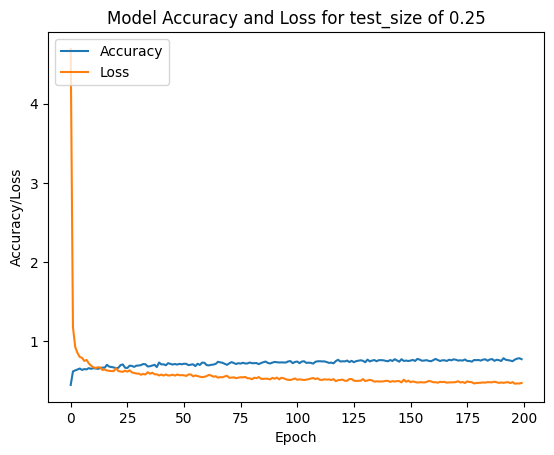

Testing for Test Size 0.25.......


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step  
Test accuracy: 0.73
Precision on test data: 0.74
Recall on test data: 0.41
ROC AUC Score on test data: 0.66


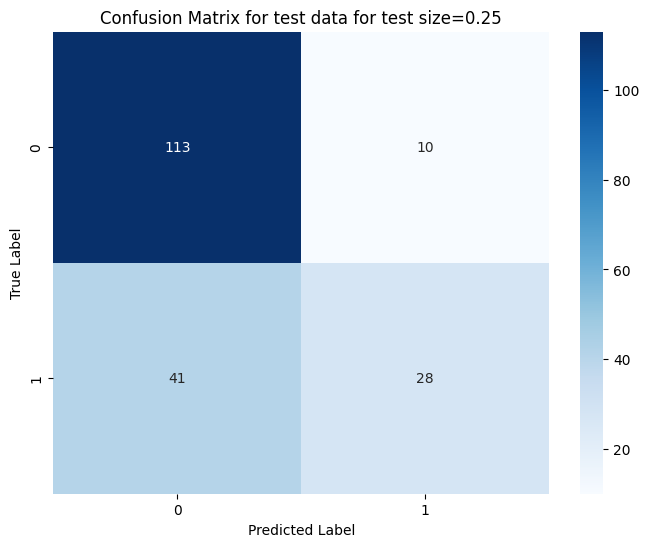

Training for Test Size 0.3.......



Training Data Summary for test_size of 0.3


### Dataset Summary ###
                0           1           2           3           4           5  \
count  537.000000  537.000000  537.000000  537.000000  537.000000  537.000000   
mean     3.726257  120.849162   69.685289   20.432030   79.836127   31.975605   
std      3.262965   32.339523   18.094374   15.490715  115.196730    7.624495   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000   99.000000   64.000000    0.000000    0.000000   26.800000   
50%      3.000000  117.000000   72.000000   23.000000   36.000000   32.000000   
75%      6.000000  139.000000   80.000000   32.000000  129.000000   36.500000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   67.100000   

                6           7  
count  537.000000  537.000000  
mean     0.469920   33.074488  
std      0.342087   11.685319  
min      0.078000   21.000000  
25% 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


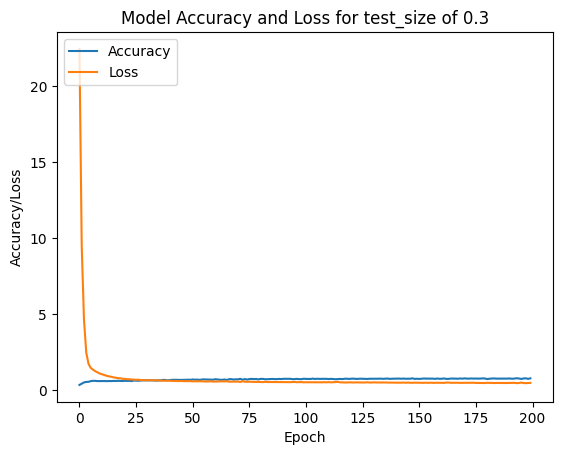

Testing for Test Size 0.3.......


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Test accuracy: 0.71
Precision on test data: 0.62
Recall on test data: 0.45
ROC AUC Score on test data: 0.65


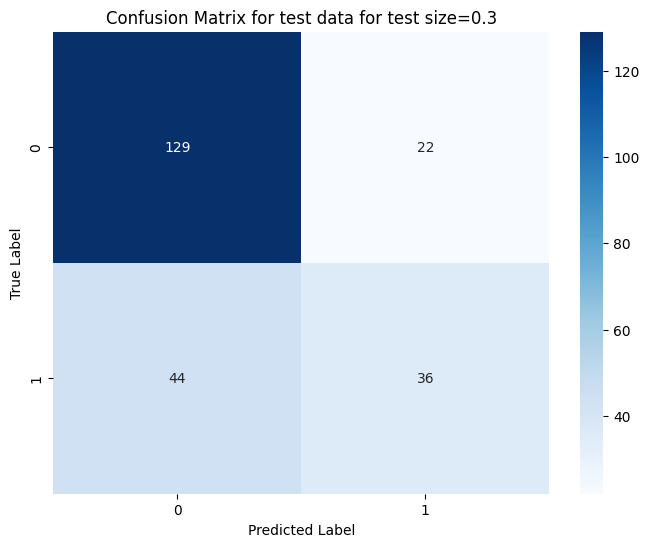

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Training for Test Size 0.35.......



Training Data Summary for test_size of 0.35


### Dataset Summary ###
                0           1           2           3           4           5  \
count  499.000000  499.000000  499.000000  499.000000  499.000000  499.000000   
mean     3.773547  121.689379   69.921844   20.621242   79.206413   32.008818   
std      3.263345   32.561245   18.166894   15.514950  115.405499    7.672671   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000   99.500000   64.000000    0.000000    0.000000   27.000000   
50%      3.000000  118.000000   72.000000   23.000000   37.000000   32.000000   
75%      6.000000  141.000000   80.000000   32.000000  126.500000   36.500000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   67.100000   

                6           7  
count  499.000000  499.000000  
mean     0.471579   33.178357  
std      0.343313   11.732727  
min      0.078000   21.000000  
25

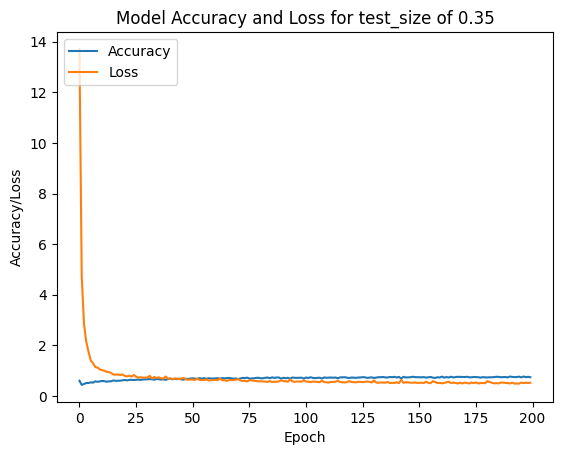

Testing for Test Size 0.35.......


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Test accuracy: 0.73
Precision on test data: 0.64
Recall on test data: 0.42
ROC AUC Score on test data: 0.65


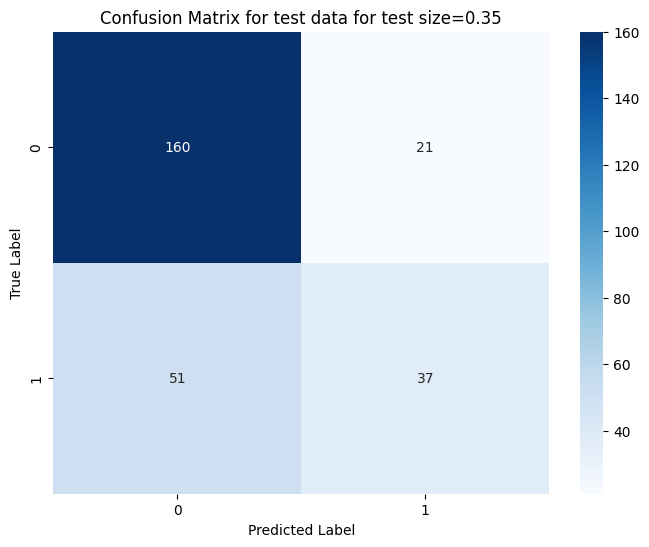

Training for Test Size 0.4.......



Training Data Summary for test_size of 0.4


### Dataset Summary ###
                0           1           2           3           4           5  \
count  460.000000  460.000000  460.000000  460.000000  460.000000  460.000000   
mean     3.756522  121.715217   70.117391   20.741304   80.539130   31.974348   
std      3.267564   32.037005   17.202223   15.462247  116.432391    7.556808   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000   99.000000   64.000000    0.000000    0.000000   27.075000   
50%      3.000000  118.000000   72.000000   23.000000   42.000000   32.000000   
75%      6.000000  140.000000   80.000000   32.000000  129.250000   36.500000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   59.400000   

                6           7  
count  460.000000  460.000000  
mean     0.473976   33.030435  
std      0.350159   11.664853  
min      0.078000   21.000000  
25% 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


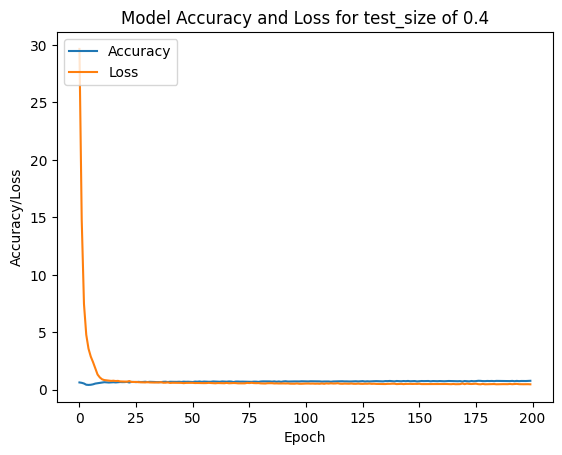

Testing for Test Size 0.4.......


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
Test accuracy: 0.64
Precision on test data: 0.48
Recall on test data: 0.76
ROC AUC Score on test data: 0.67


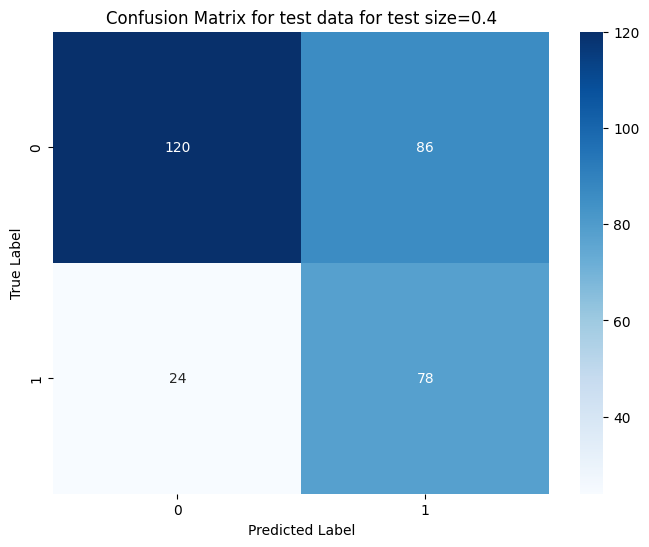

Training for Test Size 0.45.......



Training Data Summary for test_size of 0.45


### Dataset Summary ###
                0           1           2           3           4           5  \
count  422.000000  422.000000  422.000000  422.000000  422.000000  422.000000   
mean     3.770142  121.720379   70.308057   20.810427   80.369668   32.178199   
std      3.263817   31.693942   16.383175   15.511917  116.719718    7.066293   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000   99.000000   64.000000    0.000000    0.000000   27.125000   
50%      3.000000  118.000000   72.000000   23.000000   38.500000   32.000000   
75%      6.000000  139.750000   80.000000   32.000000  130.000000   36.500000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   59.400000   

                6           7  
count  422.000000  422.000000  
mean     0.483607   32.952607  
std      0.358899   11.508032  
min      0.078000   21.000000  
25

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


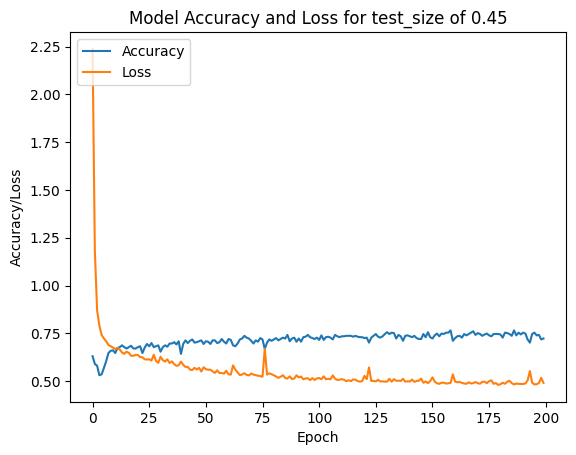

Testing for Test Size 0.45.......


11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
Test accuracy: 0.71
Precision on test data: 0.58
Recall on test data: 0.58
ROC AUC Score on test data: 0.68


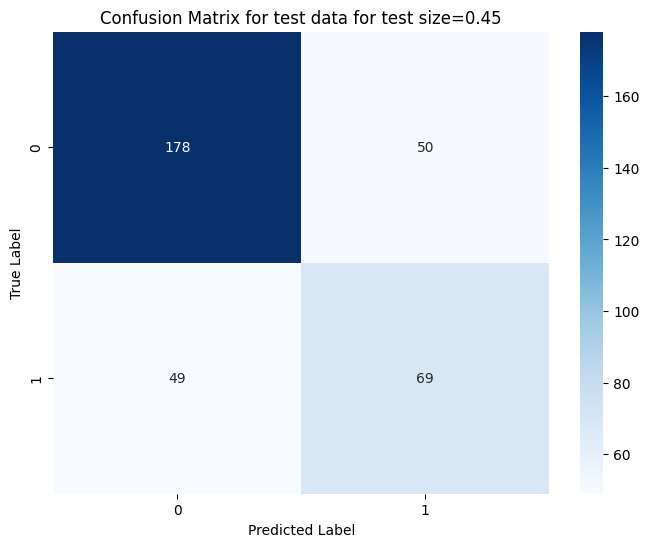

Training for Test Size 0.5.......



Training Data Summary for test_size of 0.5


### Dataset Summary ###
                0           1           2           3           4           5  \
count  384.000000  384.000000  384.000000  384.000000  384.000000  384.000000   
mean     3.809896  121.190104   70.427083   20.692708   78.859375   32.146875   
std      3.276279   30.970934   16.025270   15.386724  113.198622    6.862898   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000   99.000000   64.000000    0.000000    0.000000   27.100000   
50%      3.000000  117.000000   72.000000   23.000000   40.500000   32.050000   
75%      6.000000  138.250000   80.000000   32.000000  126.250000   36.350000   
max     17.000000  199.000000  122.000000   60.000000  846.000000   52.900000   

                6           7  
count  384.000000  384.000000  
mean     0.478750   32.976562  
std      0.333773   11.629483  
min      0.084000   21.000000  
25% 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


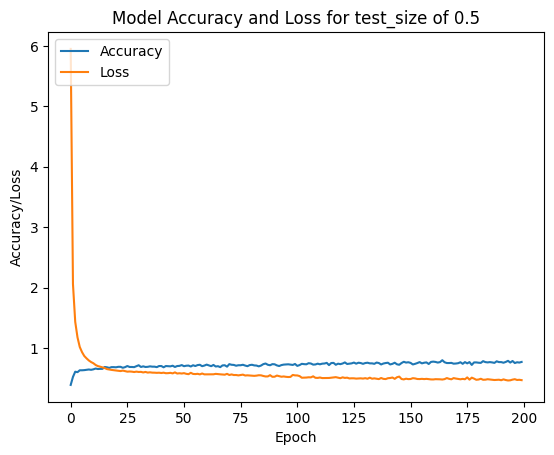

Testing for Test Size 0.5.......


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step  
Test accuracy: 0.71
Precision on test data: 0.56
Recall on test data: 0.62
ROC AUC Score on test data: 0.69


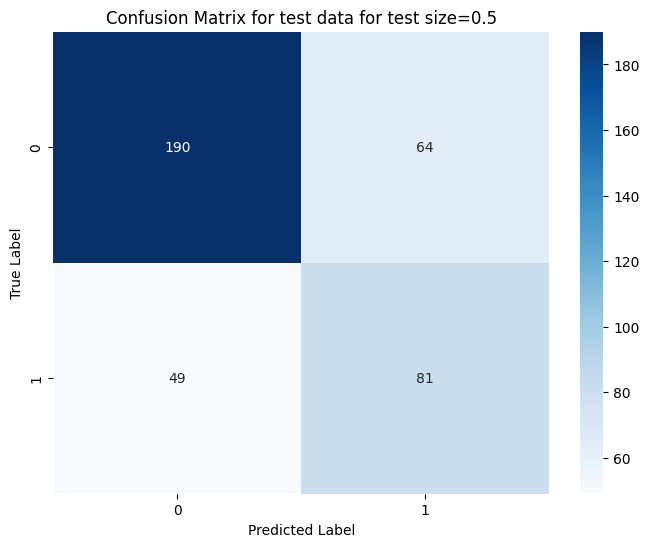

In [ ]:
# @title plain validation

def main_plain(preprocess=False, epochs=150, test_size = 0.2, batch_size=10):
    X, y = load_data('pima-indians-diabetes.csv')
    if preprocess:
        preprocessor = DataPreprocessor()
        X = preprocessor.preprocess(X)
        preprocessor.plot_correlation(pd.concat([X, y], axis=1))  # Assuming y is a pandas Series

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=42)
    classifier = DiabetesClassifier()

    print(f"Training for Test Size {test_size}.......\n\n\n")
    preprocessor = DataPreprocessor()

    print(f"Training Data Summary for test_size of {test_size}\n\n")
    preprocessor.dataset_summary(X_train)
    print(f"Training Data class imbalance check for test_size of {test_size}\n\n")
    preprocessor.check_class_balance(y_train)
    print(f"Test Data Summary for test_size of {test_size}\n\n")
    preprocessor.dataset_summary(X_test)
    print(f"Test Data class imbalance check for test_size of {test_size}\n\n")
    preprocessor.check_class_balance(y_test)


    history = classifier.train(X_train, y_train, epochs=epochs, batch_size=batch_size)

    # Plot accuracy and loss vs epoch
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['loss'])
    plt.title(f'Model Accuracy and Loss for test_size of {test_size}')
    plt.ylabel('Accuracy/Loss')
    plt.xlabel('Epoch')
    plt.legend(['Accuracy', 'Loss'], loc='upper left')
    plt.show()

    print(f"Testing for Test Size {test_size}.......\n\n")
    accuracy, conf_matrix, precision, recall, roc_auc = classifier.evaluate(X_test, y_test)
    print(f'Test accuracy: {accuracy:.2f}')
    print(f'Precision on test data: {precision:.2f}')
    print(f'Recall on test data: {recall:.2f}')
    print(f'ROC AUC Score on test data: {roc_auc:.2f}')

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix for test data for test size={test_size}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    return accuracy, conf_matrix, precision, recall, roc_auc


# Investigating Plain Validation
if __name__ == "__main__":

  accurracy_list = []
  precision_list = []
  recall_list = []
  roc_auc_list = []
  test_size_list = [0.10, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]

  for test_size_val in test_size_list:
    accuracy, conf_matrix, precision, recall, roc_auc = main_plain(preprocess=False, epochs=200, test_size = test_size_val, batch_size=15)
    accurracy_list.append(accuracy)
    precision_list.append(precision)
    recall_list.append(recall)
    roc_auc_list.append(roc_auc)



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

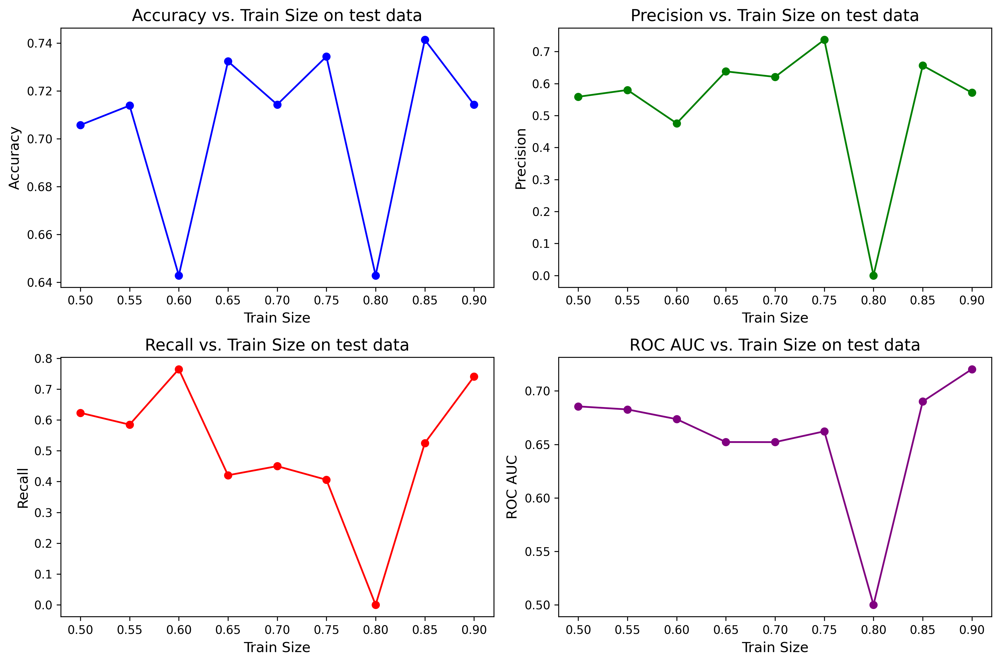

In [ ]:
# @title plain_validation_results plot

# Create a DataFrame for the data
train_size_list = [1 - ts for ts in test_size_list]  # Calculate train sizes

# Create a DataFrame for the data
plain_results_df = pd.DataFrame({
    'Train Size': train_size_list,
    'Accuracy': accurracy_list,
    'Precision': precision_list,
    'Recall': recall_list,
    'ROC AUC': roc_auc_list
})

# Save the DataFrame to a CSV file
plain_results_df.to_csv('plain_validation_results.csv', index=False)
files.download('plain_validation_results.csv')

# Create the 2x2 plot
fig, axes = plt.subplots(2, 2, figsize=(12, 8), dpi=300)  # High resolution

# Define colors for each subplot
colors = ['blue', 'green', 'red', 'purple']

axes[0, 0].plot(train_size_list, accurracy_list, marker='o', color=colors[0])
axes[0, 0].set_title('Accuracy vs. Train Size on test data', fontsize=14)  # Increased font size
axes[0, 0].set_xlabel('Train Size', fontsize=12)
axes[0, 0].set_ylabel('Accuracy', fontsize=12)

axes[0, 1].plot(train_size_list, precision_list, marker='o', color=colors[1])
axes[0, 1].set_title('Precision vs. Train Size on test data', fontsize=14)
axes[0, 1].set_xlabel('Train Size', fontsize=12)
axes[0, 1].set_ylabel('Precision', fontsize=12)

axes[1, 0].plot(train_size_list, recall_list, marker='o', color=colors[2])
axes[1, 0].set_title('Recall vs. Train Size on test data', fontsize=14)
axes[1, 0].set_xlabel('Train Size', fontsize=12)
axes[1, 0].set_ylabel('Recall', fontsize=12)

axes[1, 1].plot(train_size_list, roc_auc_list, marker='o', color=colors[3])
axes[1, 1].set_title('ROC AUC vs. Train Size on test data', fontsize=14)
axes[1, 1].set_xlabel('Train Size', fontsize=12)
axes[1, 1].set_ylabel('ROC AUC', fontsize=12)

plt.tight_layout()

# Save the plot to a file and download it
plt.savefig('train_size_vs_metrics_plain_validation.png', dpi=300)
files.download('train_size_vs_metrics_plain_validation.png')

We can see that at 0.8 (train size), the performance is very low. One of the reason can due to short test data and class imbalance in this data. Which is evident from the confusion matrix at 0.2 (test size). That's why at 0.8, we repeated the train multiple times and determined the average values of the metrics for the test set to observe if the result is better than before....

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Training for Test Size 0.2.......



Training Data Summary for test_size of 0.2


### Dataset Summary ###
                0           1           2           3           4           5  \
count  614.000000  614.000000  614.000000  614.000000  614.000000  614.000000   
mean     3.742671  120.855049   69.415309   20.399023   81.438111   31.983388   
std      3.313264   32.035057   18.512599   15.433974  116.234835    7.740625   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000  100.000000   64.000000    0.000000    0.000000   27.100000   
50%      3.000000  117.000000   72.000000   23.000000   42.500000   32.000000   
75%      6.000000  139.000000   80.000000   32.000000  129.750000   36.375000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   67.100000   

                6           7  
count  614.000000  614.000000  
mean     0.469168   32.907166  
std      0.336847   11.503437  
min      0.078000   21.000000  
25% 

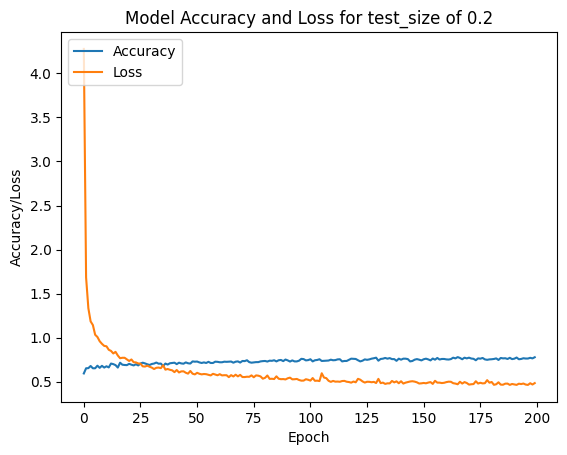

Testing for Test Size 0.2.......


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Test accuracy: 0.75
Precision on test data: 0.62
Recall on test data: 0.73
ROC AUC Score on test data: 0.74


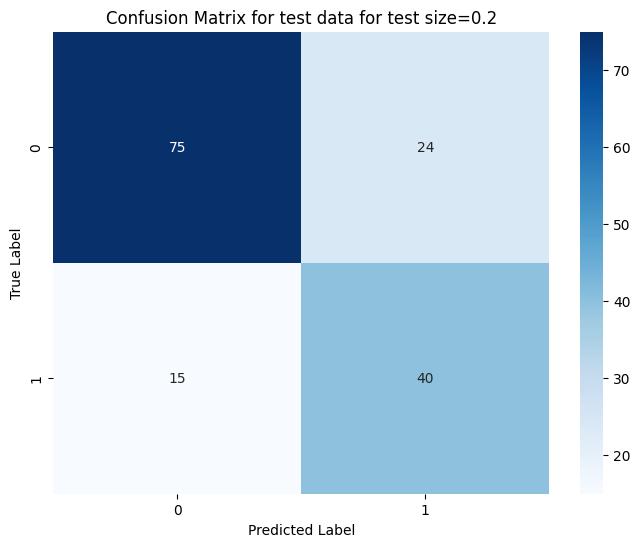

Training for Test Size 0.2.......



Training Data Summary for test_size of 0.2


### Dataset Summary ###
                0           1           2           3           4           5  \
count  614.000000  614.000000  614.000000  614.000000  614.000000  614.000000   
mean     3.742671  120.855049   69.415309   20.399023   81.438111   31.983388   
std      3.313264   32.035057   18.512599   15.433974  116.234835    7.740625   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000  100.000000   64.000000    0.000000    0.000000   27.100000   
50%      3.000000  117.000000   72.000000   23.000000   42.500000   32.000000   
75%      6.000000  139.000000   80.000000   32.000000  129.750000   36.375000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   67.100000   

                6           7  
count  614.000000  614.000000  
mean     0.469168   32.907166  
std      0.336847   11.503437  
min      0.078000   21.000000  
25% 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


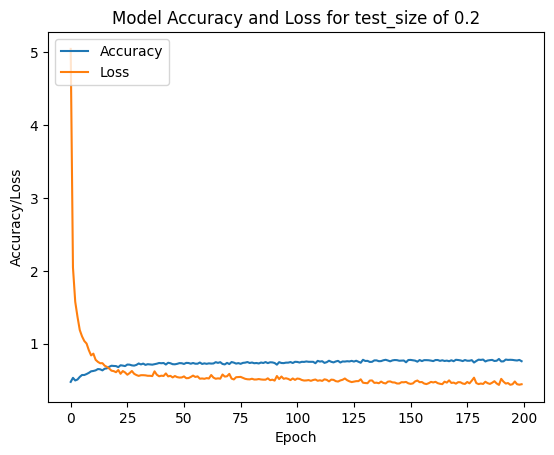

Testing for Test Size 0.2.......


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Test accuracy: 0.76
Precision on test data: 0.68
Recall on test data: 0.62
ROC AUC Score on test data: 0.73


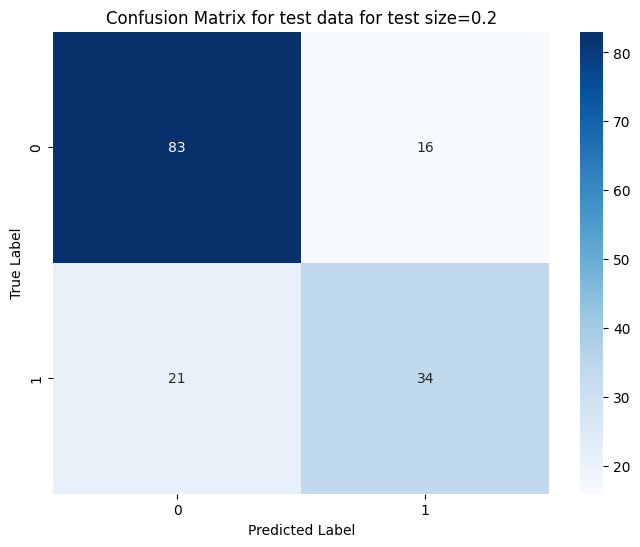

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Training for Test Size 0.2.......



Training Data Summary for test_size of 0.2


### Dataset Summary ###
                0           1           2           3           4           5  \
count  614.000000  614.000000  614.000000  614.000000  614.000000  614.000000   
mean     3.742671  120.855049   69.415309   20.399023   81.438111   31.983388   
std      3.313264   32.035057   18.512599   15.433974  116.234835    7.740625   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000  100.000000   64.000000    0.000000    0.000000   27.100000   
50%      3.000000  117.000000   72.000000   23.000000   42.500000   32.000000   
75%      6.000000  139.000000   80.000000   32.000000  129.750000   36.375000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   67.100000   

                6           7  
count  614.000000  614.000000  
mean     0.469168   32.907166  
std      0.336847   11.503437  
min      0.078000   21.000000  
25% 

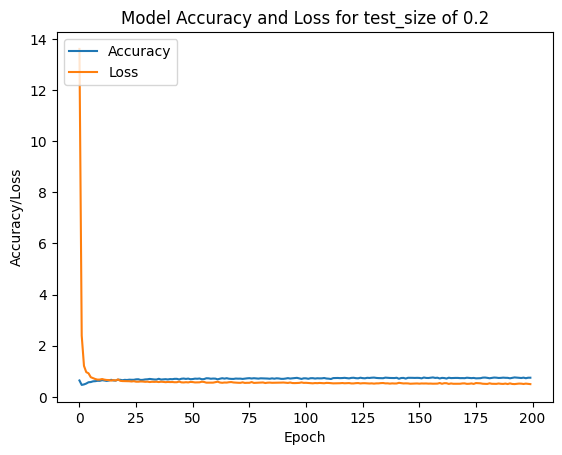

Testing for Test Size 0.2.......


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Test accuracy: 0.74
Precision on test data: 0.71
Recall on test data: 0.45
ROC AUC Score on test data: 0.68


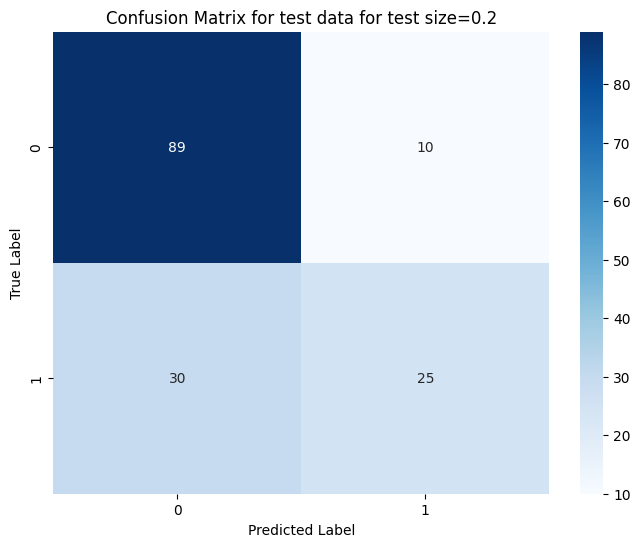

Training for Test Size 0.2.......



Training Data Summary for test_size of 0.2


### Dataset Summary ###
                0           1           2           3           4           5  \
count  614.000000  614.000000  614.000000  614.000000  614.000000  614.000000   
mean     3.742671  120.855049   69.415309   20.399023   81.438111   31.983388   
std      3.313264   32.035057   18.512599   15.433974  116.234835    7.740625   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000  100.000000   64.000000    0.000000    0.000000   27.100000   
50%      3.000000  117.000000   72.000000   23.000000   42.500000   32.000000   
75%      6.000000  139.000000   80.000000   32.000000  129.750000   36.375000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   67.100000   

                6           7  
count  614.000000  614.000000  
mean     0.469168   32.907166  
std      0.336847   11.503437  
min      0.078000   21.000000  
25% 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


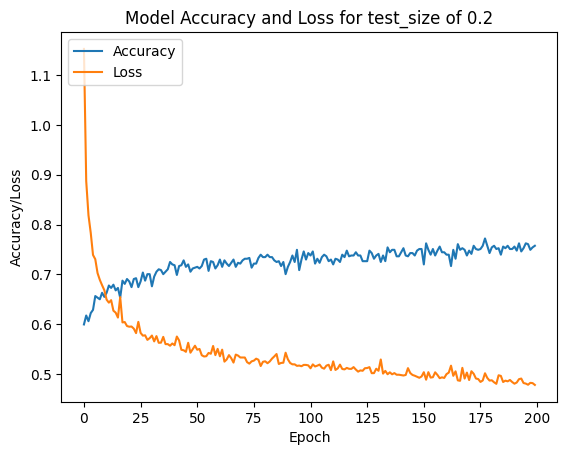

Testing for Test Size 0.2.......


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Test accuracy: 0.73
Precision on test data: 0.69
Recall on test data: 0.45
ROC AUC Score on test data: 0.67


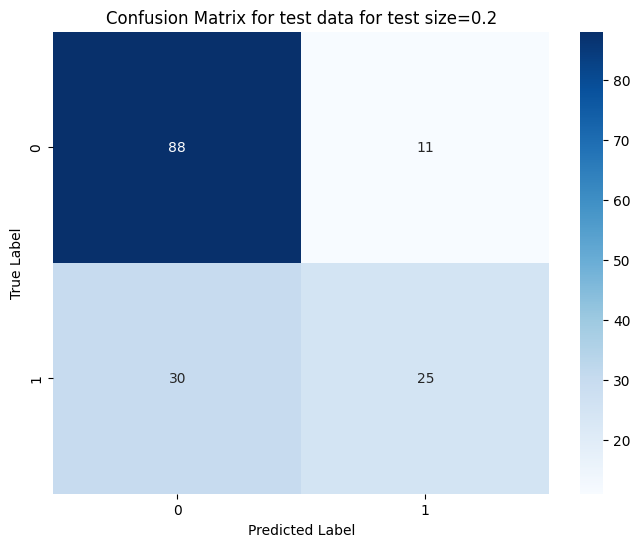

Training for Test Size 0.2.......



Training Data Summary for test_size of 0.2


### Dataset Summary ###
                0           1           2           3           4           5  \
count  614.000000  614.000000  614.000000  614.000000  614.000000  614.000000   
mean     3.742671  120.855049   69.415309   20.399023   81.438111   31.983388   
std      3.313264   32.035057   18.512599   15.433974  116.234835    7.740625   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000  100.000000   64.000000    0.000000    0.000000   27.100000   
50%      3.000000  117.000000   72.000000   23.000000   42.500000   32.000000   
75%      6.000000  139.000000   80.000000   32.000000  129.750000   36.375000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   67.100000   

                6           7  
count  614.000000  614.000000  
mean     0.469168   32.907166  
std      0.336847   11.503437  
min      0.078000   21.000000  
25% 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


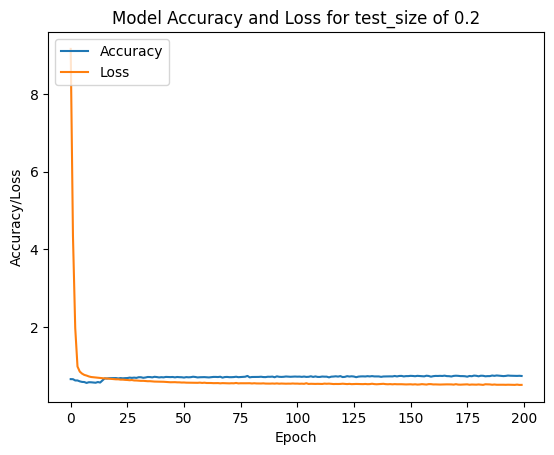

Testing for Test Size 0.2.......


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Test accuracy: 0.73
Precision on test data: 0.71
Recall on test data: 0.40
ROC AUC Score on test data: 0.65


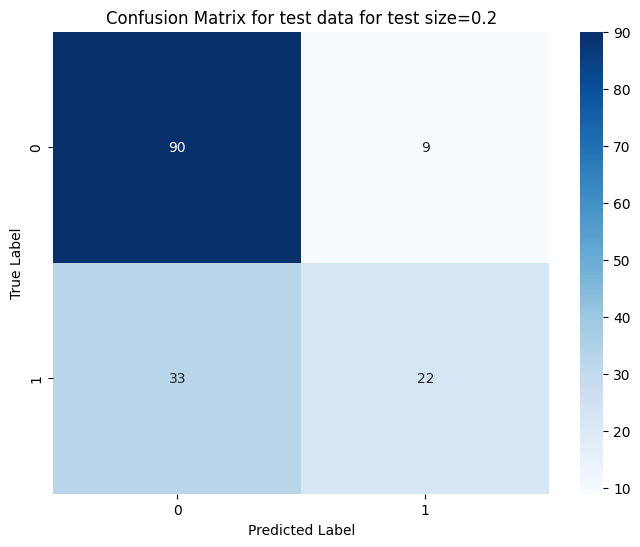

Training for Test Size 0.2.......



Training Data Summary for test_size of 0.2


### Dataset Summary ###


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


                0           1           2           3           4           5  \
count  614.000000  614.000000  614.000000  614.000000  614.000000  614.000000   
mean     3.742671  120.855049   69.415309   20.399023   81.438111   31.983388   
std      3.313264   32.035057   18.512599   15.433974  116.234835    7.740625   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000  100.000000   64.000000    0.000000    0.000000   27.100000   
50%      3.000000  117.000000   72.000000   23.000000   42.500000   32.000000   
75%      6.000000  139.000000   80.000000   32.000000  129.750000   36.375000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   67.100000   

                6           7  
count  614.000000  614.000000  
mean     0.469168   32.907166  
std      0.336847   11.503437  
min      0.078000   21.000000  
25%      0.241500   24.000000  
50%      0.372500   29.000000  
75%      0.613750   40.000000  
max      2.420

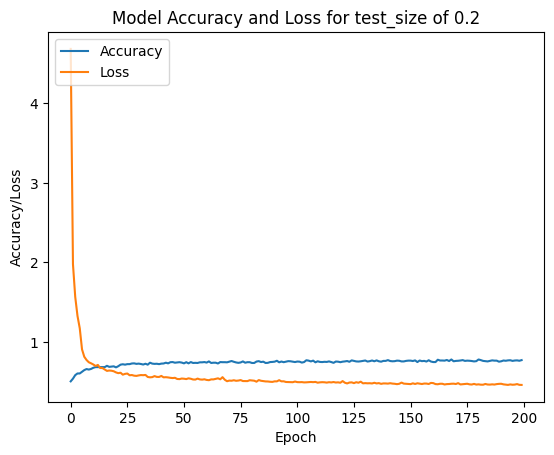

Testing for Test Size 0.2.......


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Test accuracy: 0.77
Precision on test data: 0.70
Recall on test data: 0.60
ROC AUC Score on test data: 0.73


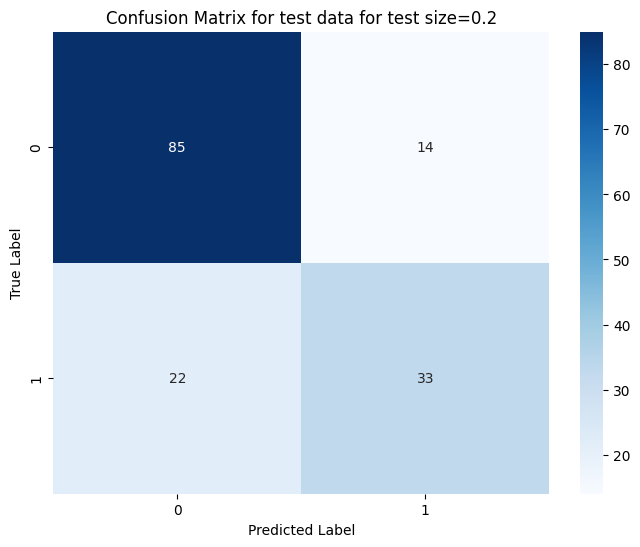

Training for Test Size 0.2.......



Training Data Summary for test_size of 0.2


### Dataset Summary ###
                0           1           2           3           4           5  \
count  614.000000  614.000000  614.000000  614.000000  614.000000  614.000000   
mean     3.742671  120.855049   69.415309   20.399023   81.438111   31.983388   
std      3.313264   32.035057   18.512599   15.433974  116.234835    7.740625   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000  100.000000   64.000000    0.000000    0.000000   27.100000   
50%      3.000000  117.000000   72.000000   23.000000   42.500000   32.000000   
75%      6.000000  139.000000   80.000000   32.000000  129.750000   36.375000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   67.100000   

                6           7  
count  614.000000  614.000000  
mean     0.469168   32.907166  
std      0.336847   11.503437  
min      0.078000   21.000000  
25% 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


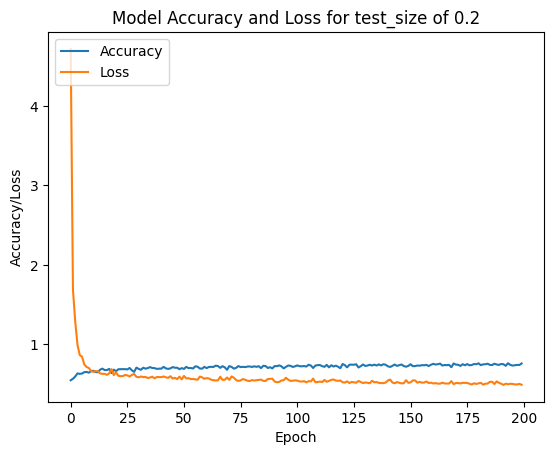

Testing for Test Size 0.2.......


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Test accuracy: 0.75
Precision on test data: 0.68
Recall on test data: 0.55
ROC AUC Score on test data: 0.70


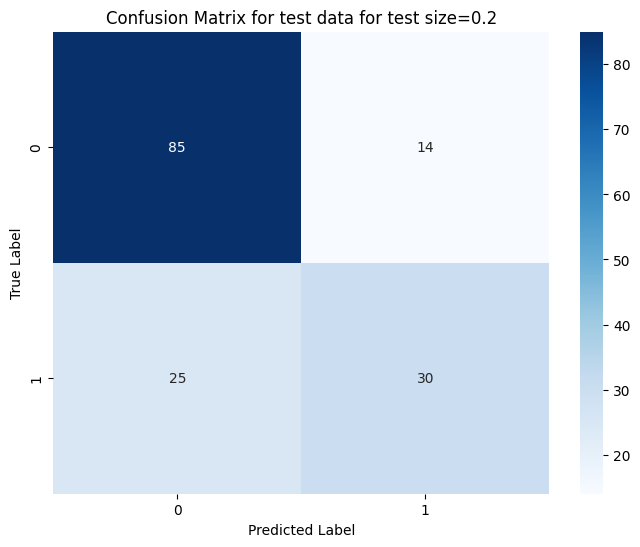

Training for Test Size 0.2.......



Training Data Summary for test_size of 0.2


### Dataset Summary ###
                0           1           2           3           4           5  \
count  614.000000  614.000000  614.000000  614.000000  614.000000  614.000000   
mean     3.742671  120.855049   69.415309   20.399023   81.438111   31.983388   
std      3.313264   32.035057   18.512599   15.433974  116.234835    7.740625   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000  100.000000   64.000000    0.000000    0.000000   27.100000   
50%      3.000000  117.000000   72.000000   23.000000   42.500000   32.000000   
75%      6.000000  139.000000   80.000000   32.000000  129.750000   36.375000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   67.100000   

                6           7  
count  614.000000  614.000000  
mean     0.469168   32.907166  
std      0.336847   11.503437  
min      0.078000   21.000000  
25% 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


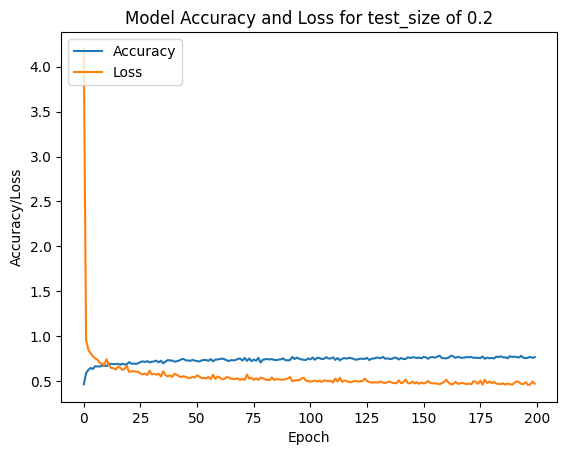

Testing for Test Size 0.2.......


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Test accuracy: 0.68
Precision on test data: 0.61
Recall on test data: 0.31
ROC AUC Score on test data: 0.60


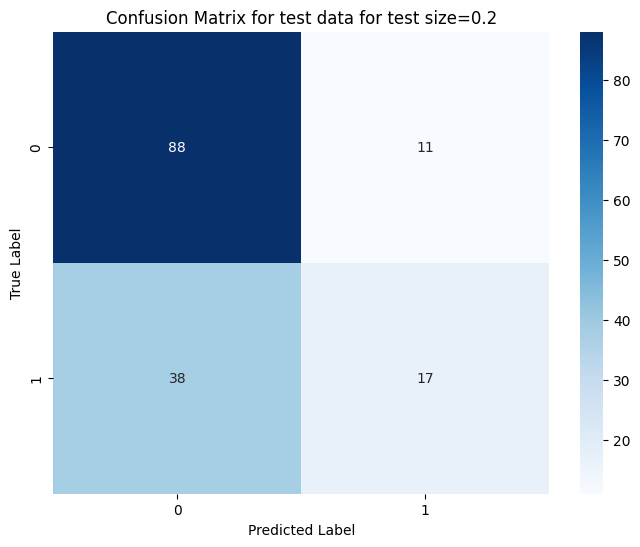

Training for Test Size 0.2.......



Training Data Summary for test_size of 0.2


### Dataset Summary ###
                0           1           2           3           4           5  \
count  614.000000  614.000000  614.000000  614.000000  614.000000  614.000000   
mean     3.742671  120.855049   69.415309   20.399023   81.438111   31.983388   
std      3.313264   32.035057   18.512599   15.433974  116.234835    7.740625   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000  100.000000   64.000000    0.000000    0.000000   27.100000   
50%      3.000000  117.000000   72.000000   23.000000   42.500000   32.000000   
75%      6.000000  139.000000   80.000000   32.000000  129.750000   36.375000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   67.100000   

                6           7  
count  614.000000  614.000000  
mean     0.469168   32.907166  
std      0.336847   11.503437  
min      0.078000   21.000000  
25% 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


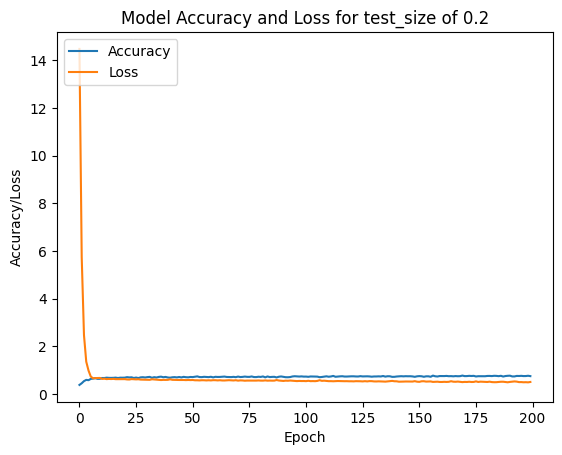

Testing for Test Size 0.2.......


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Test accuracy: 0.74
Precision on test data: 0.59
Recall on test data: 0.85
ROC AUC Score on test data: 0.77


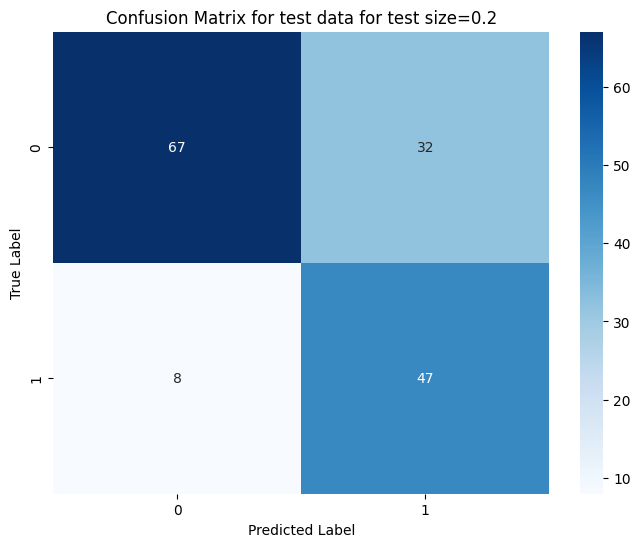

Training for Test Size 0.2.......



Training Data Summary for test_size of 0.2


### Dataset Summary ###
                0           1           2           3           4           5  \
count  614.000000  614.000000  614.000000  614.000000  614.000000  614.000000   
mean     3.742671  120.855049   69.415309   20.399023   81.438111   31.983388   
std      3.313264   32.035057   18.512599   15.433974  116.234835    7.740625   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      1.000000  100.000000   64.000000    0.000000    0.000000   27.100000   
50%      3.000000  117.000000   72.000000   23.000000   42.500000   32.000000   
75%      6.000000  139.000000   80.000000   32.000000  129.750000   36.375000   
max     17.000000  199.000000  122.000000   63.000000  846.000000   67.100000   

                6           7  
count  614.000000  614.000000  
mean     0.469168   32.907166  
std      0.336847   11.503437  
min      0.078000   21.000000  
25% 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


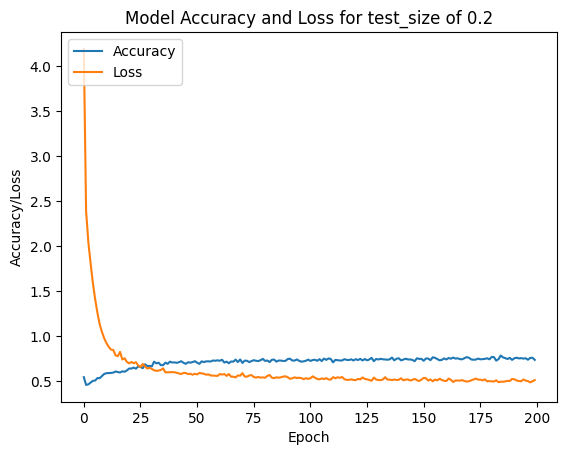

Testing for Test Size 0.2.......


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Test accuracy: 0.73
Precision on test data: 0.77
Recall on test data: 0.36
ROC AUC Score on test data: 0.65


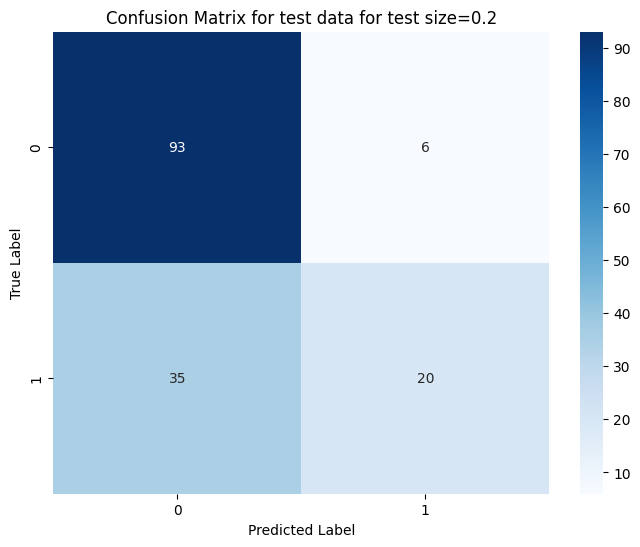

In [ ]:
# @title accuracy issues at high accuracy, for example at train size 0.8
if __name__ == "__main__":

  accurracy_list = []
  precision_list = []
  recall_list = []
  roc_auc_list = []
  test_size_val = 0.2
  n_repeat = 10


  for i in range(n_repeat):
    accuracy, conf_matrix, precision, recall, roc_auc = main_plain(preprocess=False, epochs=200, test_size = test_size_val, batch_size=15)
    accurracy_list.append(accuracy)
    precision_list.append(precision)
    recall_list.append(recall)
    roc_auc_list.append(roc_auc)


In [ ]:
# @title print the avg metrics result at accuracy 0.8
print(f"Average Metrices for train size {1-test_size_val}\n\n")
print(f"Average Accuracy: {np.mean(accurracy_list)}")
print(f"Average Precision: {np.mean(precision_list)}")
print(f"Average Recall: {np.mean(recall_list)}")
print(f"Average ROC AUC: {np.mean(roc_auc_list)}")

Average Metrices for train size 0.8


Average Accuracy: 0.7376623511314392
Average Precision: 0.6778663754712032
Average Recall: 0.5327272727272727
Average ROC AUC: 0.6921212121212121


preprocessing Train Set Data....


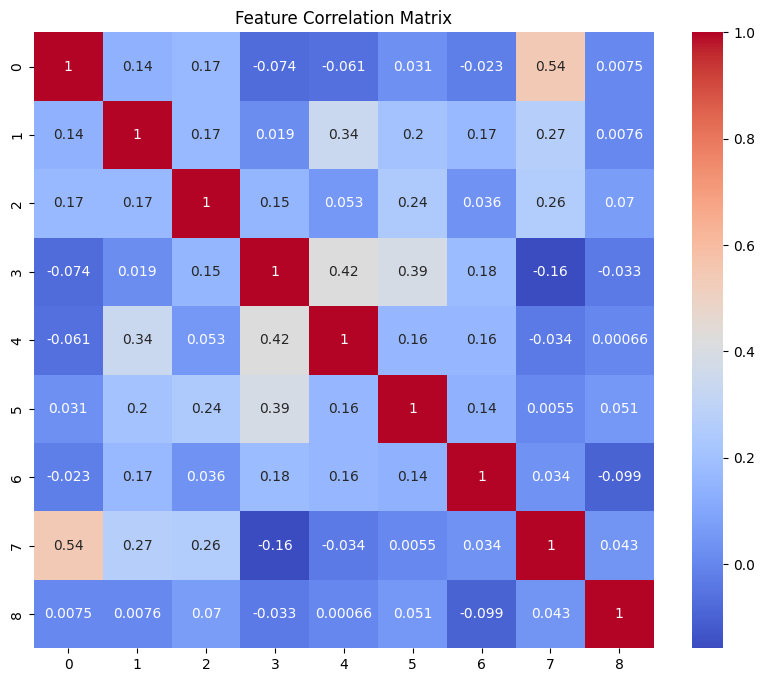

preprocessing Test Set Data....


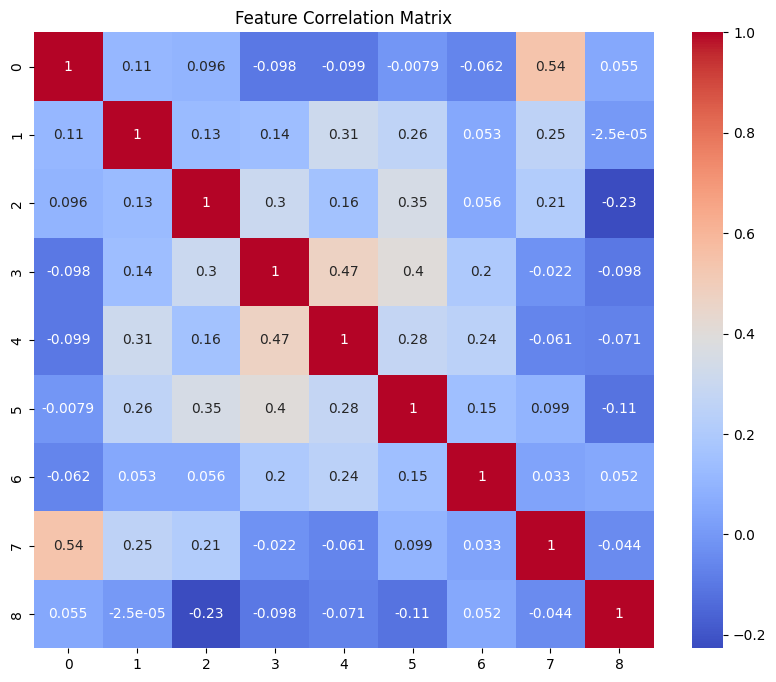

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
K=3: Avg Validation Accuracy=0.74, Precision=0.65, Recall=0.57, ROC AUC=0.70


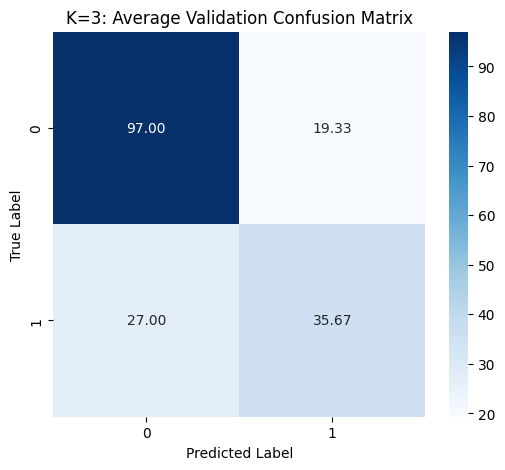

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
preprocessing Train Set Data....


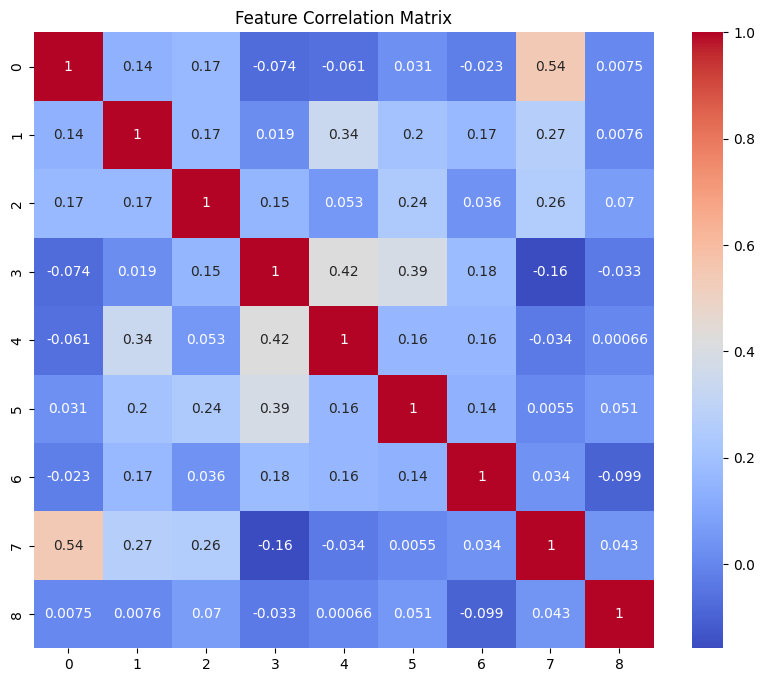

preprocessing Test Set Data....


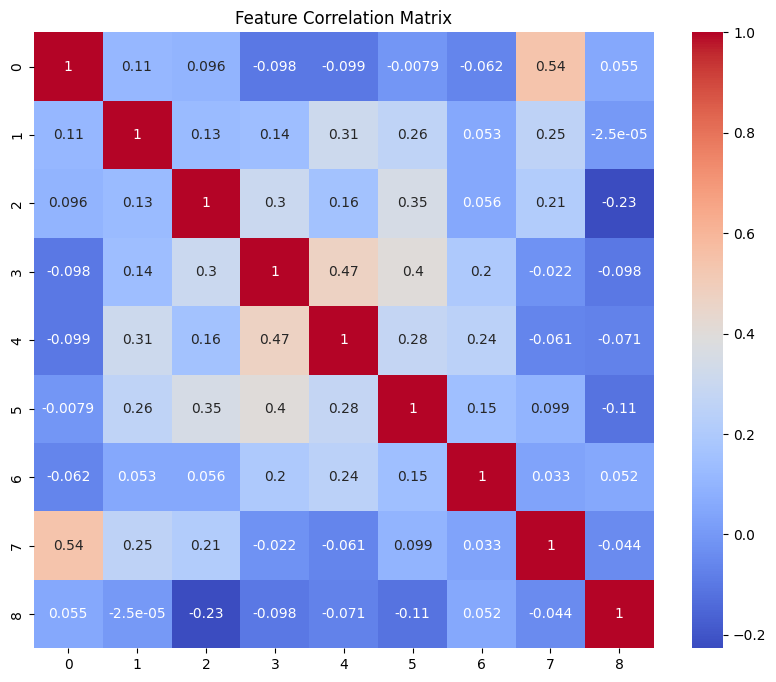

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
K=4: Avg Validation Accuracy=0.77, Precision=0.70, Recall=0.63, ROC AUC=0.74


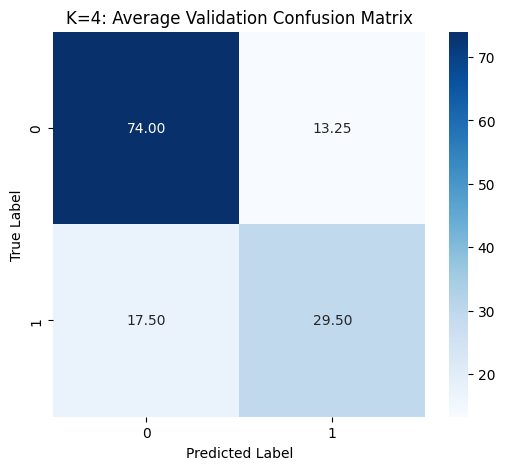

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
preprocessing Train Set Data....


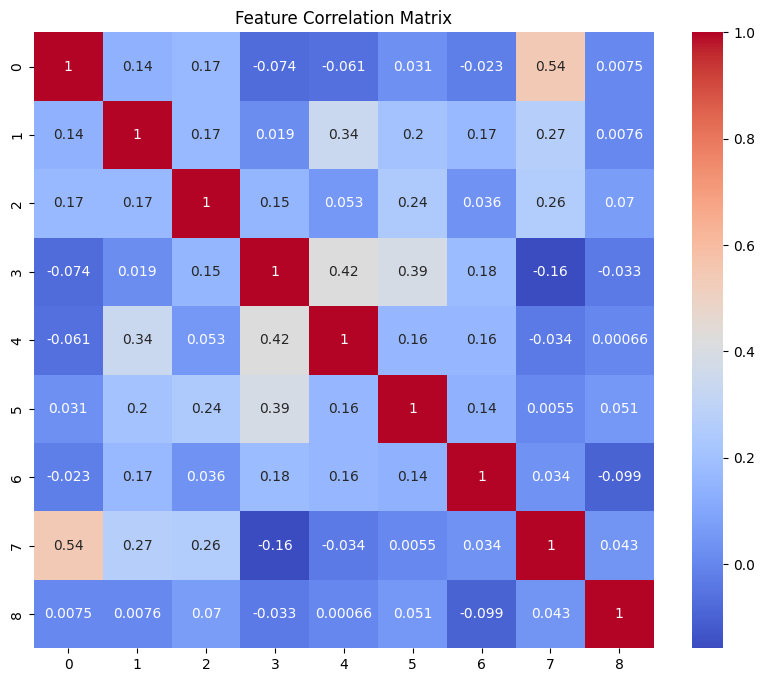

preprocessing Test Set Data....


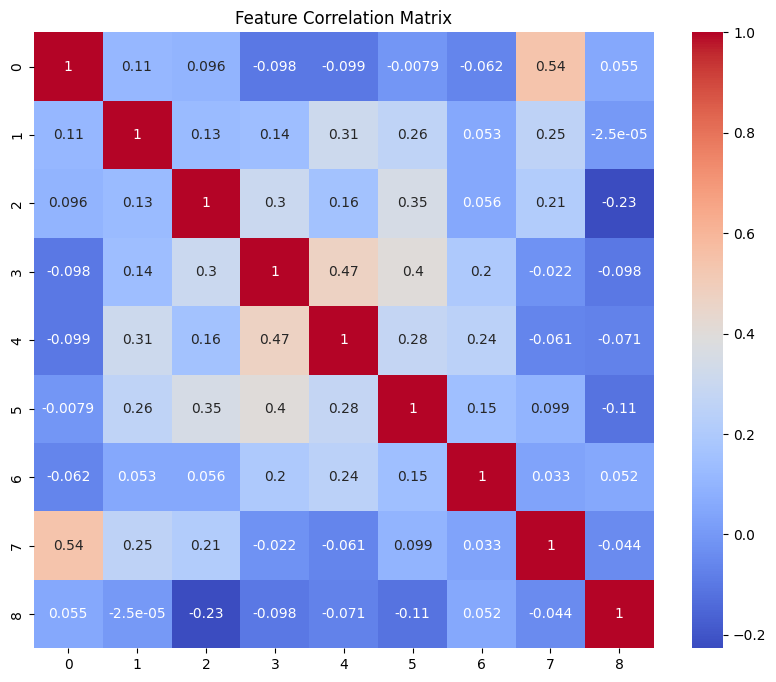

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
K=5: Avg Validation Accuracy=0.74, Precision=0.65, Recall=0.60, ROC AUC=0.71


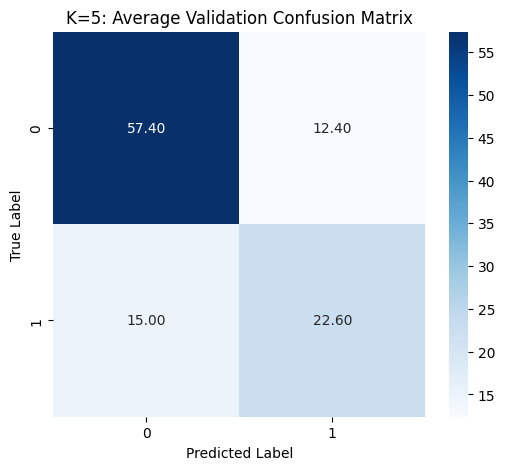

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
preprocessing Train Set Data....


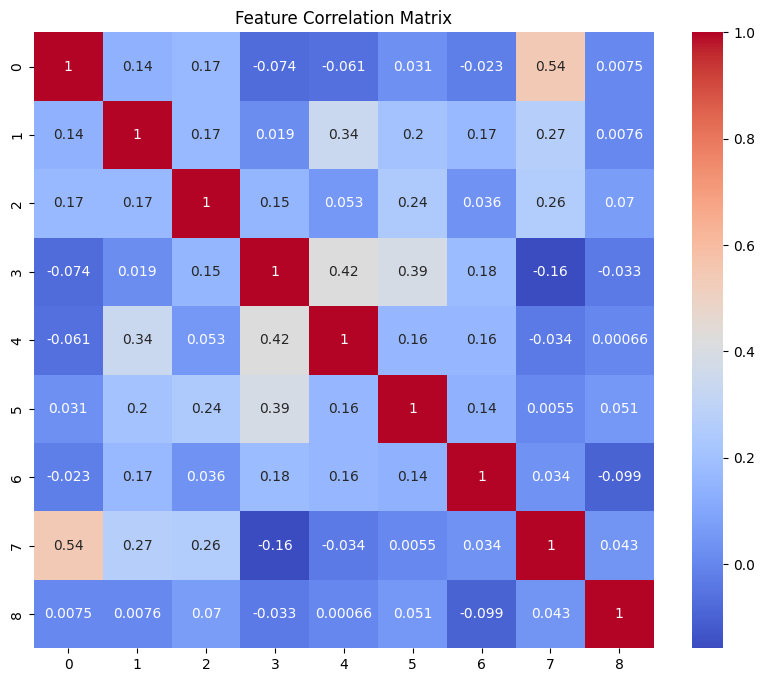

preprocessing Test Set Data....


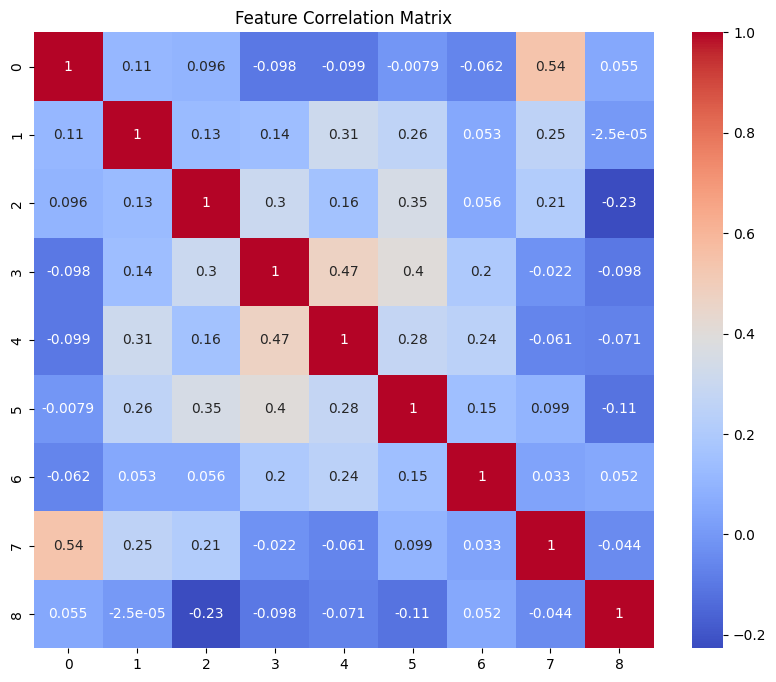

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
K=6: Avg Validation Accuracy=0.77, Precision=0.69, Recall=0.64, ROC AUC=0.74


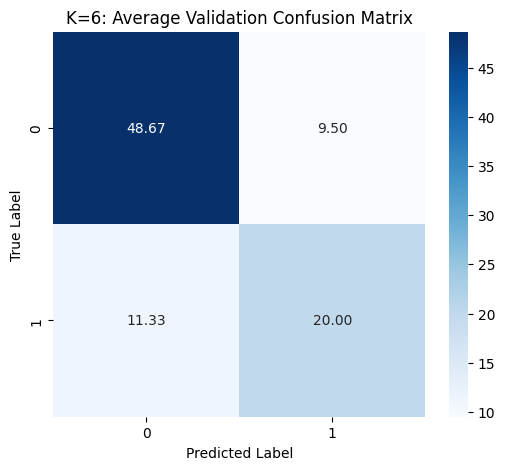

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
preprocessing Train Set Data....


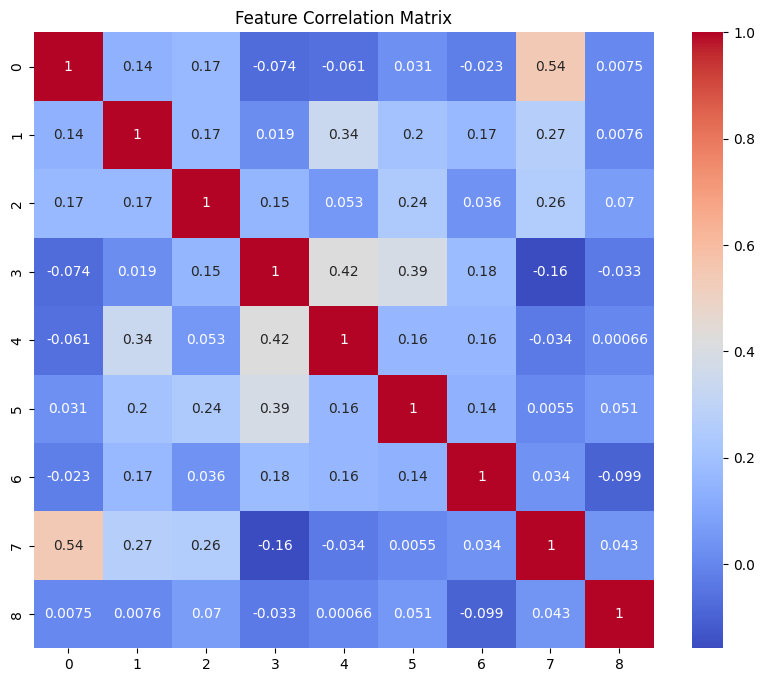

preprocessing Test Set Data....


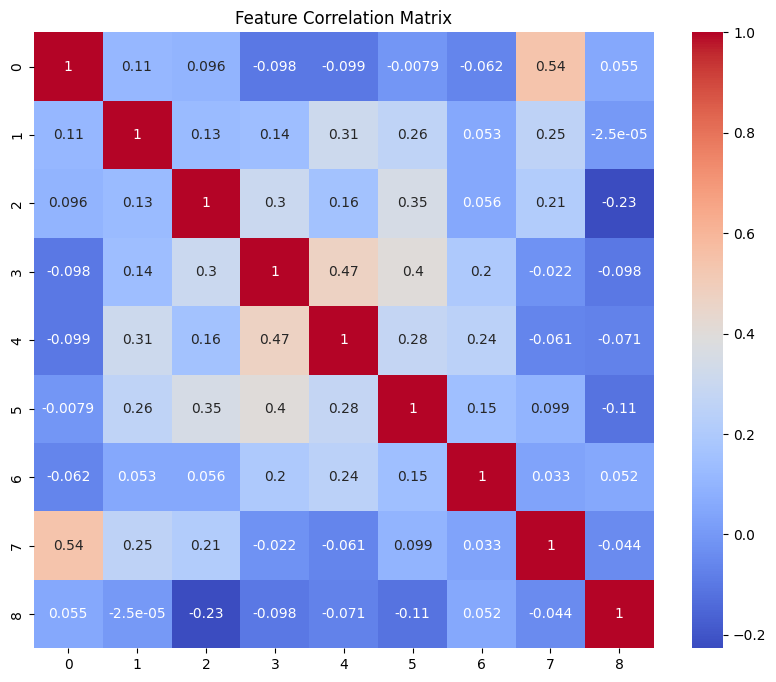

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
K=7: Avg Validation Accuracy=0.73, Precision=0.63, Recall=0.57, ROC AUC=0.69


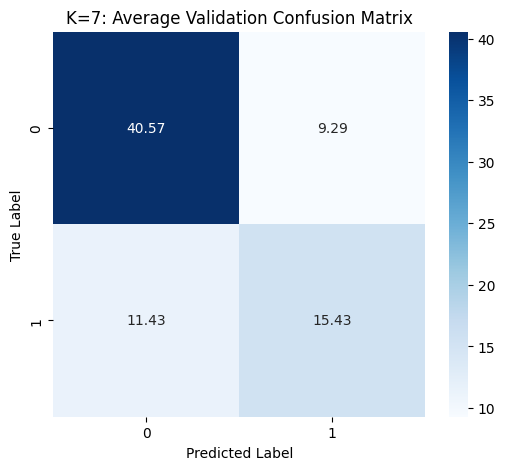

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
preprocessing Train Set Data....


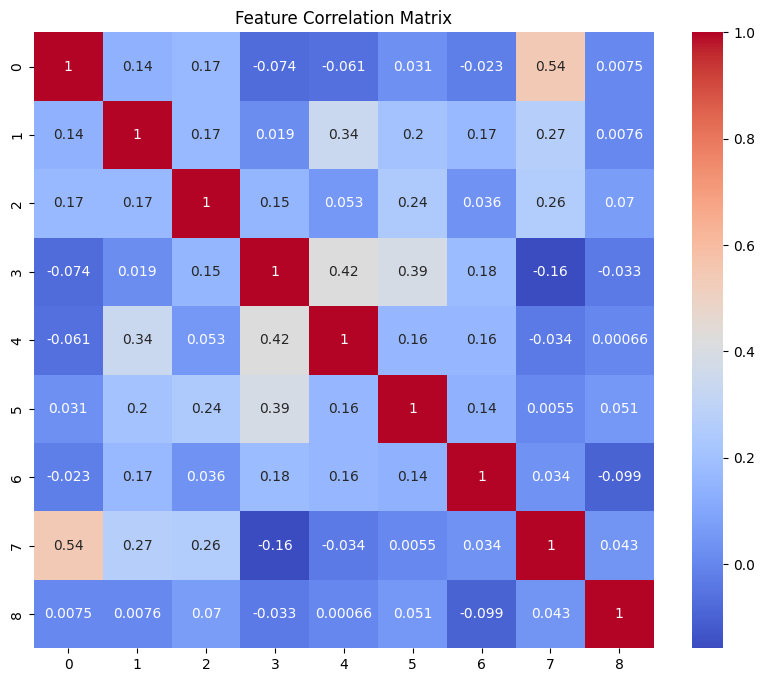

preprocessing Test Set Data....


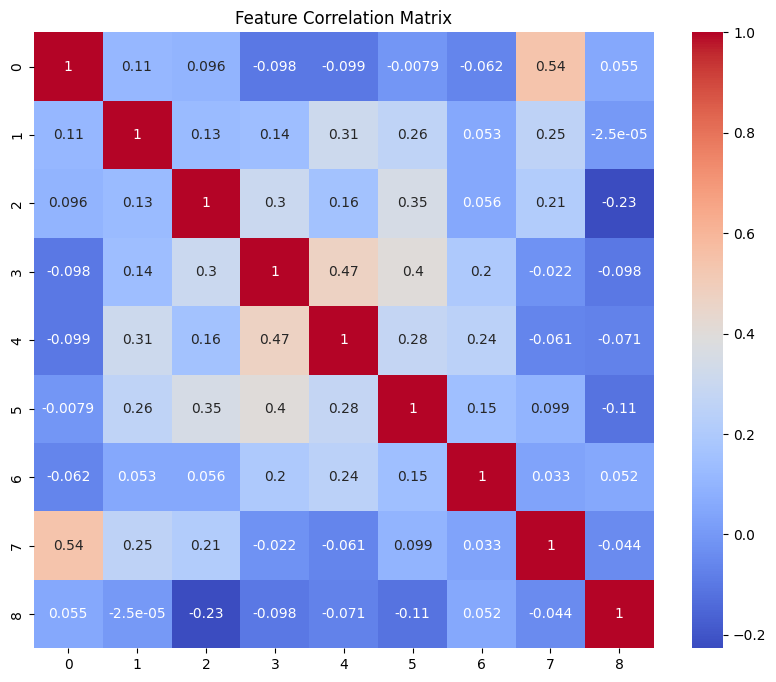

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
K=8: Avg Validation Accuracy=0.76, Precision=0.68, Recall=0.62, ROC AUC=0.73


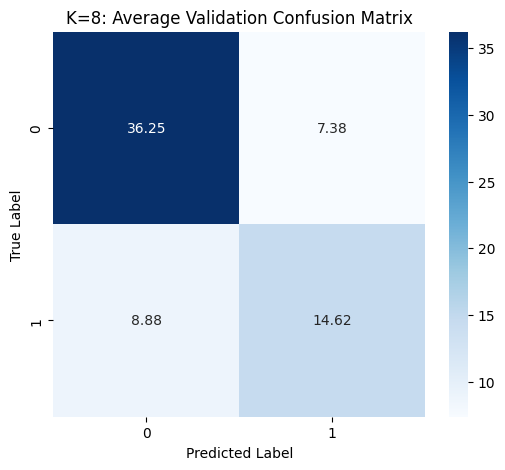

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
preprocessing Train Set Data....


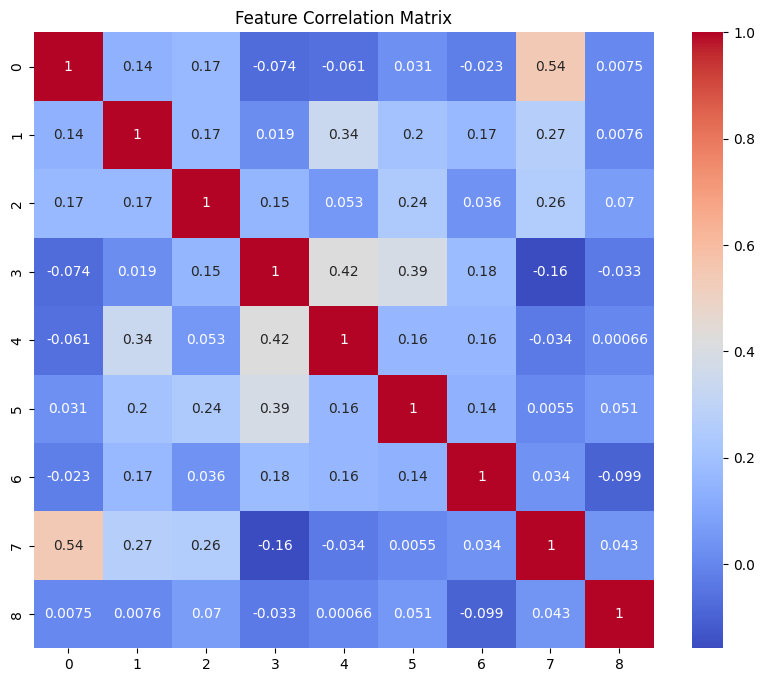

preprocessing Test Set Data....


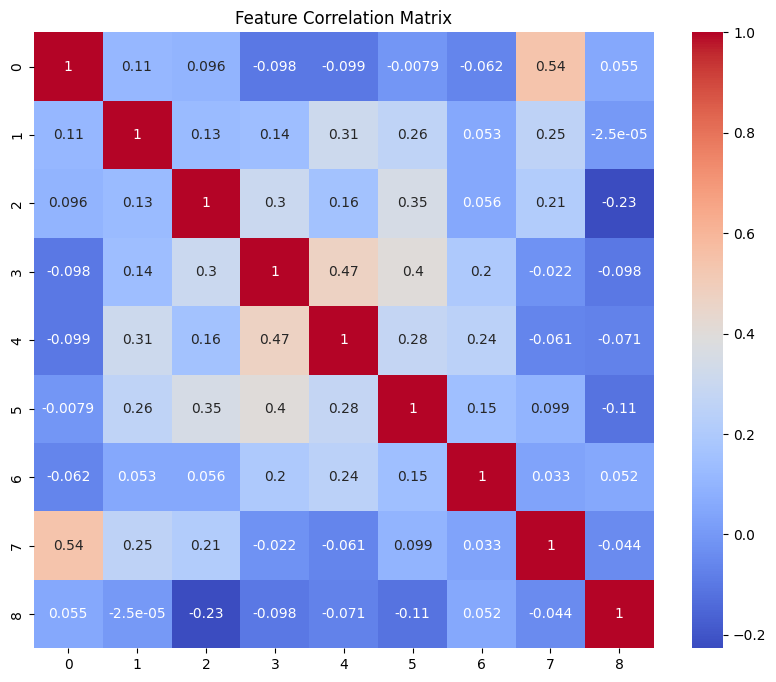

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
K=9: Avg Validation Accuracy=0.76, Precision=0.67, Recall=0.64, ROC AUC=0.73


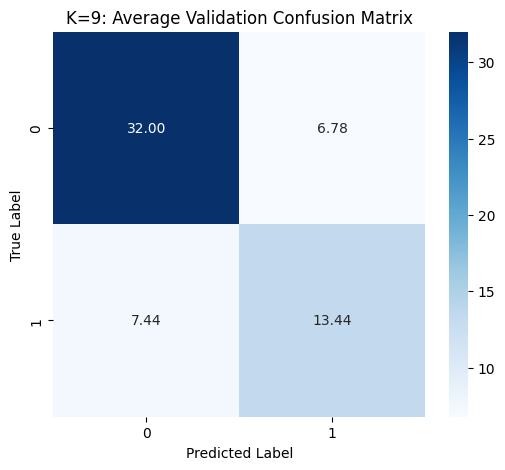

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
preprocessing Train Set Data....


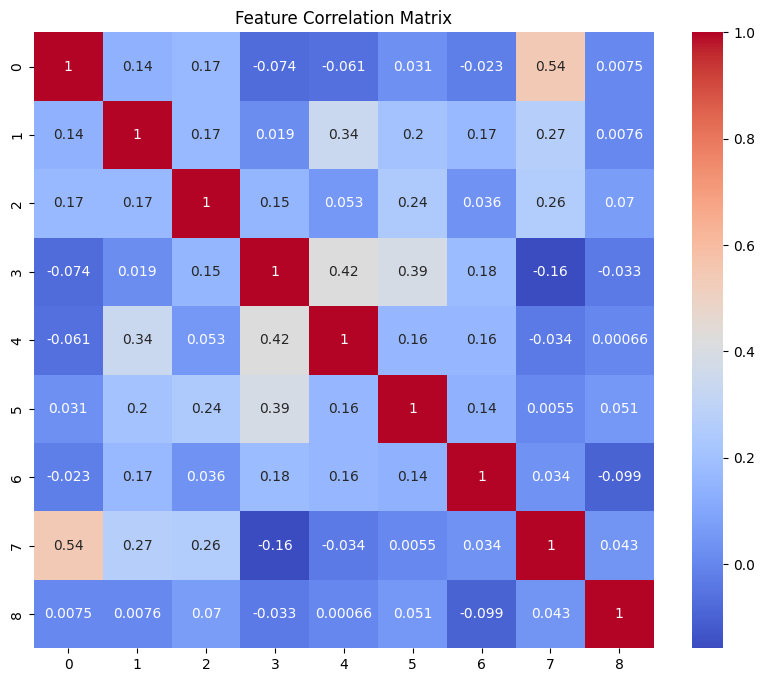

preprocessing Test Set Data....


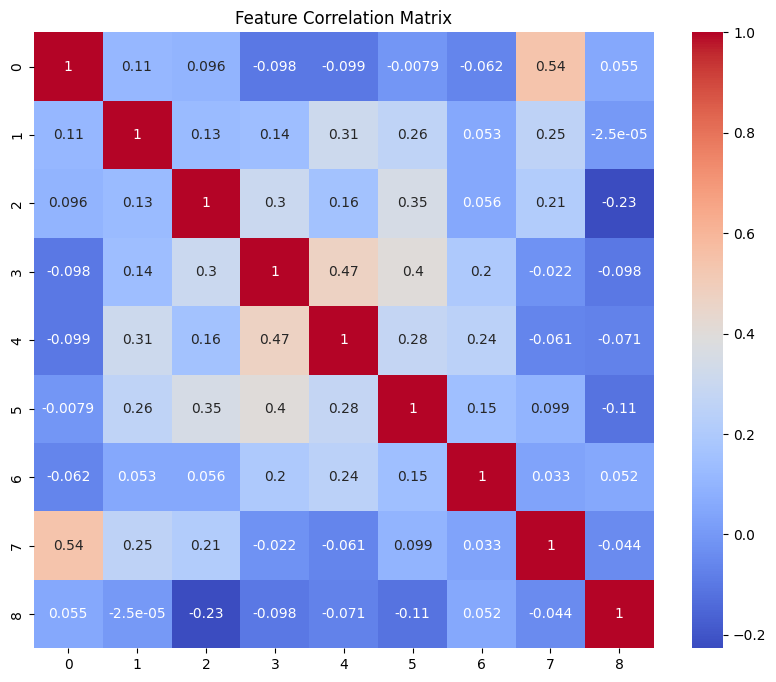

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
K=10: Avg Validation Accuracy=0.74, Precision=0.64, Recall=0.61, ROC AUC=0.71


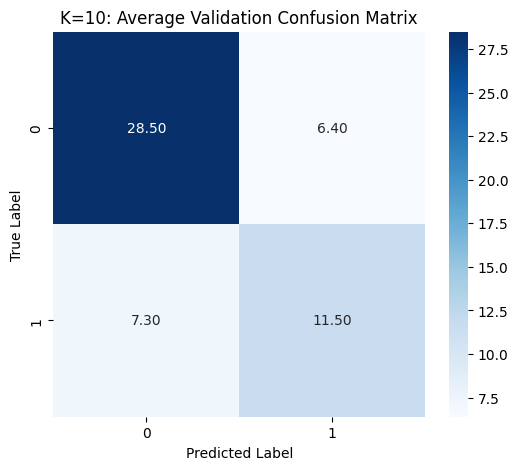

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

    K  Avg Validation Accuracy  Avg Validation Precision  \
0   3                 0.741155                  0.650955   
1   4                 0.770868                  0.697696   
2   5                 0.744860                  0.652365   
3   6                 0.767124                  0.687284   
4   7                 0.730080                  0.629619   
5   8                 0.757819                  0.678163   
6   9                 0.761676                  0.670178   
7  10                 0.744934                  0.642409   

   Avg Validation Recall  Avg Validation ROC AUC  Avg Test Accuracy  \
0               0.567243                0.700244           0.731602   
1               0.628494                0.738301           0.722944   
2               0.597819                0.709637           0.761905   
3               0.639264                0.738086           0.783550   
4               0.573548                0.694507           0.757576   
5               0.621774         

In [ ]:
# @title cross-validation


def main_cv(X_train, y_train, X_test, y_test, k=5, epochs=150, batch_size=10, preprocess =False):
    kf = KFold(n_splits=k, shuffle=True, random_state=42)

    if preprocess:
        print(f"preprocessing Train Set Data....")
        train_preprocessor = DataPreprocessor()
        X_train = train_preprocessor.preprocess(X_train)
        train_preprocessor.plot_correlation(pd.concat([X_train, y_train], axis=1))

        print(f"preprocessing Test Set Data....")
        test_preprocessor = DataPreprocessor()
        X_test = test_preprocessor.preprocess(X_test)
        test_preprocessor.plot_correlation(pd.concat([X_test, y_test], axis=1))

    accuracies, precisions, recalls, roc_aucs, conf_matrices = [], [], [], [], []
    for train_index, val_index in kf.split(X_train):
        X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
        y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

        classifier = DiabetesClassifier()
        classifier.train(X_train_fold, y_train_fold, epochs=epochs, batch_size=batch_size)
        accuracy, conf_matrix, precision, recall, roc_auc = classifier.evaluate(X_val_fold, y_val_fold)

        accuracies.append(accuracy)
        precisions.append(precision)
        recalls.append(recall)
        roc_aucs.append(roc_auc)
        conf_matrices.append(conf_matrix)

    avg_accuracy = np.mean(accuracies)
    avg_precision = np.mean(precisions)
    avg_recall = np.mean(recalls)
    avg_roc_auc = np.mean(roc_aucs)

    print(f'K={k}: Avg Validation Accuracy={avg_accuracy:.2f}, Precision={avg_precision:.2f}, Recall={avg_recall:.2f}, ROC AUC={avg_roc_auc:.2f}')

    avg_conf_matrix = np.mean(conf_matrices, axis=0)
    plt.figure(figsize=(6,5))
    sns.heatmap(avg_conf_matrix, annot=True, fmt='.2f', cmap='Blues')
    plt.title(f'K={k}: Average Validation Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    # Final evaluation on the 30% test set
    final_classifier = DiabetesClassifier()
    final_classifier.train(X_train, y_train, epochs=epochs, batch_size=batch_size)

    # Average test accuracy is determined due to class imbalance in the datasets

    test_accuracy, test_conf_matrix, test_precision, test_recall, test_roc_auc = final_classifier.evaluate(X_test, y_test)

    return avg_accuracy, avg_precision, avg_recall, avg_roc_auc, test_accuracy, test_conf_matrix, test_precision, test_recall, test_roc_auc

if __name__ == "__main__":
    X, y = load_data('pima-indians-diabetes.csv')
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    results = []
    for k in range(3, 11):
        avg_accuracy, avg_precision, avg_recall, avg_roc_auc, test_accuracy, test_conf_matrix, test_precision, test_recall, test_roc_auc = main_cv(X_train, y_train, X_test, y_test, k=k, epochs=200, batch_size=15,  preprocess =True)
        results.append([k, avg_accuracy, avg_precision, avg_recall, avg_roc_auc, test_accuracy, test_precision, test_recall, test_roc_auc])

    results_df = pd.DataFrame(results, columns=['K',  'Avg Validation Accuracy', 'Avg Validation Precision', 'Avg Validation Recall', 'Avg Validation ROC AUC', 'Avg Test Accuracy', 'Avg Test Precision', 'Avg Test Recall', 'Avg Test ROC AUC'])
    results_df.to_csv('cross_validation_results.csv', index=False)
    files.download('cross_validation_results.csv')
    print(results_df)


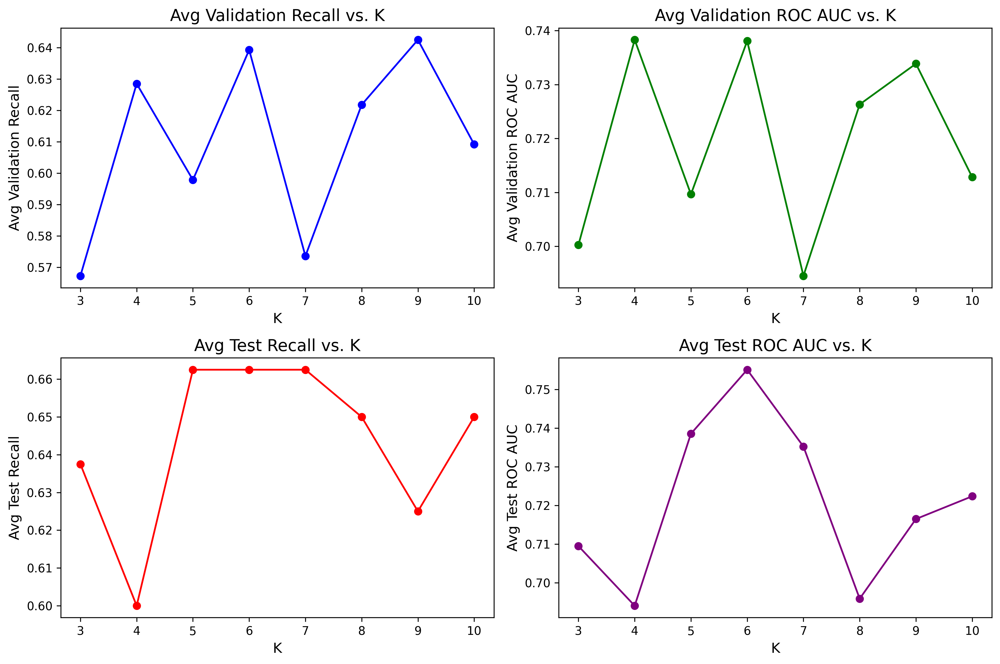

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# @title cross validation plots (only recall and ruc-aoc for validation and test set)

# Create the 2x2 plot
fig, axes = plt.subplots(2, 2, figsize=(12, 8), dpi=300)  # High resolution

# Define colors for each subplot
colors = ['blue', 'green', 'red', 'purple']

# Plot Avg Validation Recall vs. K
axes[0, 0].plot(results_df['K'], results_df['Avg Validation Recall'], marker='o', color=colors[0])
axes[0, 0].set_title('Avg Validation Recall vs. K', fontsize=14)
axes[0, 0].set_xlabel('K', fontsize=12)
axes[0, 0].set_ylabel('Avg Validation Recall', fontsize=12)

# Plot Avg Validation ROC AUC vs. K
axes[0, 1].plot(results_df['K'], results_df['Avg Validation ROC AUC'], marker='o', color=colors[1])
axes[0, 1].set_title('Avg Validation ROC AUC vs. K', fontsize=14)
axes[0, 1].set_xlabel('K', fontsize=12)
axes[0, 1].set_ylabel('Avg Validation ROC AUC', fontsize=12)

# Plot Avg Test Recall vs. K
axes[1, 0].plot(results_df['K'], results_df['Avg Test Recall'], marker='o', color=colors[2])
axes[1, 0].set_title('Avg Test Recall vs. K', fontsize=14)
axes[1, 0].set_xlabel('K', fontsize=12)
axes[1, 0].set_ylabel('Avg Test Recall', fontsize=12)

# Plot Avg Test ROC AUC vs. K
axes[1, 1].plot(results_df['K'], results_df['Avg Test ROC AUC'], marker='o', color=colors[3])
axes[1, 1].set_title('Avg Test ROC AUC vs. K', fontsize=14)
axes[1, 1].set_xlabel('K', fontsize=12)
axes[1, 1].set_ylabel('Avg Test ROC AUC', fontsize=12)

plt.tight_layout()
plt.savefig('k_vs_metrics_cross_validation.png', dpi=300)
plt.show()  # To display the plot in the notebook

files.download('k_vs_metrics_cross_validation.png')

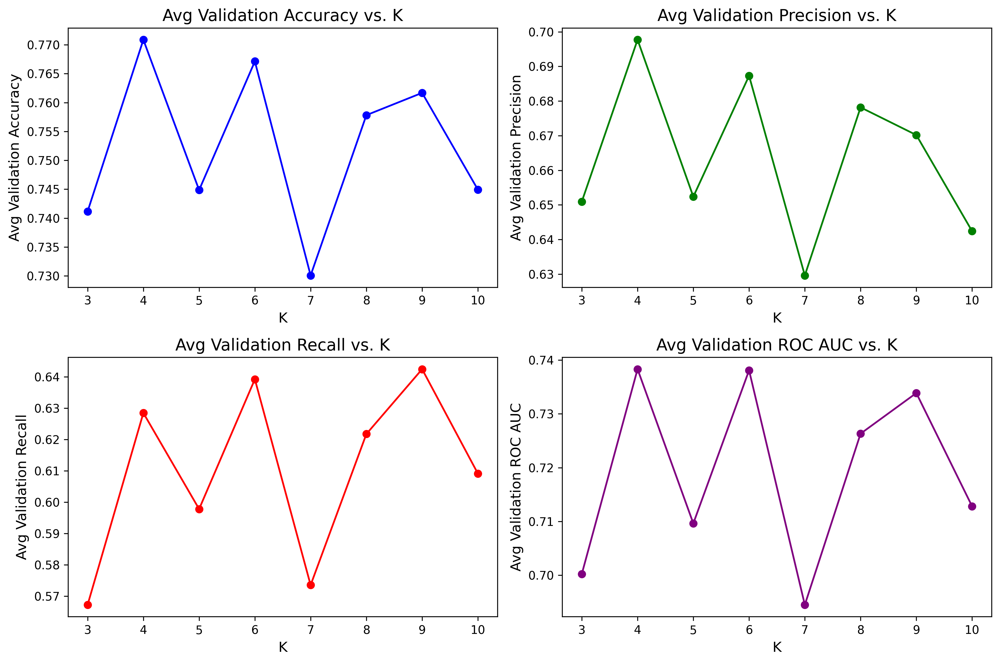

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# @title cross validation plots (for validation set)

# Create the 2x2 plot
fig, axes = plt.subplots(2, 2, figsize=(12, 8), dpi=300)  # High resolution

# Define colors for each subplot
colors = ['blue', 'green', 'red', 'purple']

# 'Avg Validation Accuracy', 'Avg Validation Precision'
# Plot Avg Validation Accuracy vs. K
axes[0, 0].plot(results_df['K'], results_df['Avg Validation Accuracy'], marker='o', color=colors[0])
axes[0, 0].set_title('Avg Validation Accuracy vs. K', fontsize=14)
axes[0, 0].set_xlabel('K', fontsize=12)
axes[0, 0].set_ylabel('Avg Validation Accuracy', fontsize=12)

# Plot Avg Validation Precision vs. K
axes[0, 1].plot(results_df['K'], results_df['Avg Validation Precision'], marker='o', color=colors[1])
axes[0, 1].set_title('Avg Validation Precision vs. K', fontsize=14)
axes[0, 1].set_xlabel('K', fontsize=12)
axes[0, 1].set_ylabel('Avg Validation Precision', fontsize=12)

# Plot Avg Validation Recall vs. K
axes[1, 0].plot(results_df['K'], results_df['Avg Validation Recall'], marker='o', color=colors[2])
axes[1, 0].set_title('Avg Validation Recall vs. K', fontsize=14)
axes[1, 0].set_xlabel('K', fontsize=12)
axes[1, 0].set_ylabel('Avg Validation Recall', fontsize=12)

# Plot Avg Validation ROC AUC vs. K
axes[1, 1].plot(results_df['K'], results_df['Avg Validation ROC AUC'], marker='o', color=colors[3])
axes[1, 1].set_title('Avg Validation ROC AUC vs. K', fontsize=14)
axes[1, 1].set_xlabel('K', fontsize=12)
axes[1, 1].set_ylabel('Avg Validation ROC AUC', fontsize=12)

plt.tight_layout()
plt.savefig('k_vs_metrics_cross_validation_v2.png', dpi=300)
plt.show()  # To display the plot in the notebook

files.download('k_vs_metrics_cross_validation_v2.png')

**Task-2**: Vary the number of neurons in Layer#1. Try values in the range [10,20]. Document the results and identify the best cases. Try to intuitively justify the reason behind the best hyperparameter values.

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


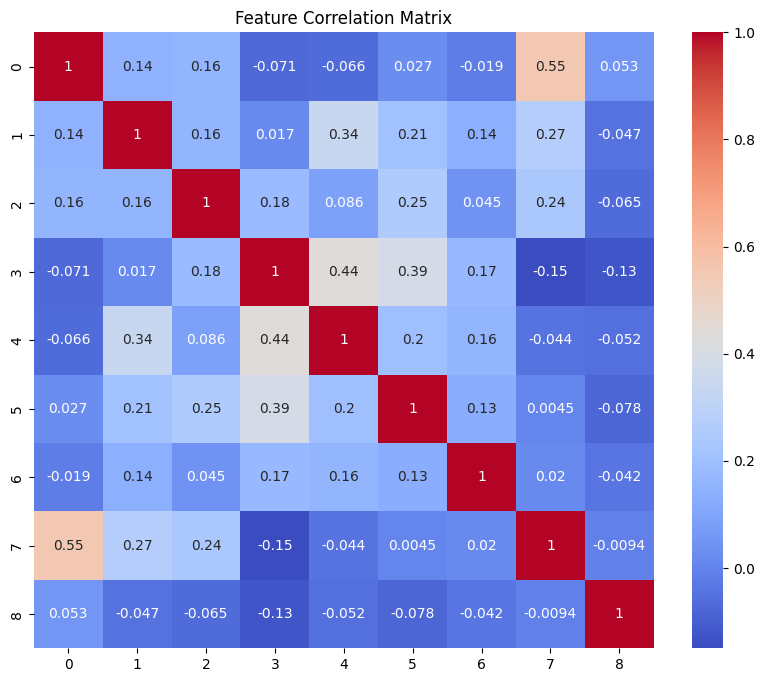

preprocessing Test Set Data....


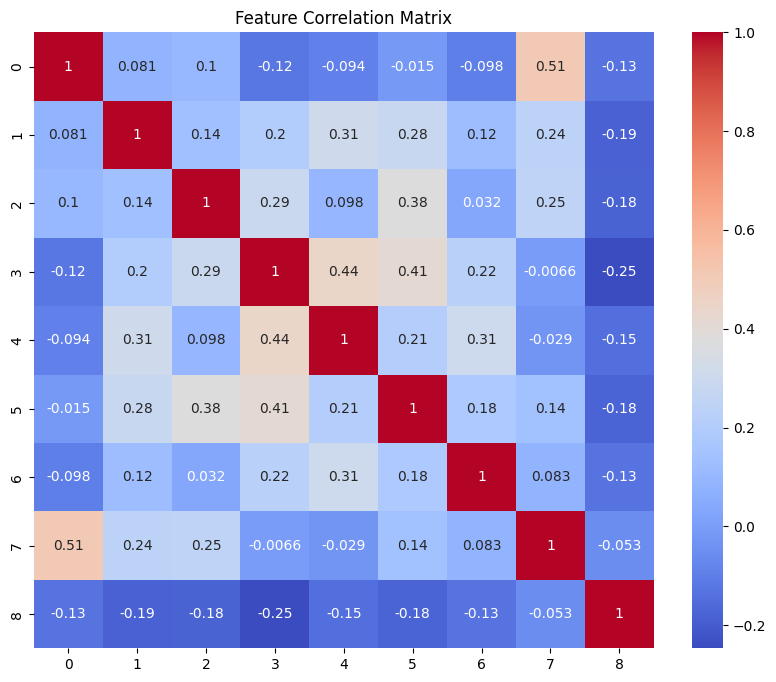

Training for number of neurons 10 in Layer 1 and neurons 8 in Layer 2.......





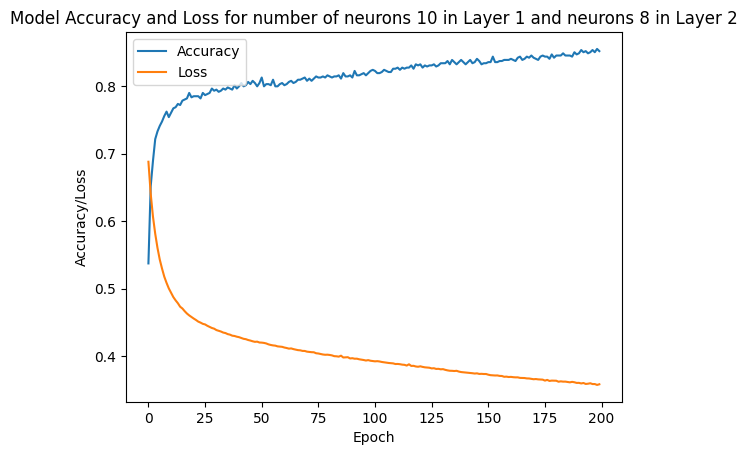

Evaluating the model on the train set for number of neurons 10 in Layer 1 and neurons 8 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train accuracy: 0.85
Precision on train data: 0.81
Recall on train data: 0.75
ROC AUC Score on train data: 0.83


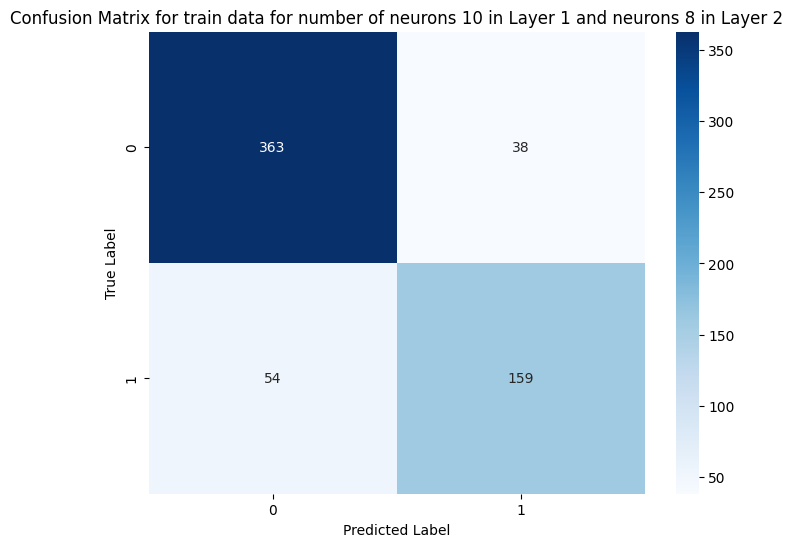

Evaluating the model on the test set for number of neurons 10 in Layer 1 and neurons 8 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Test accuracy: 0.77
Precision on test data: 0.69
Recall on test data: 0.67
ROC AUC Score on test data: 0.75


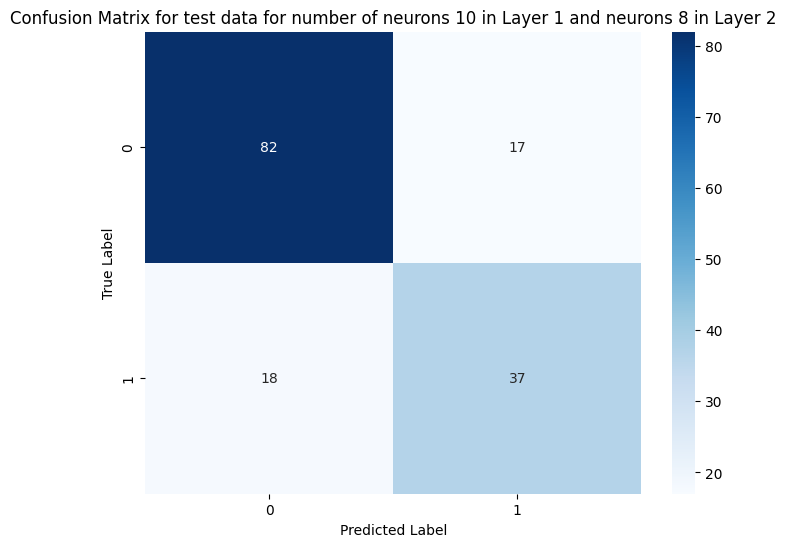

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


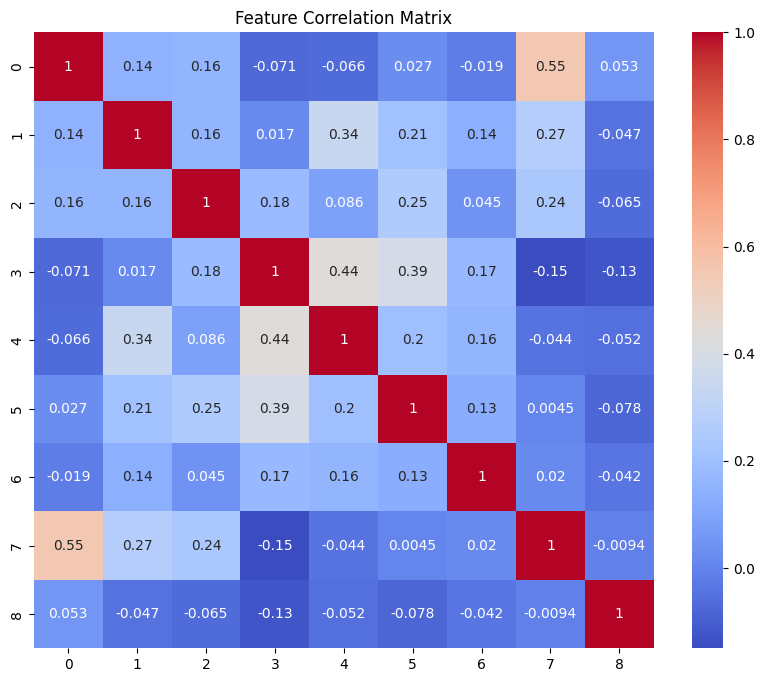

preprocessing Test Set Data....


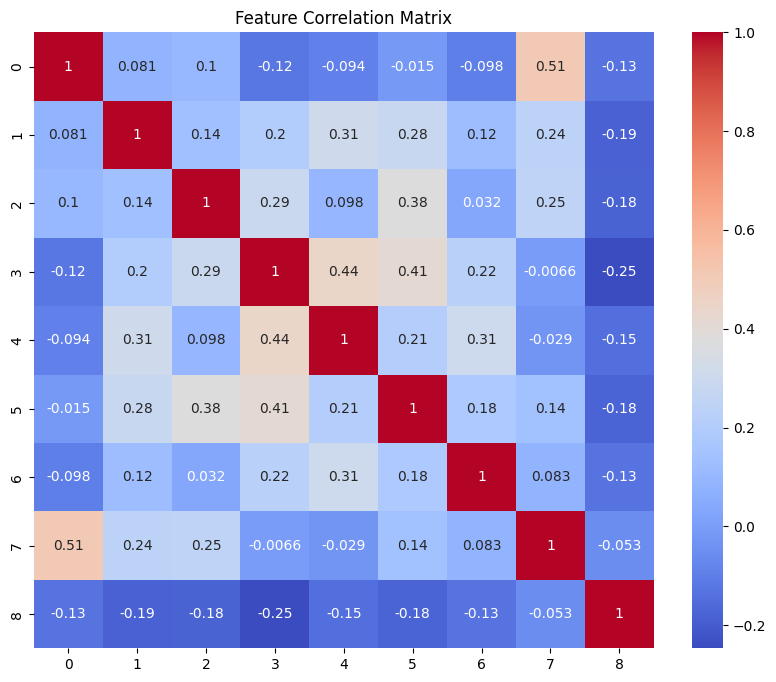

Training for number of neurons 11 in Layer 1 and neurons 8 in Layer 2.......





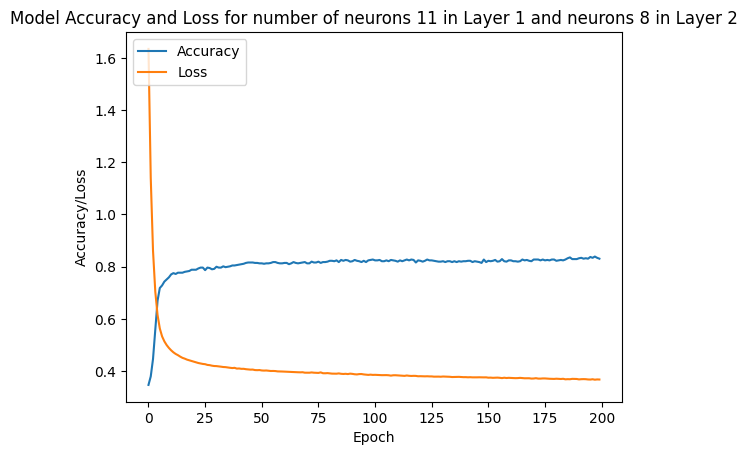

Evaluating the model on the train set for number of neurons 11 in Layer 1 and neurons 8 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train accuracy: 0.84
Precision on train data: 0.79
Recall on train data: 0.74
ROC AUC Score on train data: 0.82


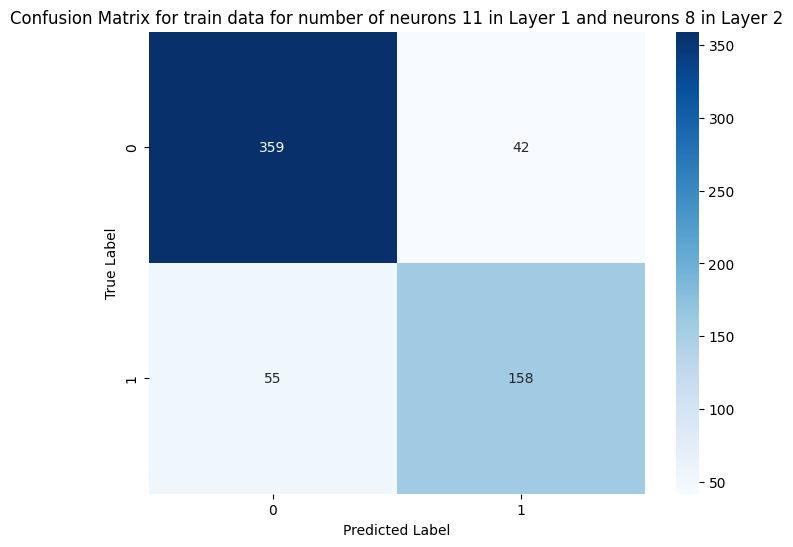

Evaluating the model on the test set for number of neurons 11 in Layer 1 and neurons 8 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Test accuracy: 0.75
Precision on test data: 0.67
Recall on test data: 0.60
ROC AUC Score on test data: 0.72


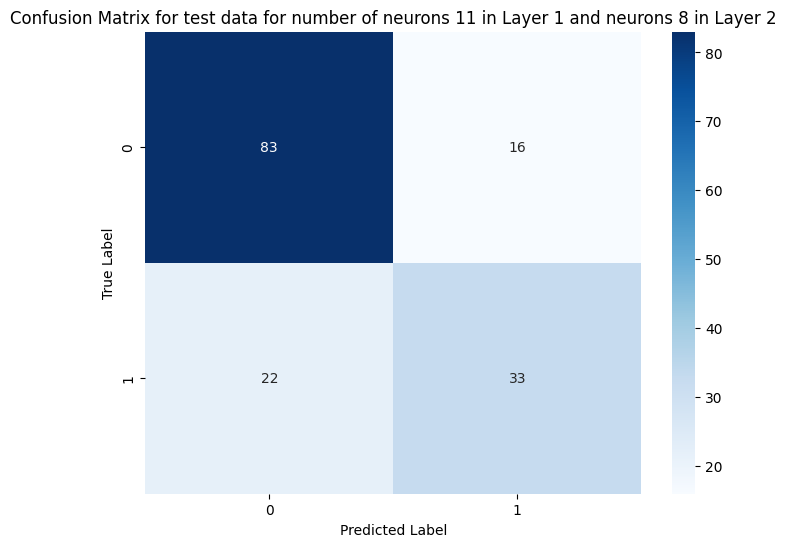

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


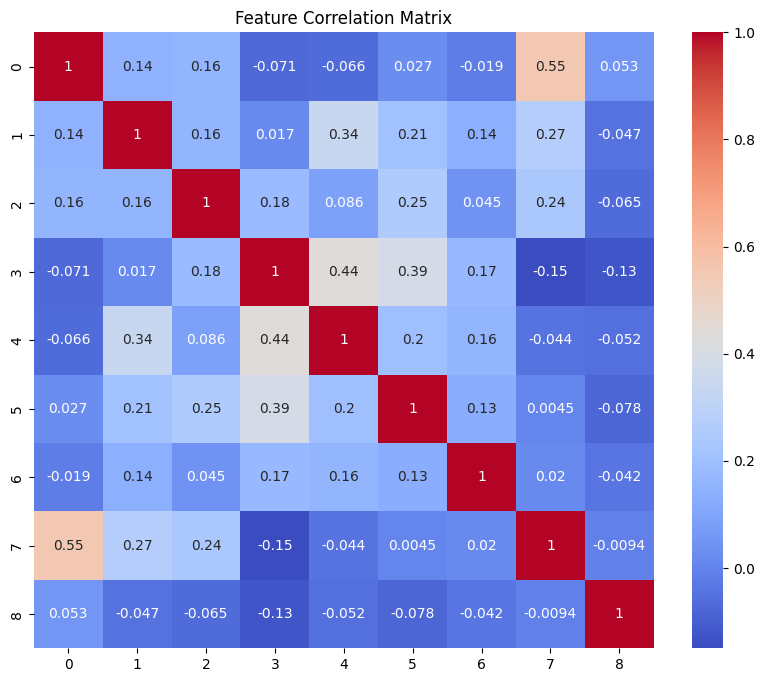

preprocessing Test Set Data....


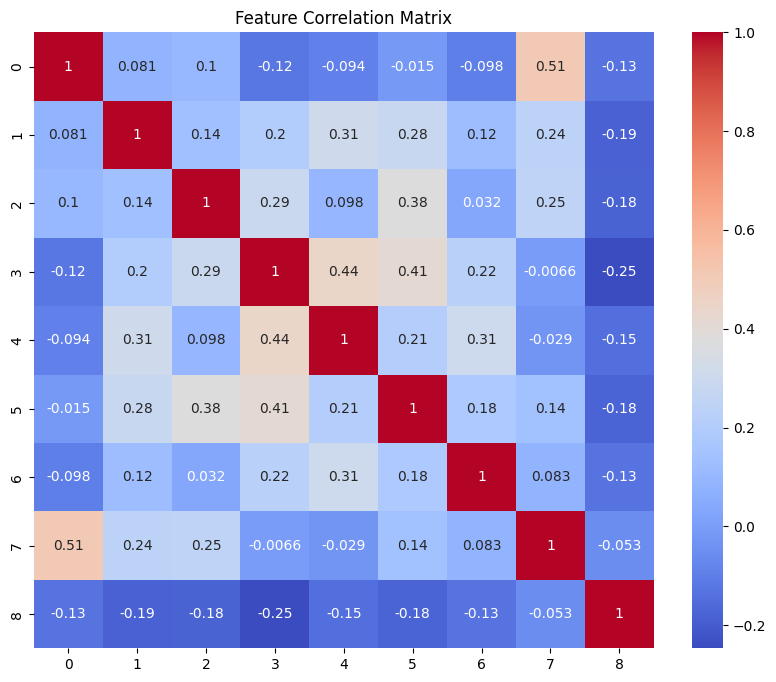

Training for number of neurons 12 in Layer 1 and neurons 8 in Layer 2.......





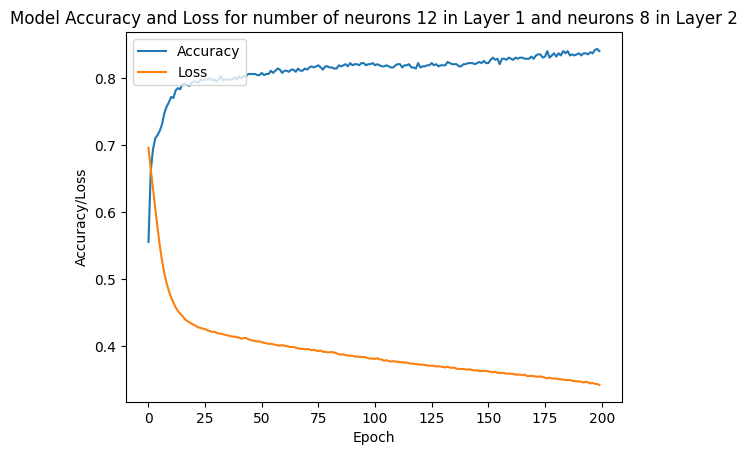

Evaluating the model on the train set for number of neurons 12 in Layer 1 and neurons 8 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train accuracy: 0.84
Precision on train data: 0.78
Recall on train data: 0.75
ROC AUC Score on train data: 0.82


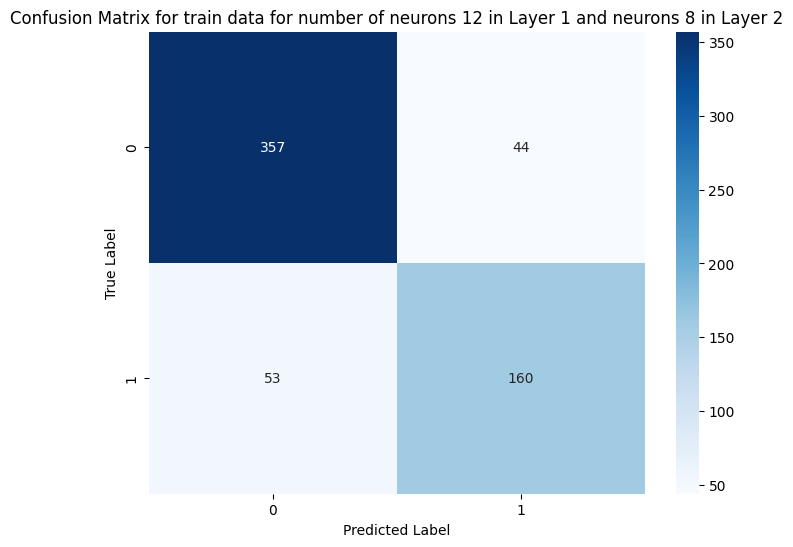

Evaluating the model on the test set for number of neurons 12 in Layer 1 and neurons 8 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Test accuracy: 0.72
Precision on test data: 0.61
Recall on test data: 0.62
ROC AUC Score on test data: 0.70


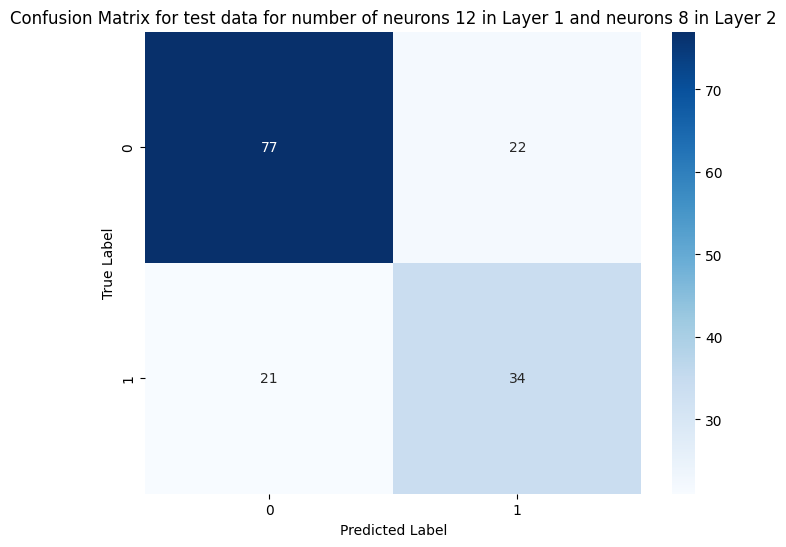

preprocessing Train Set Data....


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


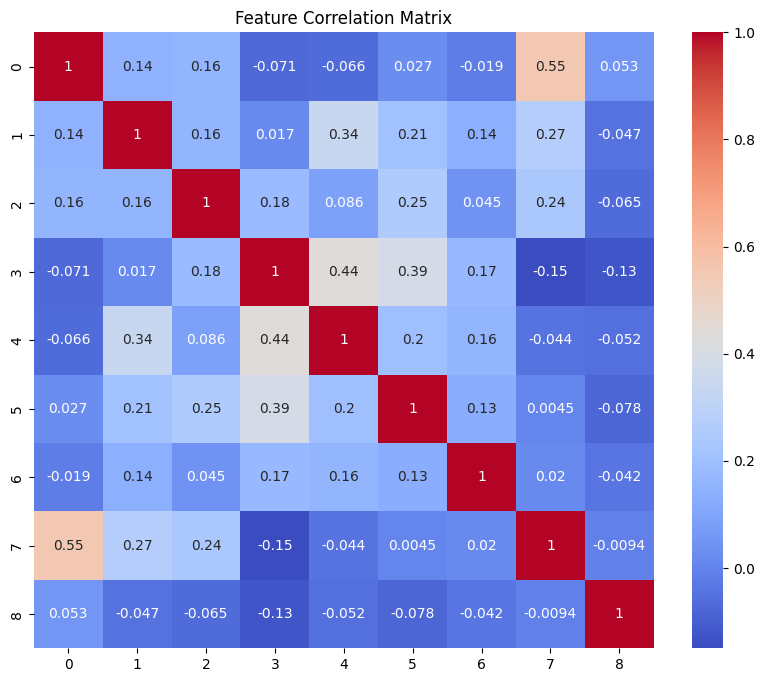

preprocessing Test Set Data....


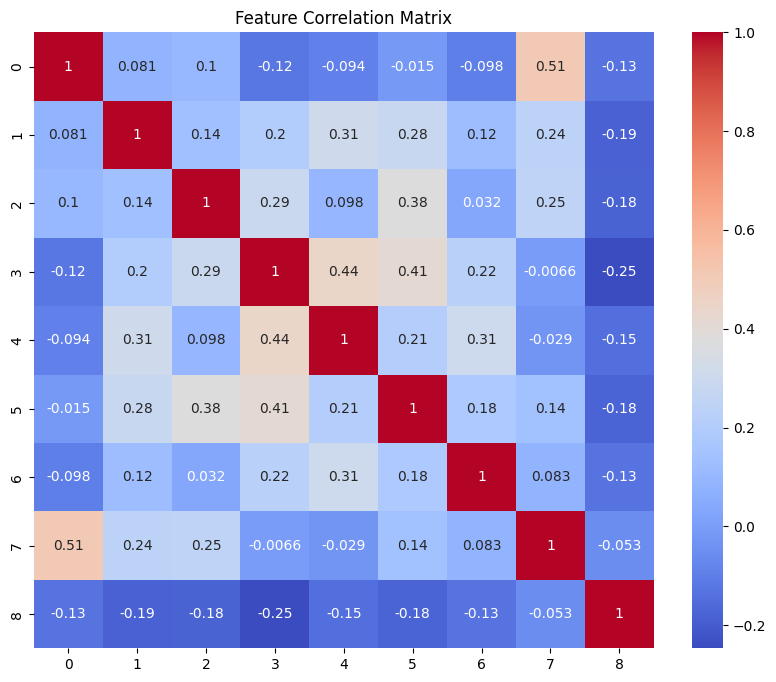

Training for number of neurons 13 in Layer 1 and neurons 8 in Layer 2.......





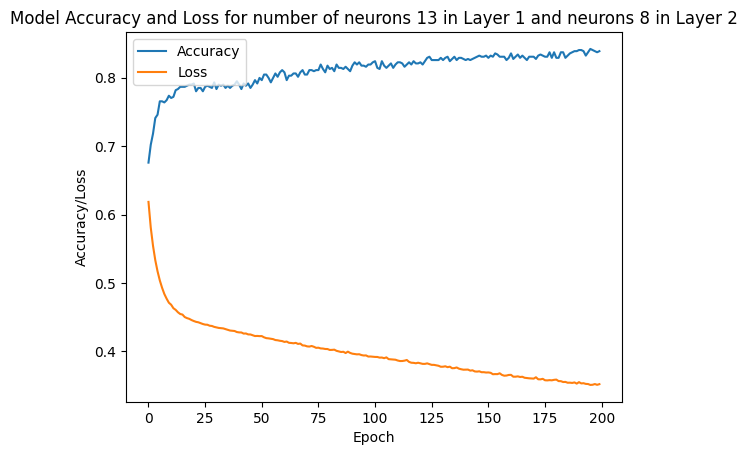

Evaluating the model on the train set for number of neurons 13 in Layer 1 and neurons 8 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train accuracy: 0.84
Precision on train data: 0.80
Recall on train data: 0.72
ROC AUC Score on train data: 0.81


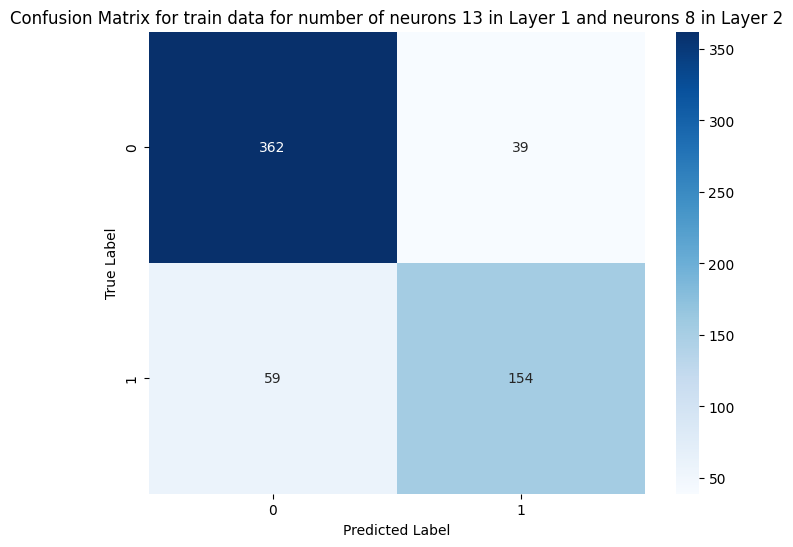

Evaluating the model on the test set for number of neurons 13 in Layer 1 and neurons 8 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Test accuracy: 0.75
Precision on test data: 0.65
Recall on test data: 0.62
ROC AUC Score on test data: 0.72


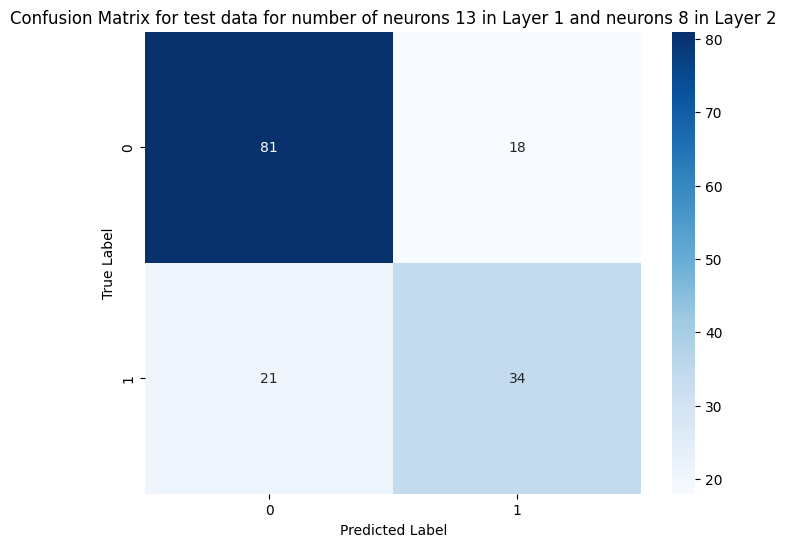

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


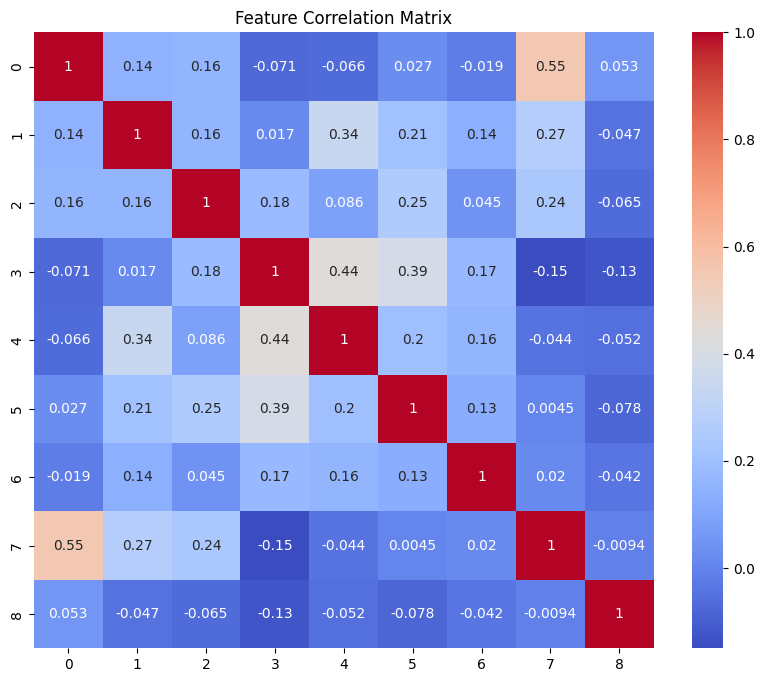

preprocessing Test Set Data....


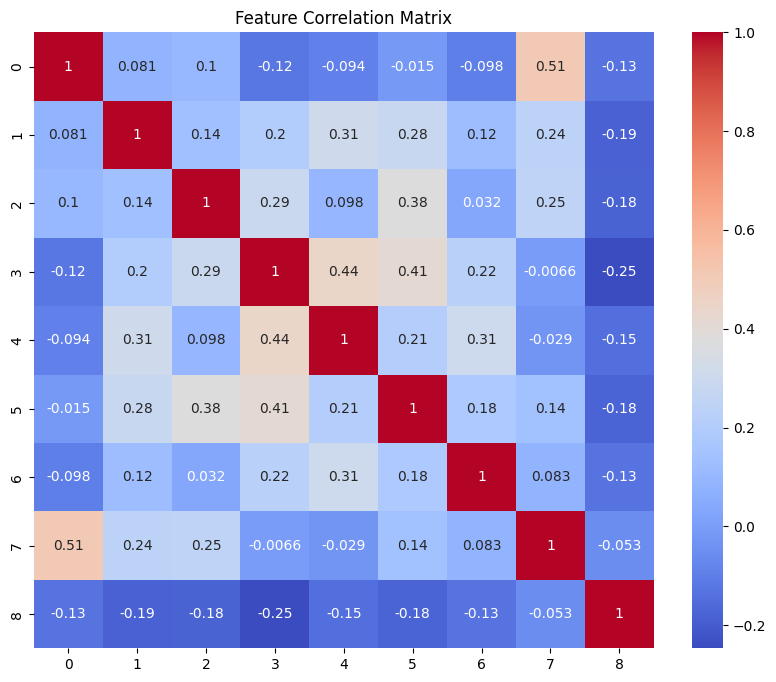

Training for number of neurons 14 in Layer 1 and neurons 8 in Layer 2.......





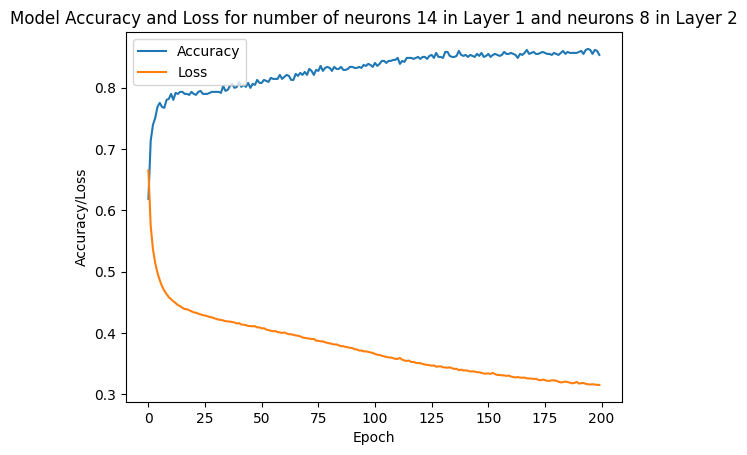

Evaluating the model on the train set for number of neurons 14 in Layer 1 and neurons 8 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Train accuracy: 0.86
Precision on train data: 0.83
Recall on train data: 0.77
ROC AUC Score on train data: 0.84


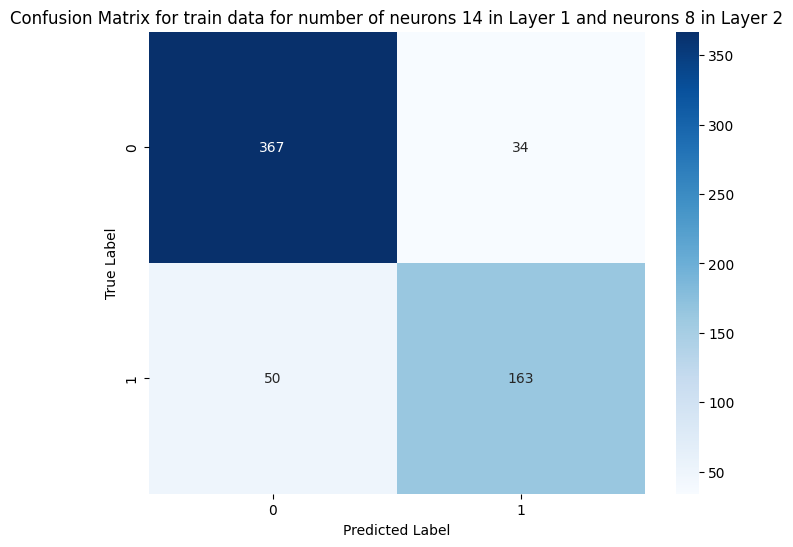

Evaluating the model on the test set for number of neurons 14 in Layer 1 and neurons 8 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Test accuracy: 0.72
Precision on test data: 0.61
Recall on test data: 0.62
ROC AUC Score on test data: 0.70


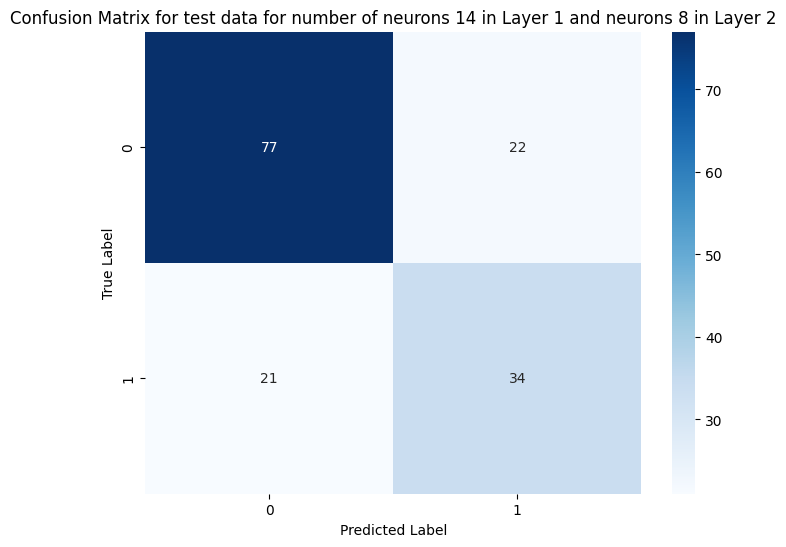

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


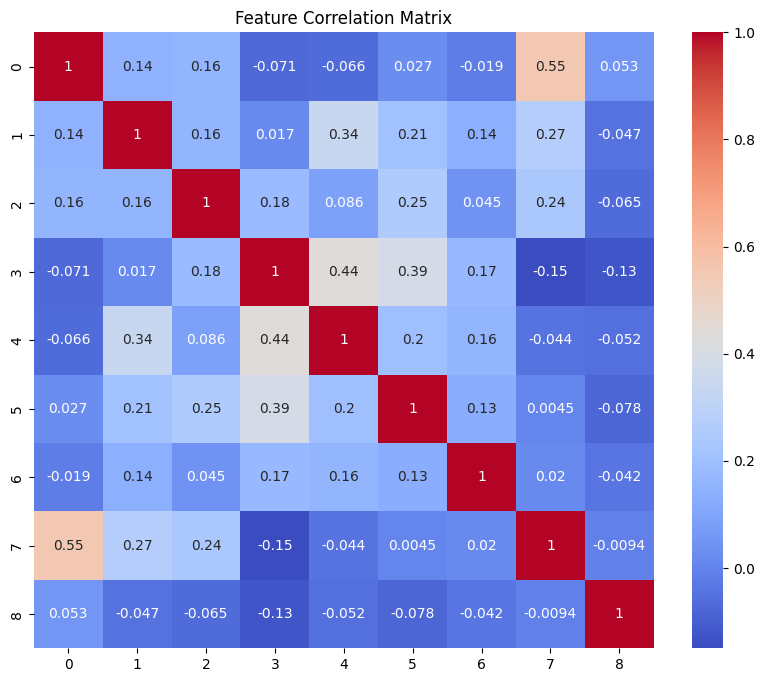

preprocessing Test Set Data....


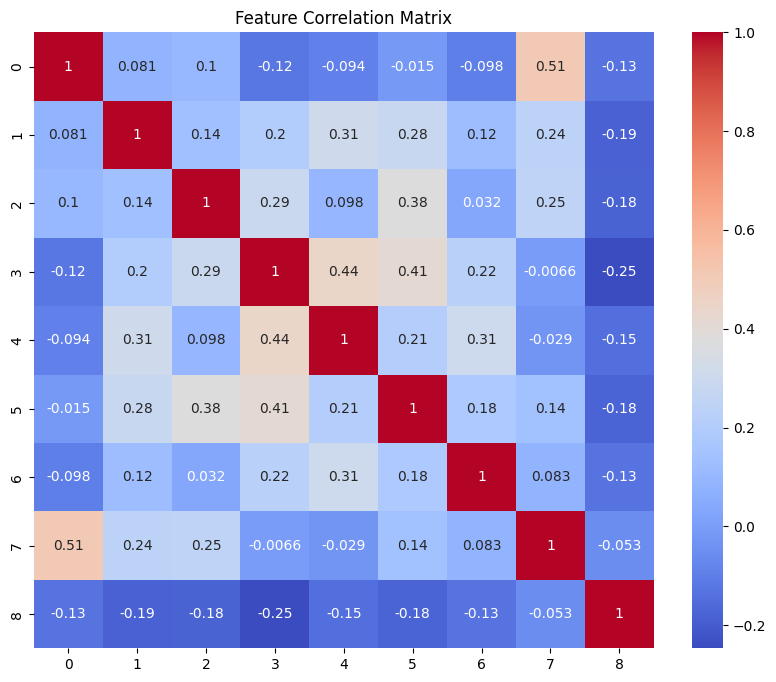

Training for number of neurons 15 in Layer 1 and neurons 8 in Layer 2.......





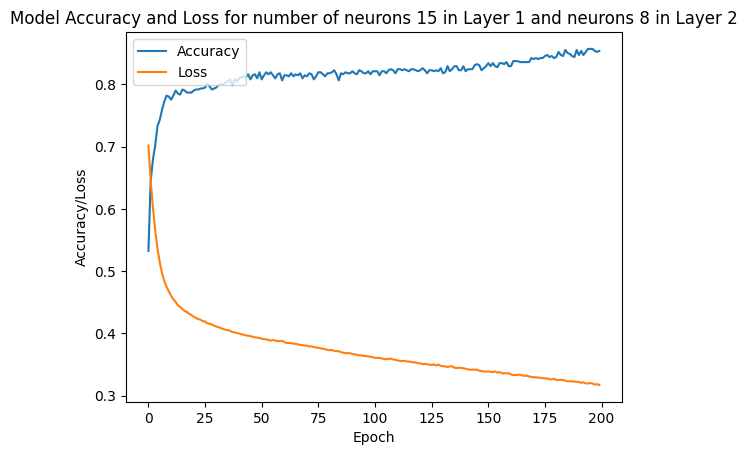

Evaluating the model on the train set for number of neurons 15 in Layer 1 and neurons 8 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Train accuracy: 0.86
Precision on train data: 0.80
Recall on train data: 0.77
ROC AUC Score on train data: 0.84


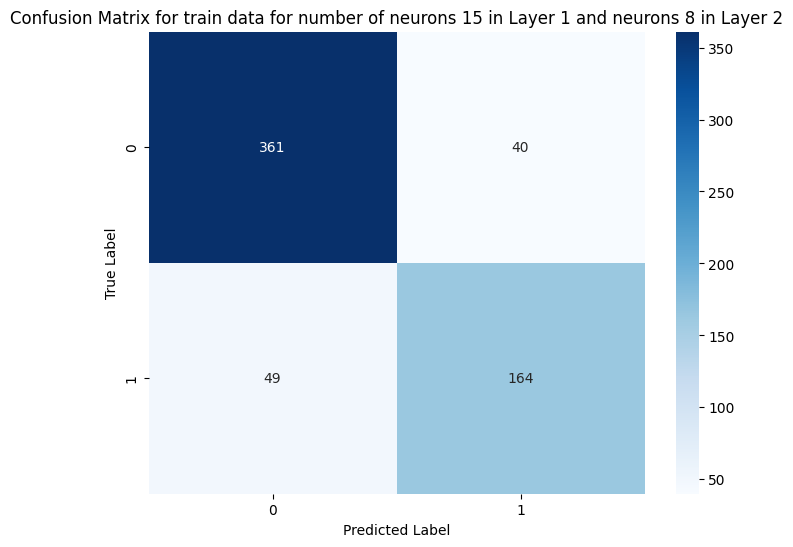

Evaluating the model on the test set for number of neurons 15 in Layer 1 and neurons 8 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Test accuracy: 0.73
Precision on test data: 0.61
Recall on test data: 0.64
ROC AUC Score on test data: 0.71


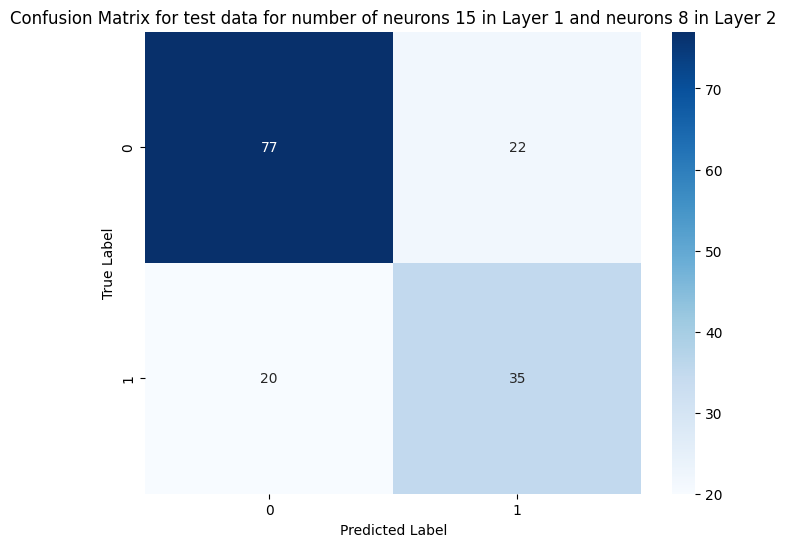

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


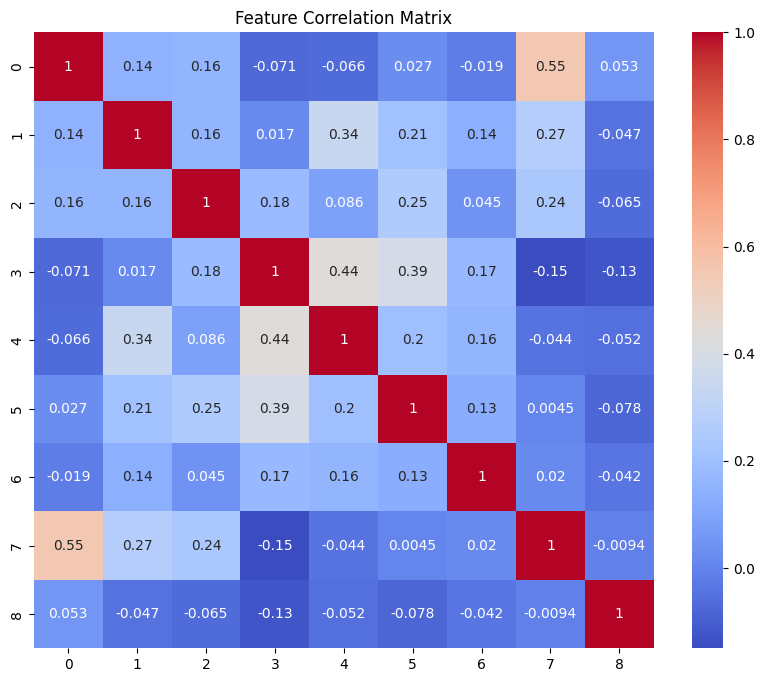

preprocessing Test Set Data....


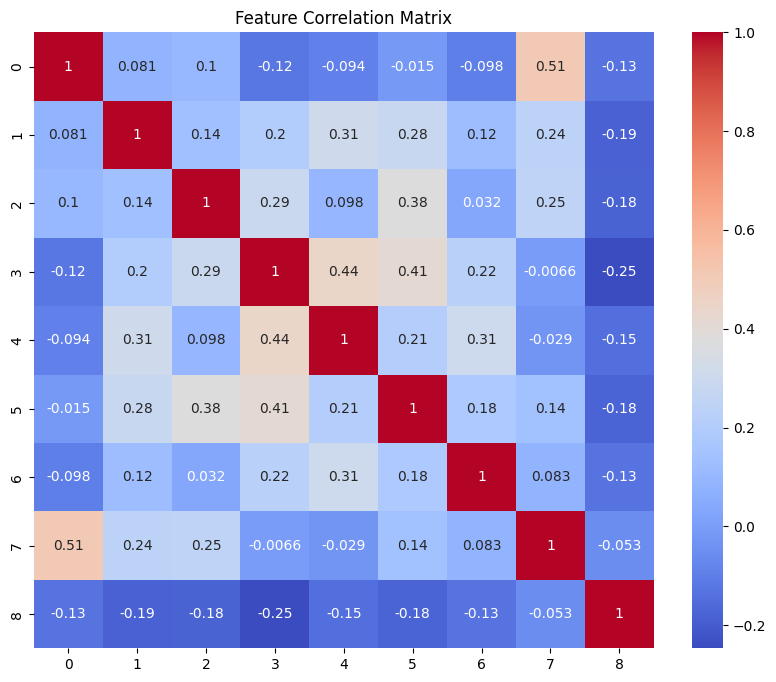

Training for number of neurons 16 in Layer 1 and neurons 8 in Layer 2.......





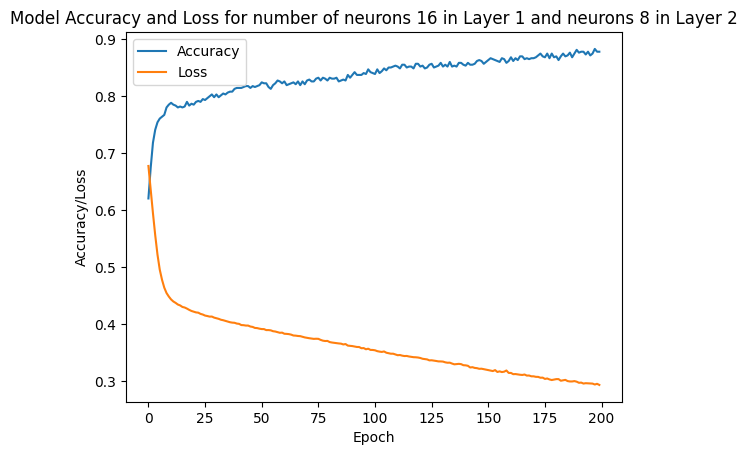

Evaluating the model on the train set for number of neurons 16 in Layer 1 and neurons 8 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Train accuracy: 0.88
Precision on train data: 0.84
Recall on train data: 0.81
ROC AUC Score on train data: 0.86


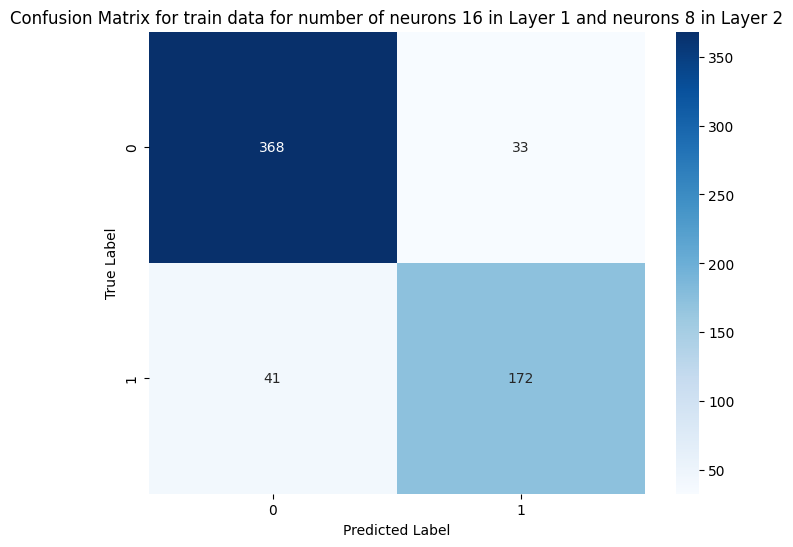

Evaluating the model on the test set for number of neurons 16 in Layer 1 and neurons 8 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Test accuracy: 0.73
Precision on test data: 0.63
Recall on test data: 0.56
ROC AUC Score on test data: 0.69


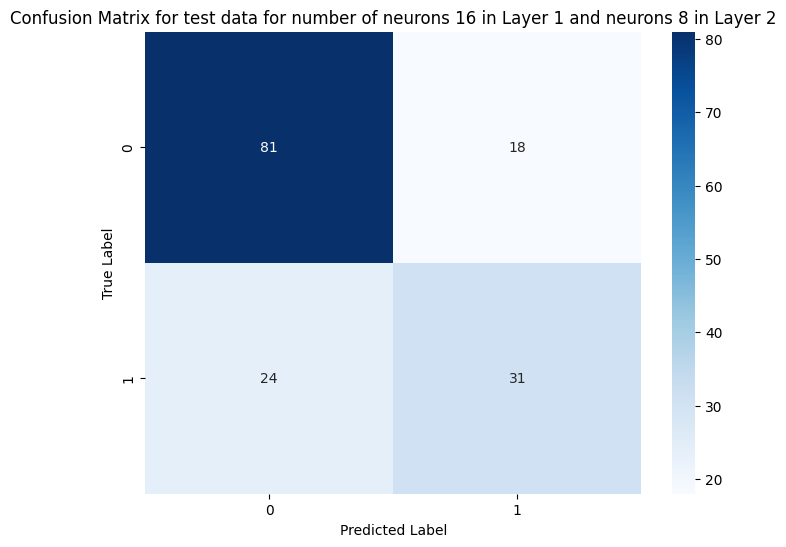

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


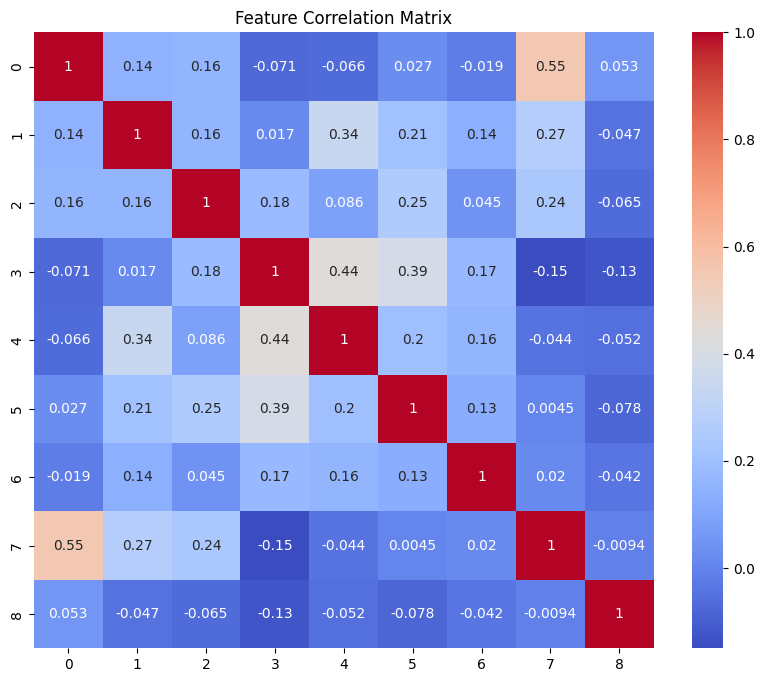

preprocessing Test Set Data....


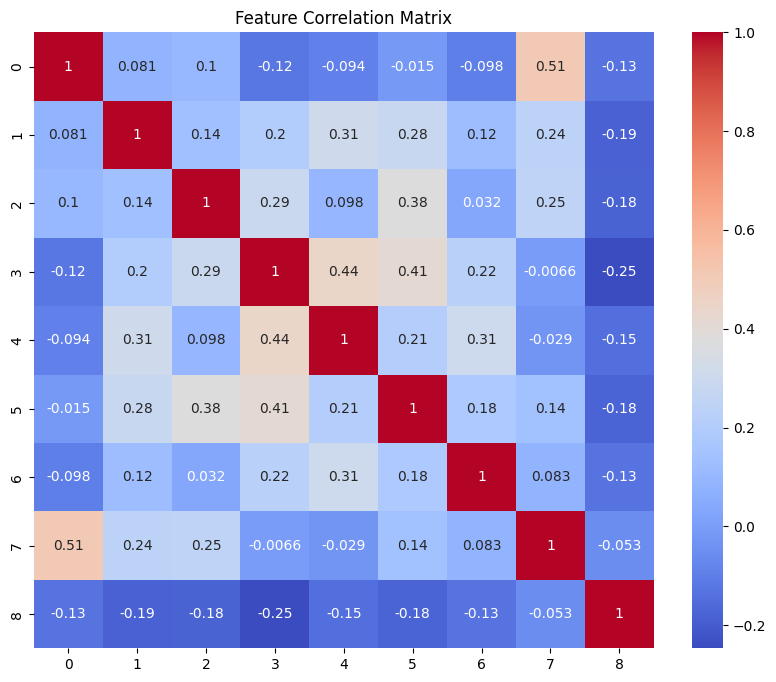

Training for number of neurons 17 in Layer 1 and neurons 8 in Layer 2.......





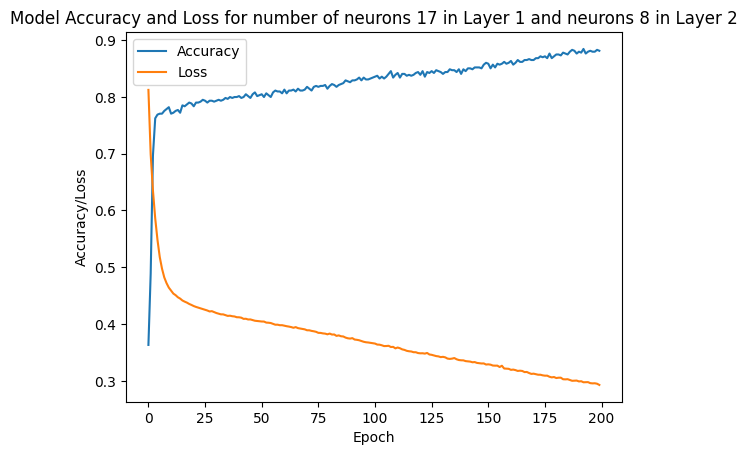

Evaluating the model on the train set for number of neurons 17 in Layer 1 and neurons 8 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Train accuracy: 0.89
Precision on train data: 0.86
Recall on train data: 0.81
ROC AUC Score on train data: 0.87


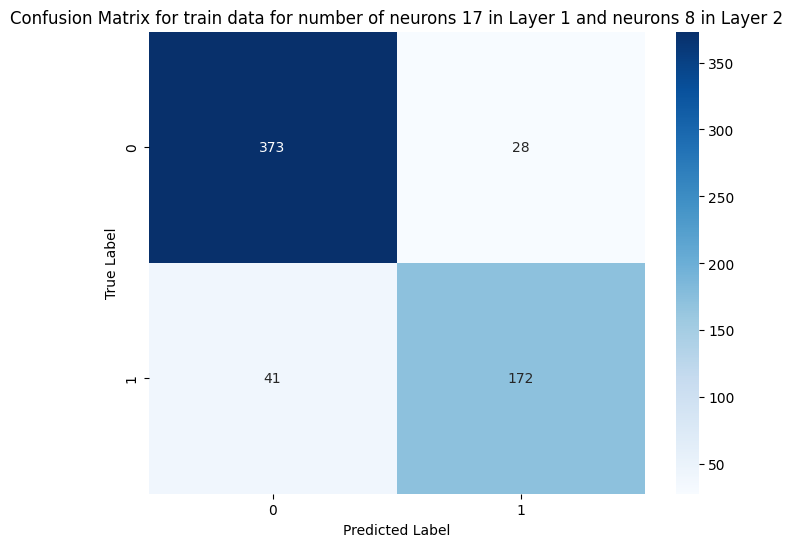

Evaluating the model on the test set for number of neurons 17 in Layer 1 and neurons 8 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Test accuracy: 0.72
Precision on test data: 0.60
Recall on test data: 0.64
ROC AUC Score on test data: 0.70


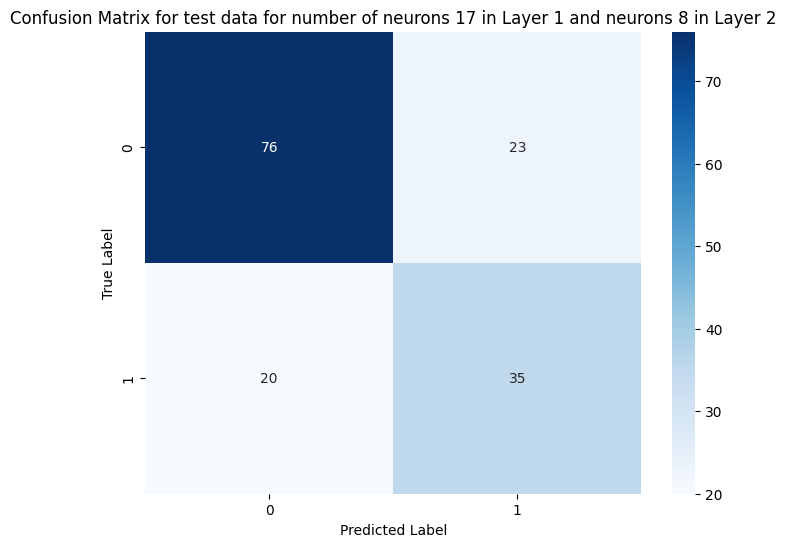

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


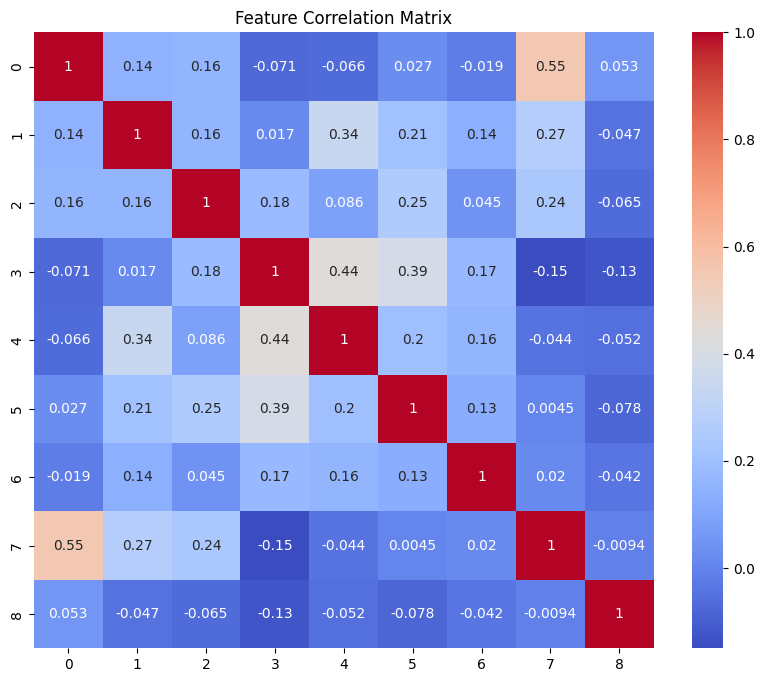

preprocessing Test Set Data....


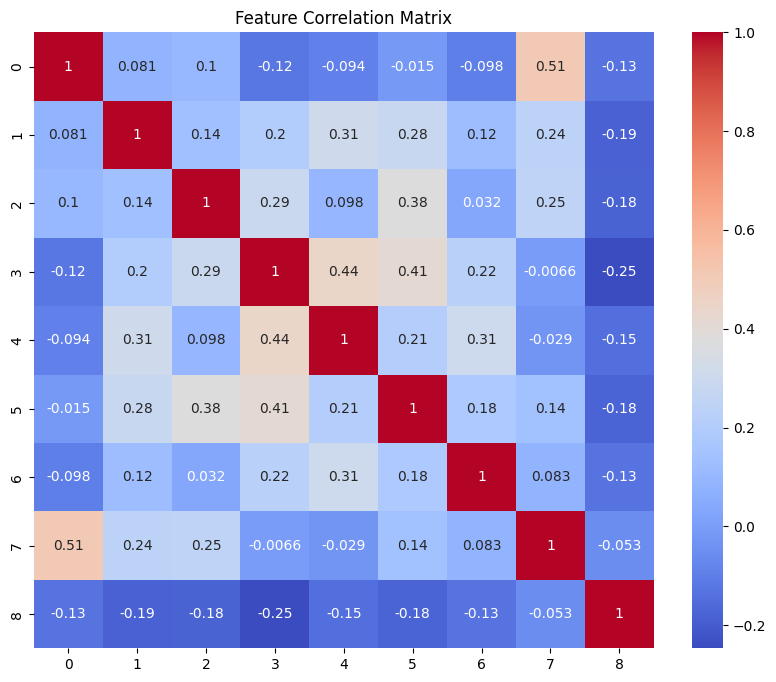

Training for number of neurons 18 in Layer 1 and neurons 8 in Layer 2.......





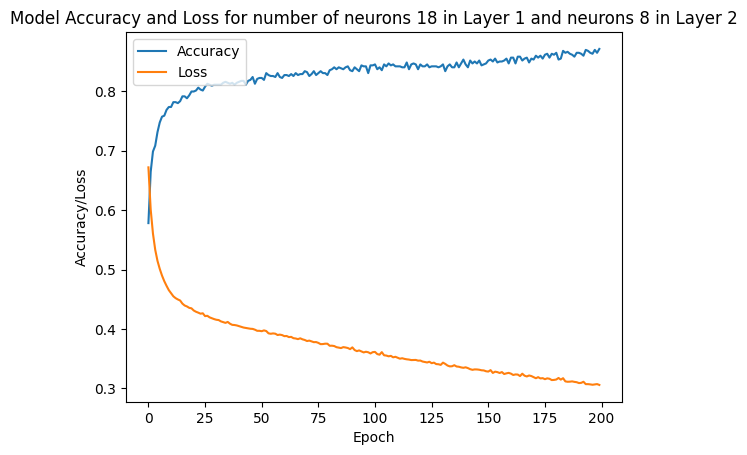

Evaluating the model on the train set for number of neurons 18 in Layer 1 and neurons 8 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Train accuracy: 0.87
Precision on train data: 0.83
Recall on train data: 0.79
ROC AUC Score on train data: 0.85


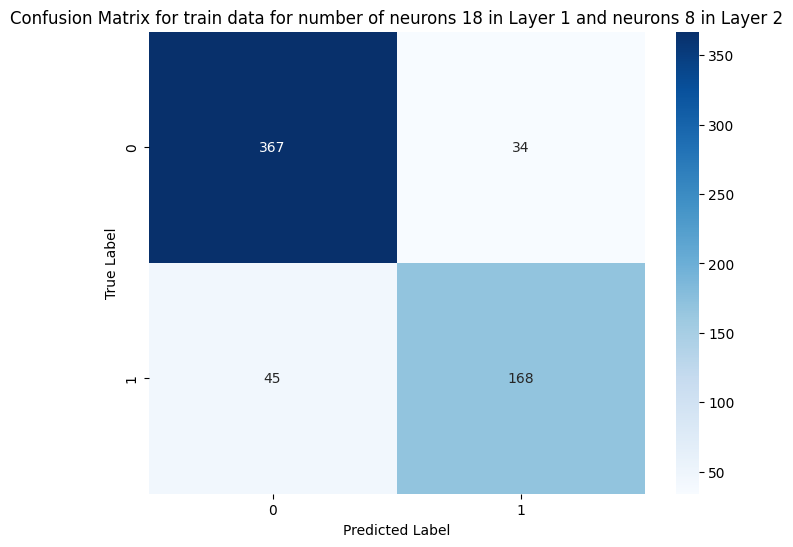

Evaluating the model on the test set for number of neurons 18 in Layer 1 and neurons 8 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Test accuracy: 0.69
Precision on test data: 0.57
Recall on test data: 0.58
ROC AUC Score on test data: 0.67


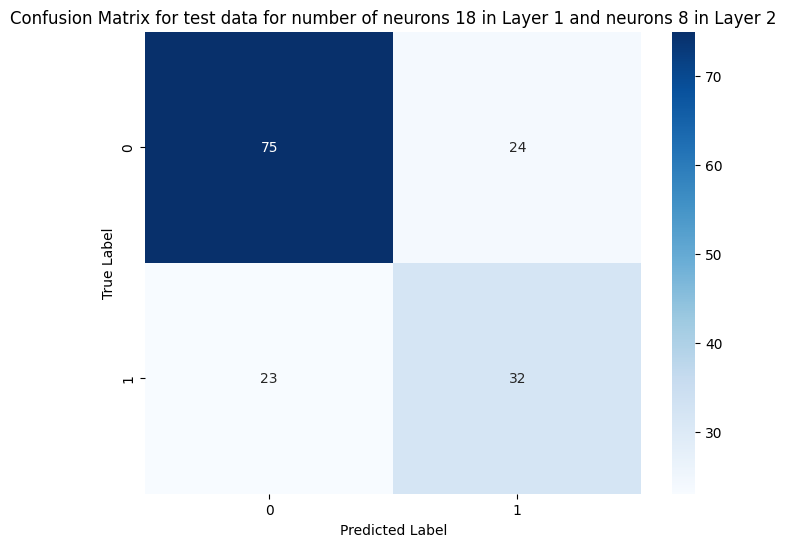

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


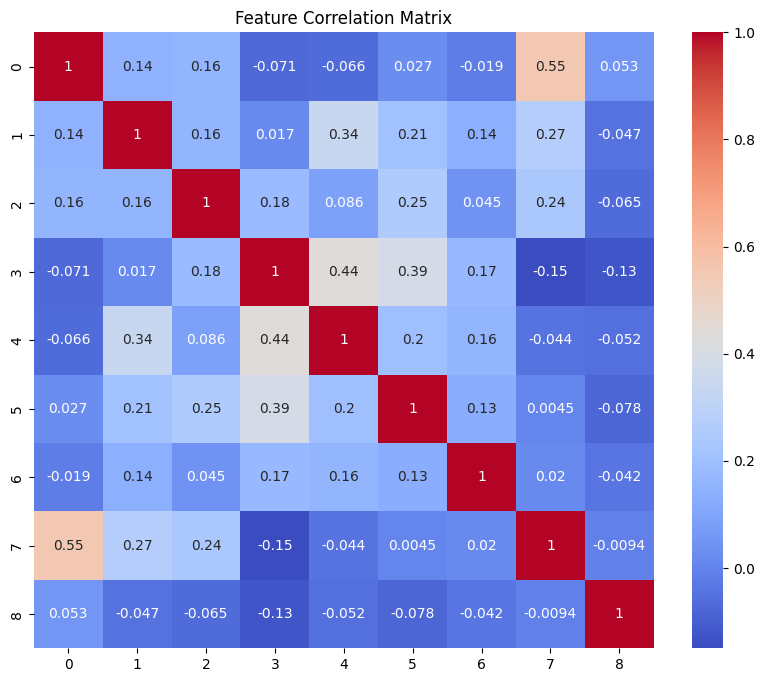

preprocessing Test Set Data....


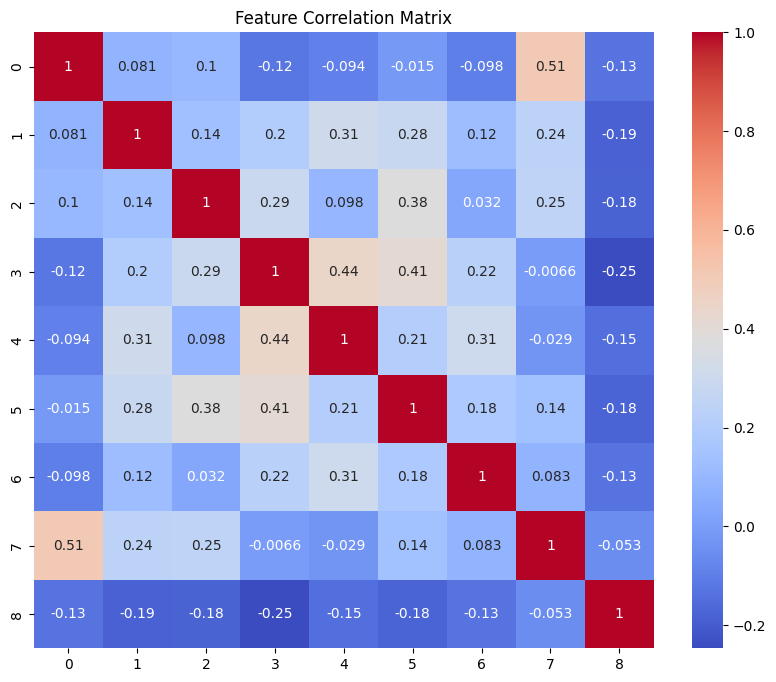

Training for number of neurons 19 in Layer 1 and neurons 8 in Layer 2.......





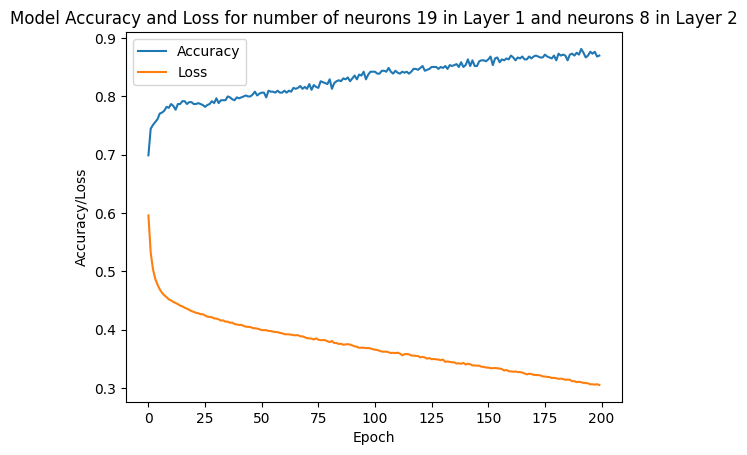

Evaluating the model on the train set for number of neurons 19 in Layer 1 and neurons 8 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Train accuracy: 0.87
Precision on train data: 0.81
Recall on train data: 0.83
ROC AUC Score on train data: 0.86


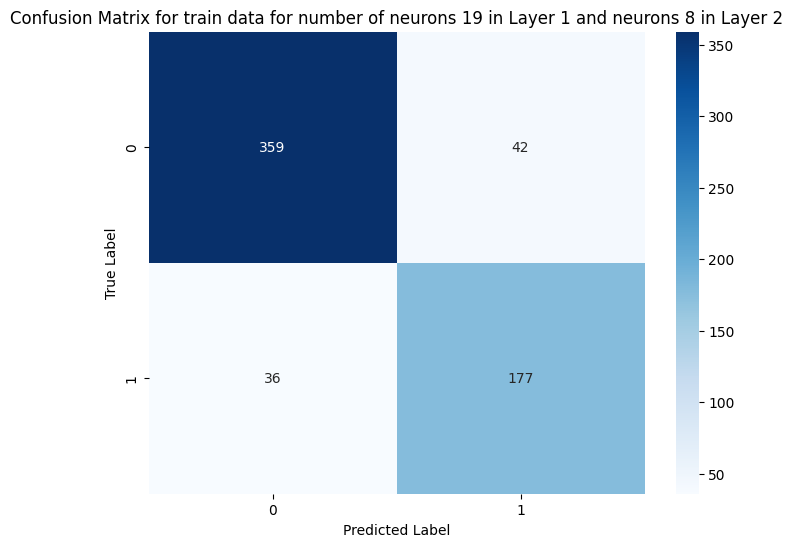

Evaluating the model on the test set for number of neurons 19 in Layer 1 and neurons 8 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Test accuracy: 0.70
Precision on test data: 0.59
Recall on test data: 0.55
ROC AUC Score on test data: 0.67


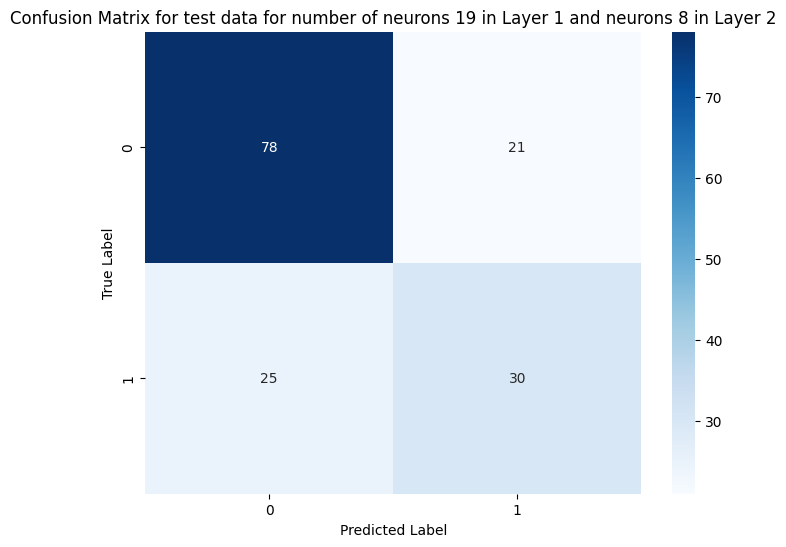

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


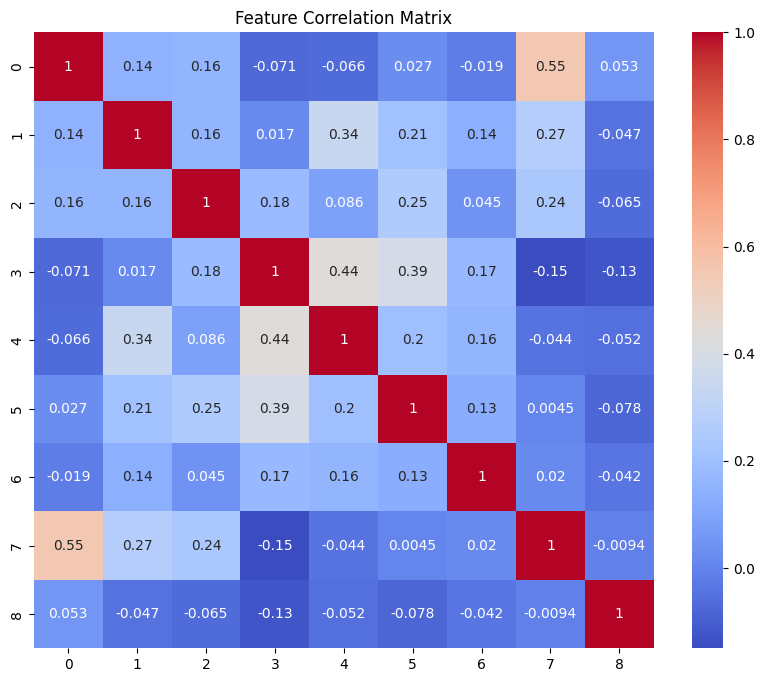

preprocessing Test Set Data....


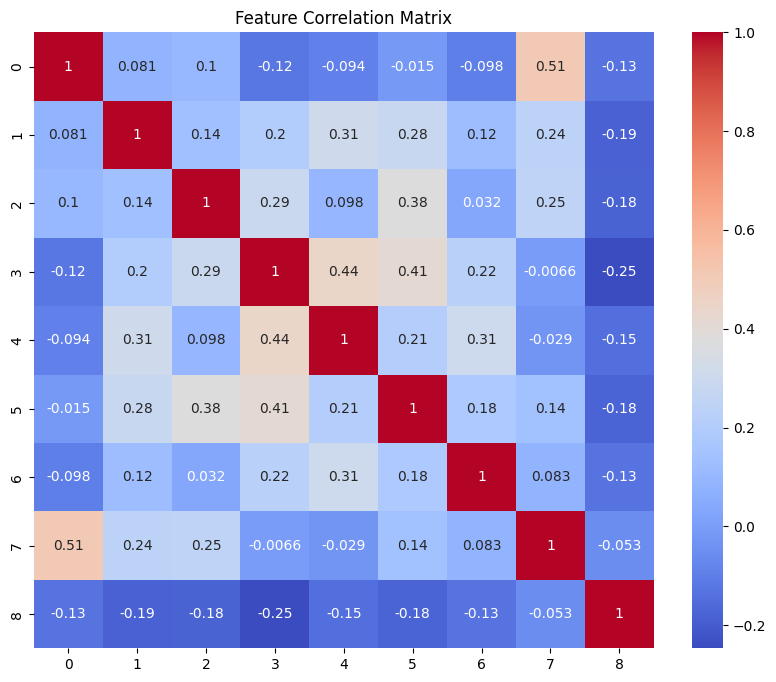

Training for number of neurons 20 in Layer 1 and neurons 8 in Layer 2.......





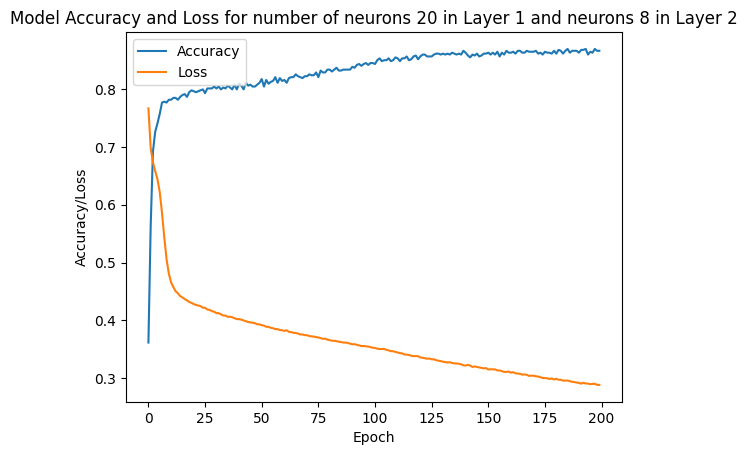

Evaluating the model on the train set for number of neurons 20 in Layer 1 and neurons 8 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Train accuracy: 0.87
Precision on train data: 0.83
Recall on train data: 0.78
ROC AUC Score on train data: 0.85


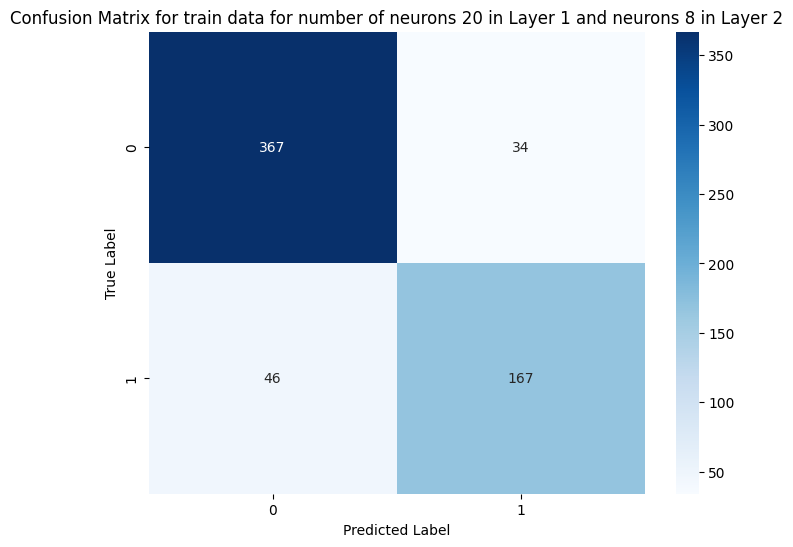

Evaluating the model on the test set for number of neurons 20 in Layer 1 and neurons 8 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Test accuracy: 0.75
Precision on test data: 0.67
Recall on test data: 0.62
ROC AUC Score on test data: 0.72


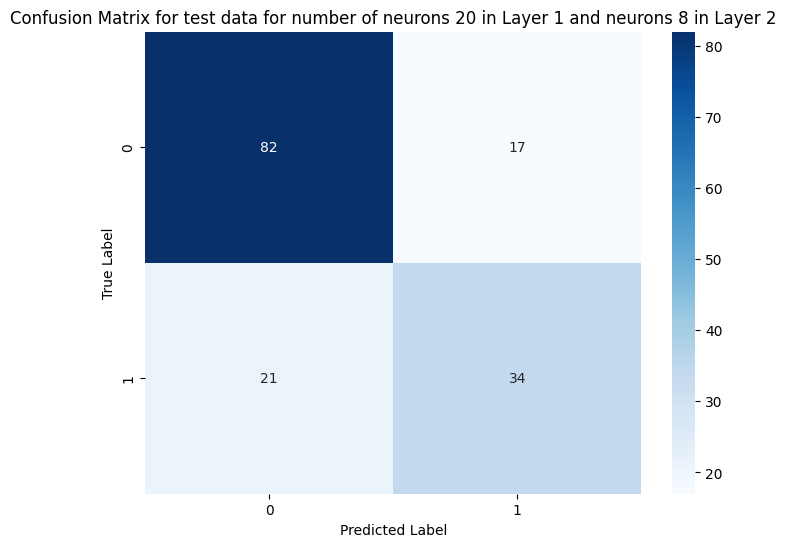

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

    number of neurons (layer 1)  train_size_val  Train Accuracy  \
0                            10             0.8        0.850163   
1                            11             0.8        0.842020   
2                            12             0.8        0.842020   
3                            13             0.8        0.840391   
4                            14             0.8        0.863192   
5                            15             0.8        0.855049   
6                            16             0.8        0.879479   
7                            17             0.8        0.887622   
8                            18             0.8        0.871336   
9                            19             0.8        0.872964   
10                           20             0.8        0.869707   

    Train Precision  Train Recall  Train ROC AUC  Test Accuracy  \
0          0.807107      0.746479       0.825858       0.772727   
1          0.790000      0.741784       0.818523       0.7532

In [ ]:
#@title main function for varying neurons in layer1

def main_nlayer(X_train, y_train, X_test, y_test, n_layer1=12, n_layer2 = 8, epochs=200, batch_size=15,  preprocess =True):

    classifier = DiabetesClassifier(n_layer1=n_layer1, n_layer2=n_layer2)

    if preprocess:
        print(f"preprocessing Train Set Data....")
        train_preprocessor = DataPreprocessor()
        X_train = train_preprocessor.preprocess(X_train)
        train_preprocessor.plot_correlation(pd.concat([X_train, y_train], axis=1))

        print(f"preprocessing Test Set Data....")
        test_preprocessor = DataPreprocessor()
        X_test = test_preprocessor.preprocess(X_test)
        test_preprocessor.plot_correlation(pd.concat([X_test, y_test], axis=1))

    print(f"Training for number of neurons {n_layer1} in Layer 1 and neurons {n_layer2} in Layer 2.......\n\n\n")

    history = classifier.train(X_train, y_train, epochs=epochs, batch_size=batch_size)

    # Plot accuracy and loss vs epoch
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['loss'])
    plt.title(f'Model Accuracy and Loss for number of neurons {n_layer1} in Layer 1 and neurons {n_layer2} in Layer 2')
    plt.ylabel('Accuracy/Loss')
    plt.xlabel('Epoch')
    plt.legend(['Accuracy', 'Loss'], loc='upper left')
    plt.show()


    # Train Data

    print(f"Evaluating the model on the train set for number of neurons {n_layer1} in Layer 1 and neurons {n_layer2} in Layer 2\n\n")
    train_accuracy, train_conf_matrix, train_precision, train_recall, train_roc_auc = classifier.evaluate(X_train, y_train)
    print(f'Train accuracy: {train_accuracy:.2f}')
    print(f'Precision on train data: {train_precision:.2f}')
    print(f'Recall on train data: {train_recall:.2f}')
    print(f'ROC AUC Score on train data: {train_roc_auc:.2f}')

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(train_conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix for train data for number of neurons {n_layer1} in Layer 1 and neurons {n_layer2} in Layer 2')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    # Test Data

    print(f"Evaluating the model on the test set for number of neurons {n_layer1} in Layer 1 and neurons {n_layer2} in Layer 2\n\n")
    test_accuracy, test_conf_matrix, test_precision, test_recall, test_roc_auc = classifier.evaluate(X_test, y_test)
    print(f'Test accuracy: {test_accuracy:.2f}')
    print(f'Precision on test data: {test_precision:.2f}')
    print(f'Recall on test data: {test_recall:.2f}')
    print(f'ROC AUC Score on test data: {test_roc_auc:.2f}')

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(test_conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix for test data for number of neurons {n_layer1} in Layer 1 and neurons {n_layer2} in Layer 2')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    return train_accuracy, train_conf_matrix, train_precision, train_recall, train_roc_auc, test_accuracy, test_conf_matrix, test_precision, test_recall, test_roc_auc


# Investigating neuron numbers variation in layer 1
if __name__ == "__main__":

  # Load dataset and perform basic splitting..
  X, y = load_data('pima-indians-diabetes.csv')
  test_size_val = 0.2
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size_val, random_state=42)

  results = []
  for n_layer1 in range(10, 21):
      train_accuracy, train_conf_matrix, train_precision, train_recall, train_roc_auc, test_accuracy, test_conf_matrix, test_precision, test_recall, test_roc_auc = main_nlayer(X_train, y_train, X_test, y_test, n_layer1=n_layer1, n_layer2 = 8, epochs=200, batch_size=15,  preprocess =True)
      results.append([n_layer1, 1-test_size_val, train_accuracy, train_precision, train_recall, train_roc_auc, test_accuracy, test_precision, test_recall, test_roc_auc])

  results_df = pd.DataFrame(results, columns=['number of neurons (layer 1)', 'train_size_val', 'Train Accuracy', 'Train Precision', 'Train Recall', 'Train ROC AUC', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test ROC AUC'])
  results_df.to_csv('layer1_neuron_vary_results.csv', index=False)
  files.download('layer1_neuron_vary_results.csv')
  print(results_df)


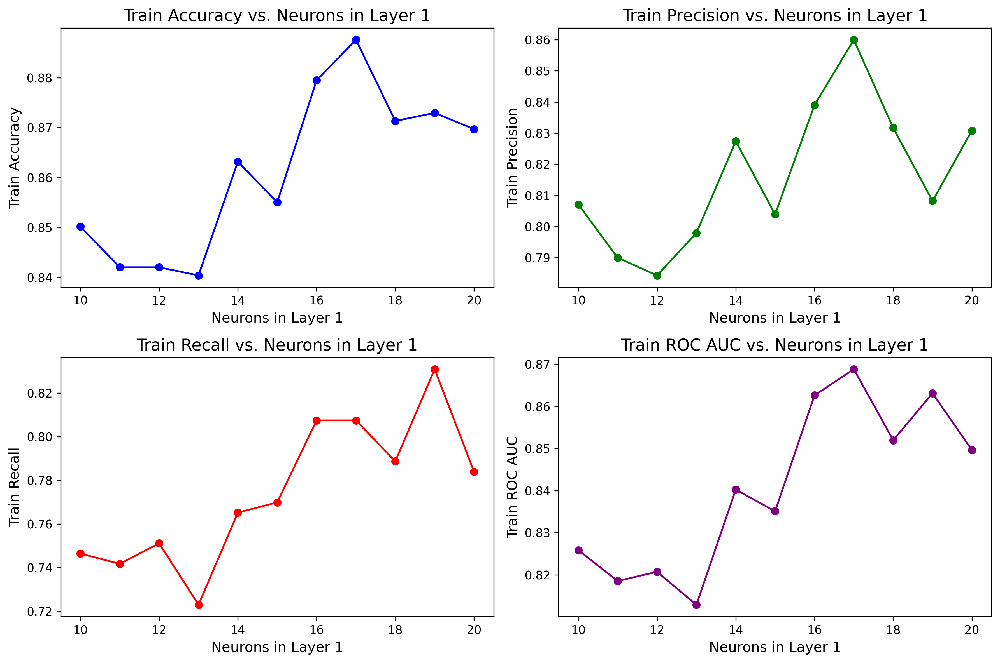

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

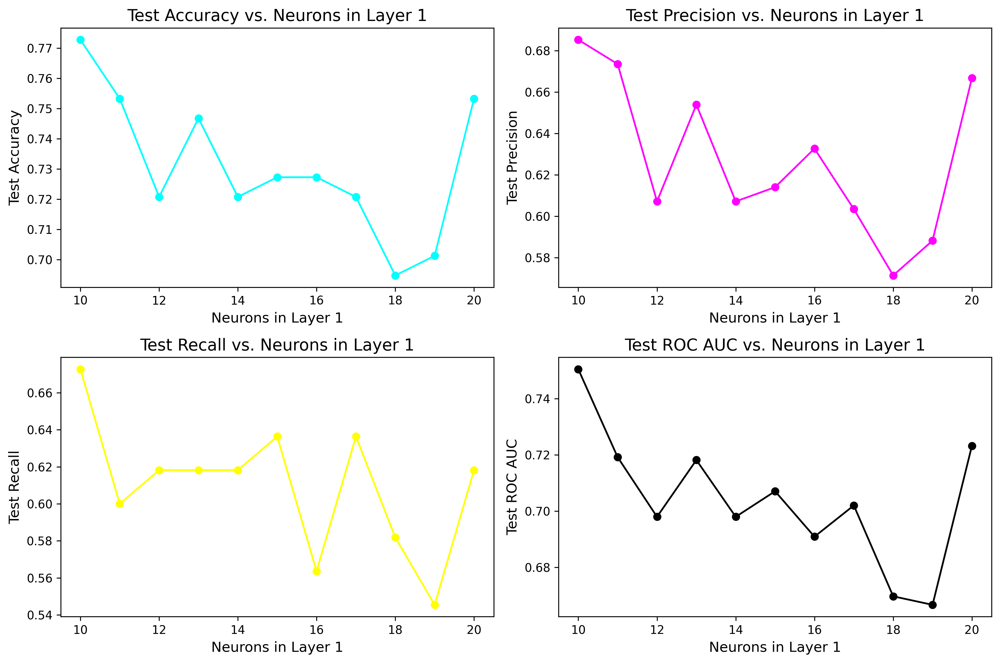

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# @title plots for varying neurons in layer 1

# --- Figure 1: Neurons in Layer 1 vs. Train Metrics ---
fig1, axes1 = plt.subplots(2, 2, figsize=(12, 8), dpi=300)  # High resolution
colors1 = ['blue', 'green', 'red', 'purple']

axes1[0, 0].plot(results_df['number of neurons (layer 1)'], results_df['Train Accuracy'], marker='o', color=colors1[0])
axes1[0, 0].set_title('Train Accuracy vs. Neurons in Layer 1', fontsize=14)  # Increased font size
axes1[0, 0].set_xlabel('Neurons in Layer 1', fontsize=12)
axes1[0, 0].set_ylabel('Train Accuracy', fontsize=12)

axes1[0, 1].plot(results_df['number of neurons (layer 1)'], results_df['Train Precision'], marker='o', color=colors1[1])
axes1[0, 1].set_title('Train Precision vs. Neurons in Layer 1', fontsize=14)
axes1[0, 1].set_xlabel('Neurons in Layer 1', fontsize=12)
axes1[0, 1].set_ylabel('Train Precision', fontsize=12)

axes1[1, 0].plot(results_df['number of neurons (layer 1)'], results_df['Train Recall'], marker='o', color=colors1[2])
axes1[1, 0].set_title('Train Recall vs. Neurons in Layer 1', fontsize=14)
axes1[1, 0].set_xlabel('Neurons in Layer 1', fontsize=12)
axes1[1, 0].set_ylabel('Train Recall', fontsize=12)

axes1[1, 1].plot(results_df['number of neurons (layer 1)'], results_df['Train ROC AUC'], marker='o', color=colors1[3])
axes1[1, 1].set_title('Train ROC AUC vs. Neurons in Layer 1', fontsize=14)
axes1[1, 1].set_xlabel('Neurons in Layer 1', fontsize=12)
axes1[1, 1].set_ylabel('Train ROC AUC', fontsize=12)

plt.tight_layout()
plt.savefig('neurons_layer1_vs_train_metrics.png', dpi=300)  # Save before downloading
plt.show()

files.download('neurons_layer1_vs_train_metrics.png')  # Download the figure



# --- Figure 2: Neurons in Layer 1 vs. Test Metrics ---
fig2, axes2 = plt.subplots(2, 2, figsize=(12, 8), dpi=300)
colors2 = ['cyan', 'magenta', 'yellow', 'black']

axes2[0, 0].plot(results_df['number of neurons (layer 1)'], results_df['Test Accuracy'], marker='o', color=colors2[0])
axes2[0, 0].set_title('Test Accuracy vs. Neurons in Layer 1', fontsize=14)
axes2[0, 0].set_xlabel('Neurons in Layer 1', fontsize=12)
axes2[0, 0].set_ylabel('Test Accuracy', fontsize=12)


axes2[0, 1].plot(results_df['number of neurons (layer 1)'], results_df['Test Precision'], marker='o', color=colors2[1])
axes2[0, 1].set_title('Test Precision vs. Neurons in Layer 1', fontsize=14)
axes2[0, 1].set_xlabel('Neurons in Layer 1', fontsize=12)
axes2[0, 1].set_ylabel('Test Precision', fontsize=12)

axes2[1, 0].plot(results_df['number of neurons (layer 1)'], results_df['Test Recall'], marker='o', color=colors2[2])
axes2[1, 0].set_title('Test Recall vs. Neurons in Layer 1', fontsize=14)
axes2[1, 0].set_xlabel('Neurons in Layer 1', fontsize=12)
axes2[1, 0].set_ylabel('Test Recall', fontsize=12)

axes2[1, 1].plot(results_df['number of neurons (layer 1)'], results_df['Test ROC AUC'], marker='o', color=colors2[3])
axes2[1, 1].set_title('Test ROC AUC vs. Neurons in Layer 1', fontsize=14)
axes2[1, 1].set_xlabel('Neurons in Layer 1', fontsize=12)
axes2[1, 1].set_ylabel('Test ROC AUC', fontsize=12)

plt.tight_layout()
plt.savefig('neurons_layer1_vs_test_metrics.png', dpi=300)
plt.show()

files.download('neurons_layer1_vs_test_metrics.png')

**Task-3**: Vary the number of neurons in Layer#2. Try values in the range [5,15]. Document the results and identify the best cases. Try to intuitively justify the reason behind the best hyperparameter values.

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


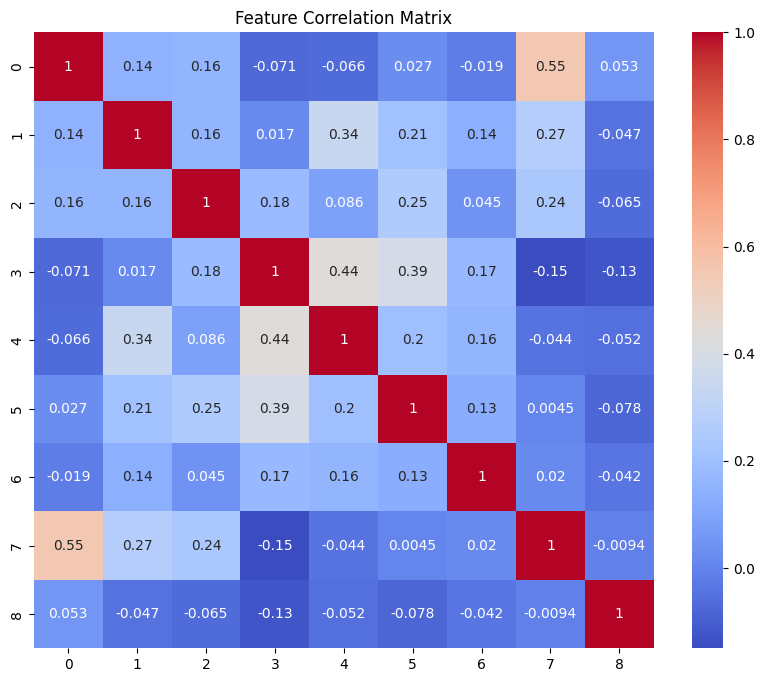

preprocessing Test Set Data....


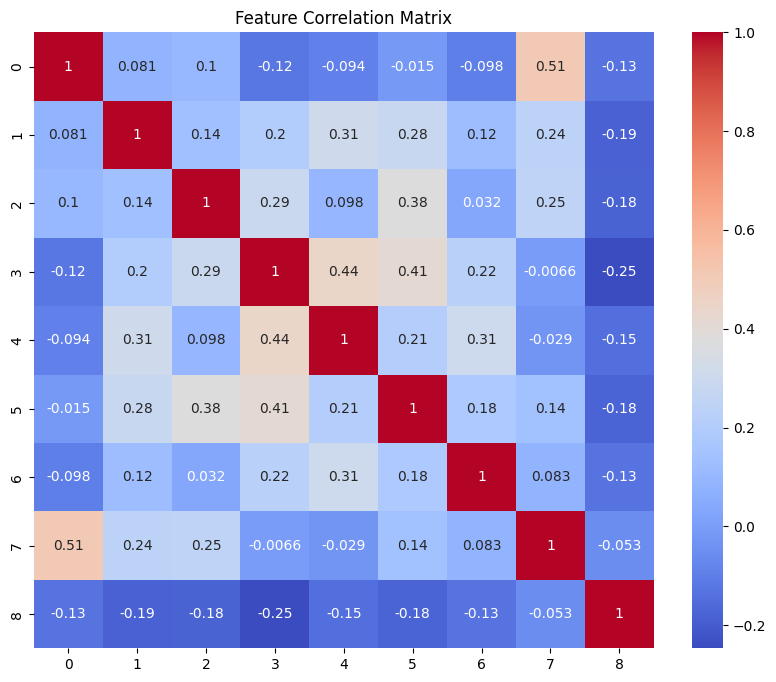

Training for number of neurons 16 in Layer 1 and neurons 5 in Layer 2.......





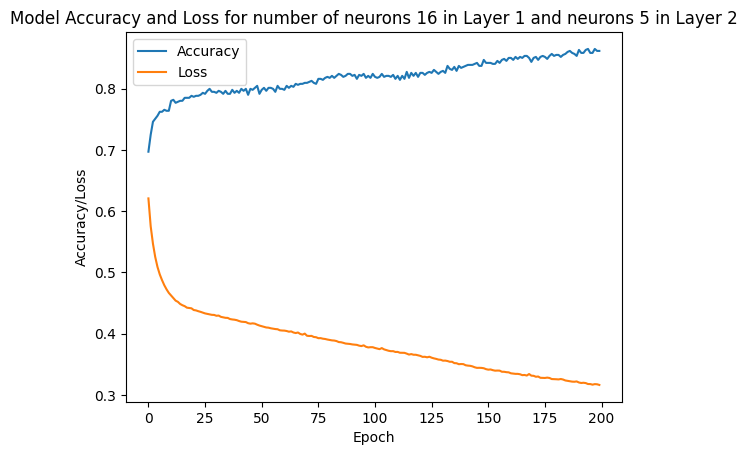

Evaluating the model on the train set for number of neurons 16 in Layer 1 and neurons 5 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train accuracy: 0.87
Precision on train data: 0.83
Recall on train data: 0.78
ROC AUC Score on train data: 0.85


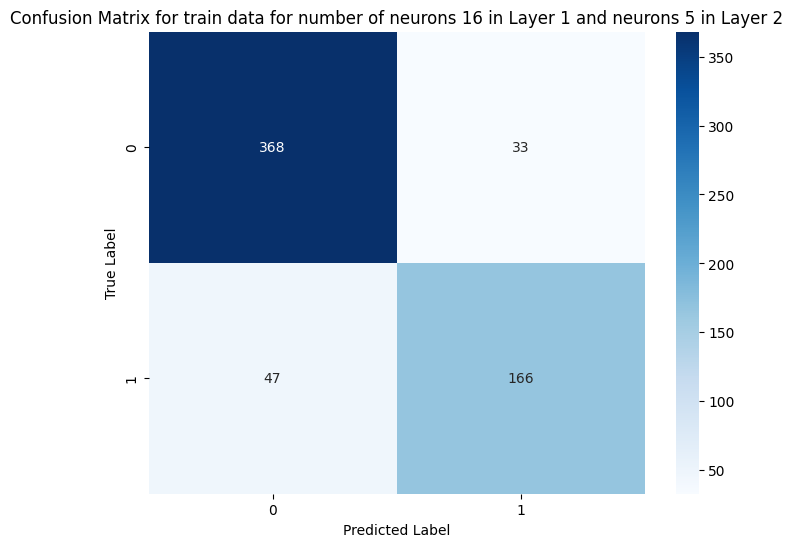

Evaluating the model on the test set for number of neurons 16 in Layer 1 and neurons 5 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Test accuracy: 0.78
Precision on test data: 0.69
Recall on test data: 0.69
ROC AUC Score on test data: 0.76


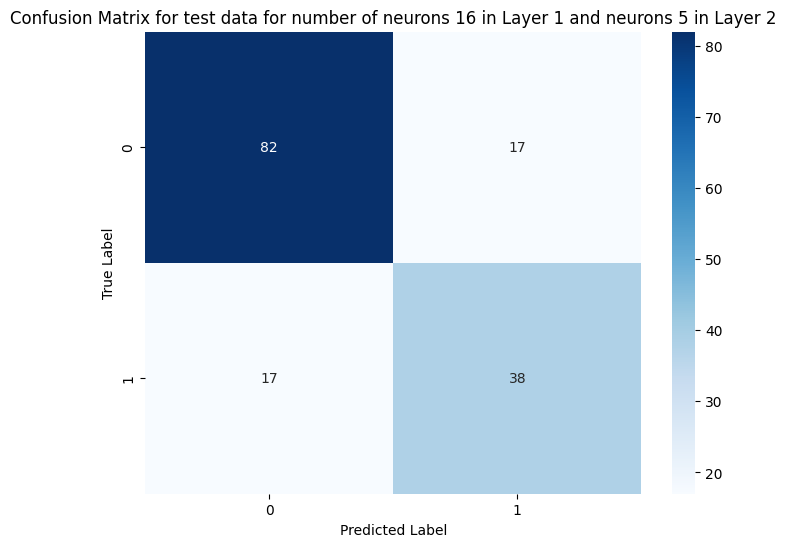

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


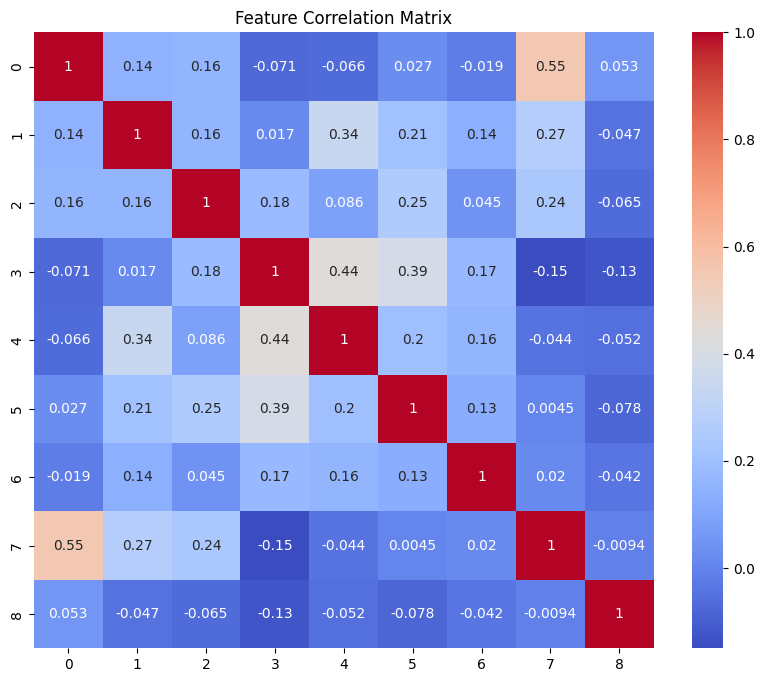

preprocessing Test Set Data....


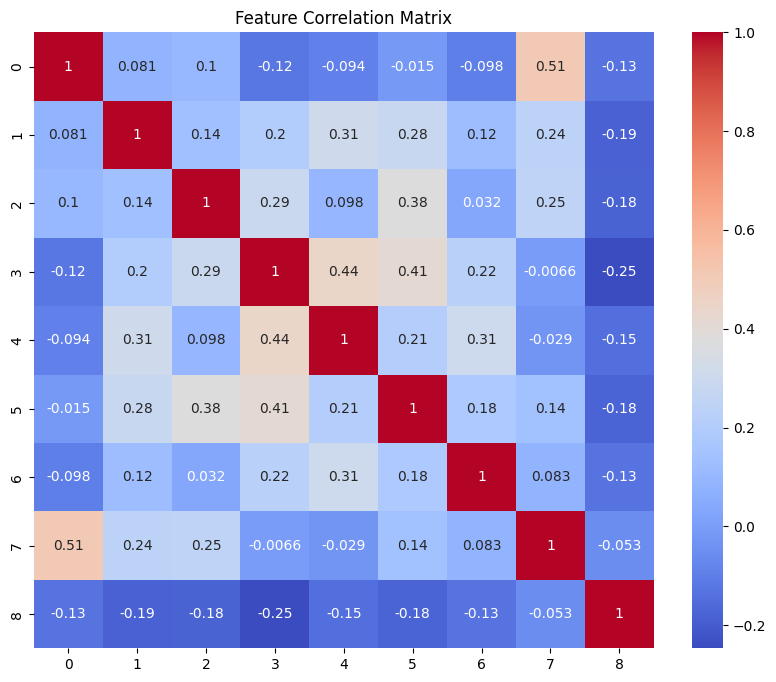

Training for number of neurons 16 in Layer 1 and neurons 6 in Layer 2.......





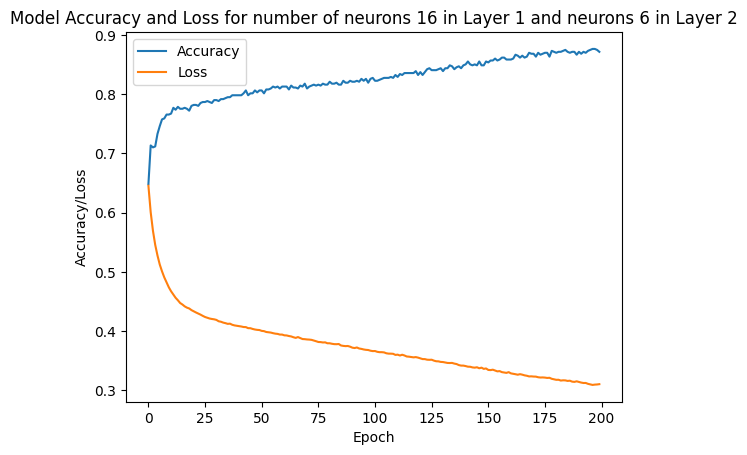

Evaluating the model on the train set for number of neurons 16 in Layer 1 and neurons 6 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train accuracy: 0.87
Precision on train data: 0.83
Recall on train data: 0.78
ROC AUC Score on train data: 0.85


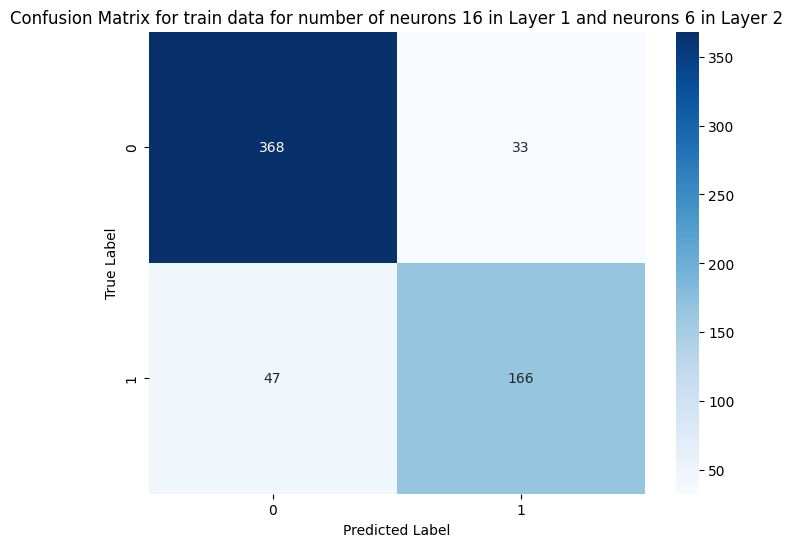

Evaluating the model on the test set for number of neurons 16 in Layer 1 and neurons 6 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Test accuracy: 0.73
Precision on test data: 0.62
Recall on test data: 0.64
ROC AUC Score on test data: 0.71


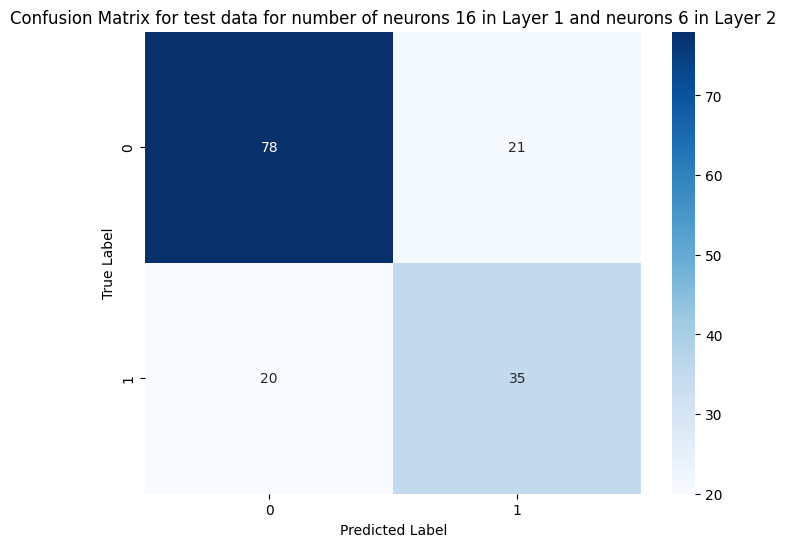

preprocessing Train Set Data....


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


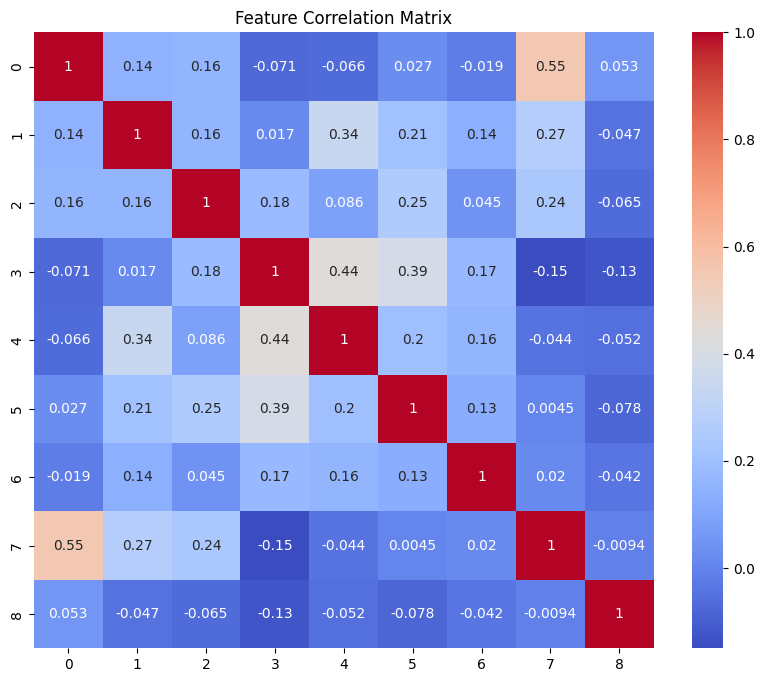

preprocessing Test Set Data....


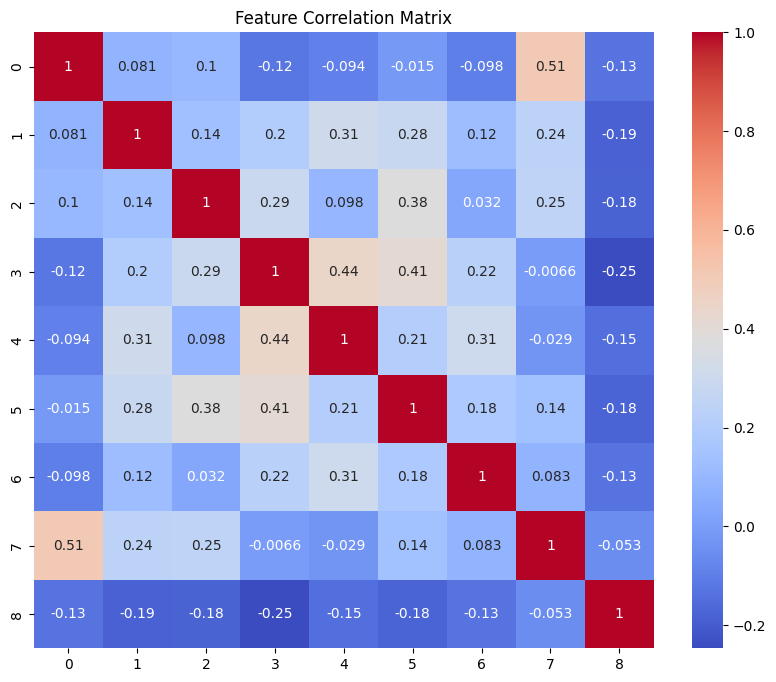

Training for number of neurons 16 in Layer 1 and neurons 7 in Layer 2.......





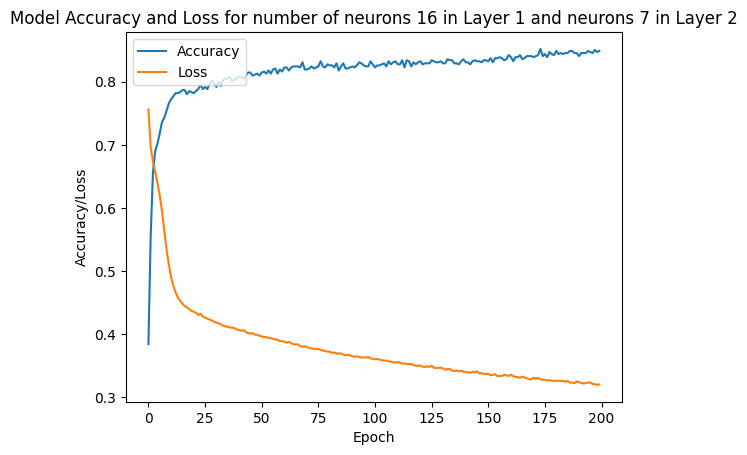

Evaluating the model on the train set for number of neurons 16 in Layer 1 and neurons 7 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train accuracy: 0.85
Precision on train data: 0.81
Recall on train data: 0.75
ROC AUC Score on train data: 0.83


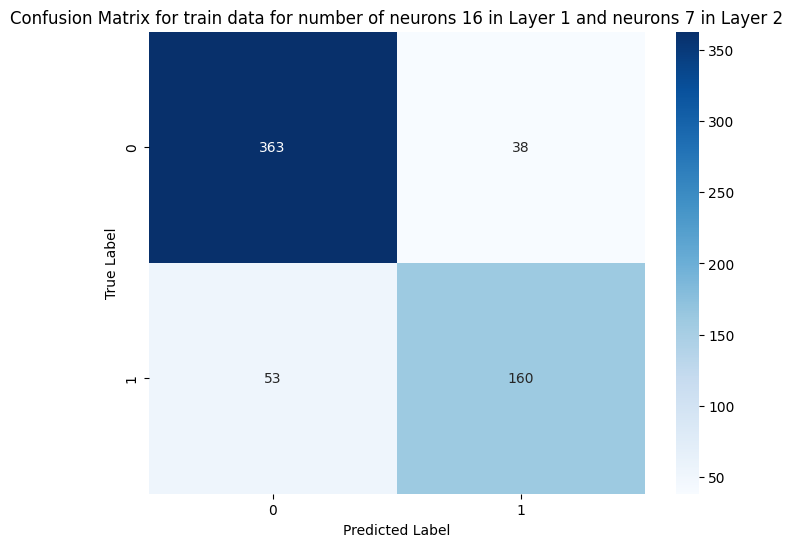

Evaluating the model on the test set for number of neurons 16 in Layer 1 and neurons 7 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Test accuracy: 0.70
Precision on test data: 0.58
Recall on test data: 0.56
ROC AUC Score on test data: 0.67


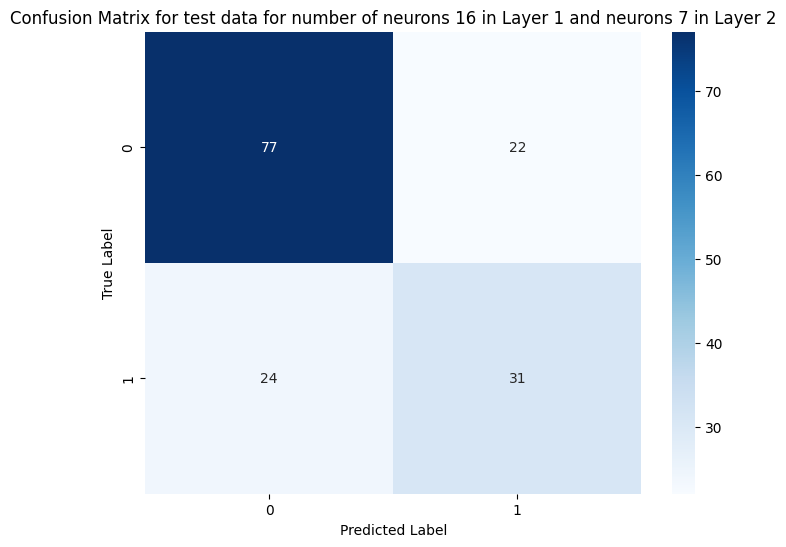

preprocessing Train Set Data....


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


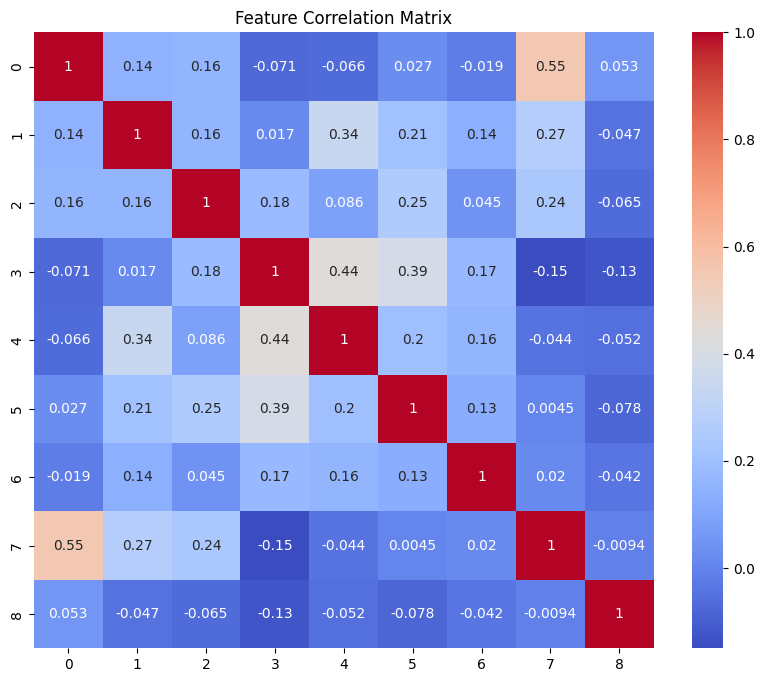

preprocessing Test Set Data....


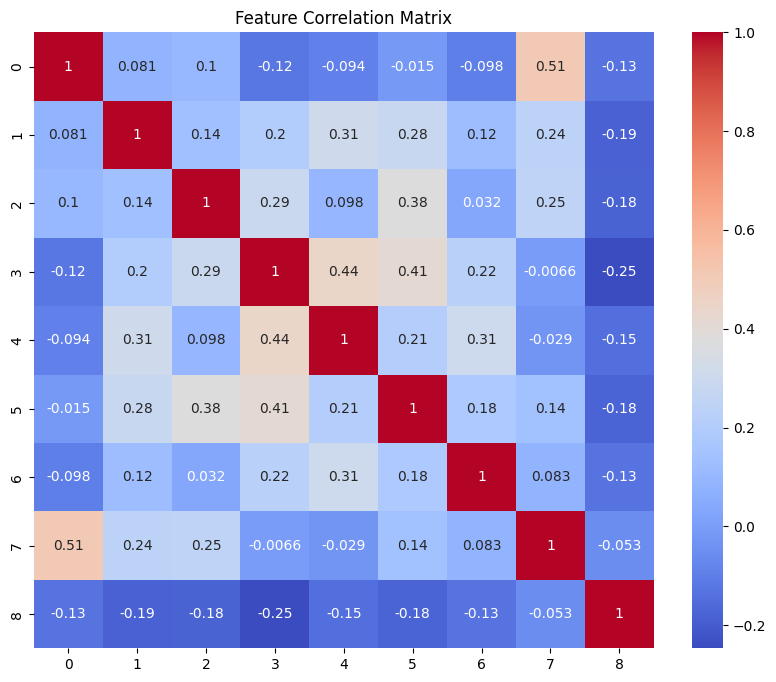

Training for number of neurons 16 in Layer 1 and neurons 8 in Layer 2.......





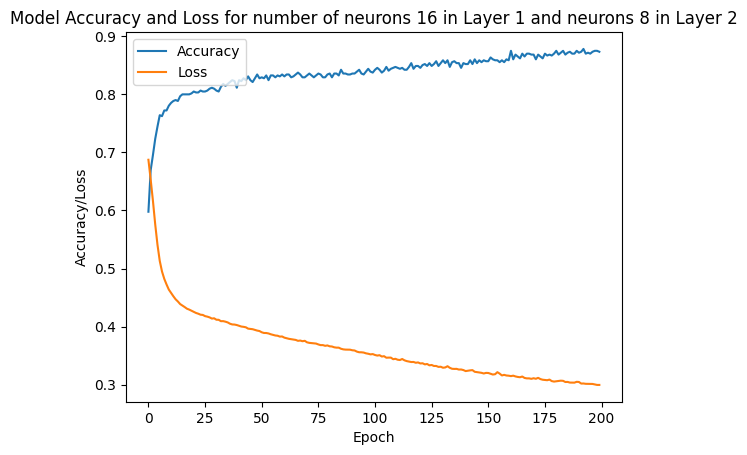

Evaluating the model on the train set for number of neurons 16 in Layer 1 and neurons 8 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Train accuracy: 0.87
Precision on train data: 0.85
Recall on train data: 0.77
ROC AUC Score on train data: 0.85


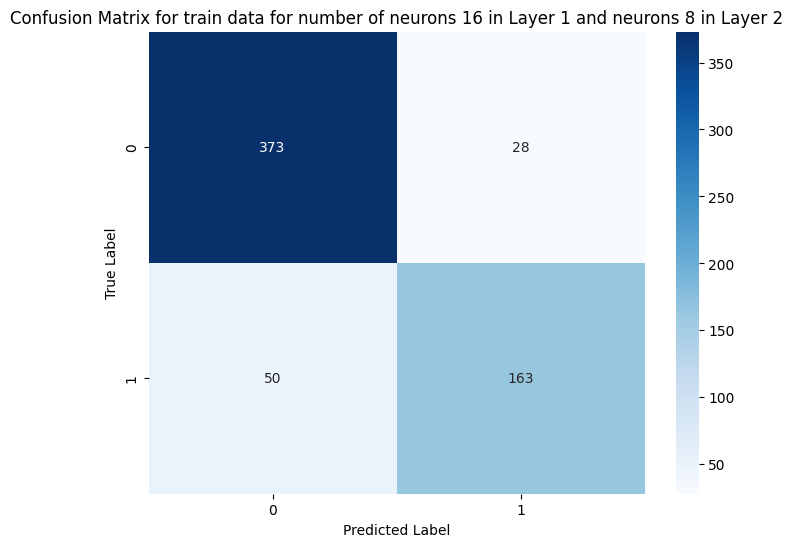

Evaluating the model on the test set for number of neurons 16 in Layer 1 and neurons 8 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Test accuracy: 0.72
Precision on test data: 0.62
Recall on test data: 0.58
ROC AUC Score on test data: 0.69


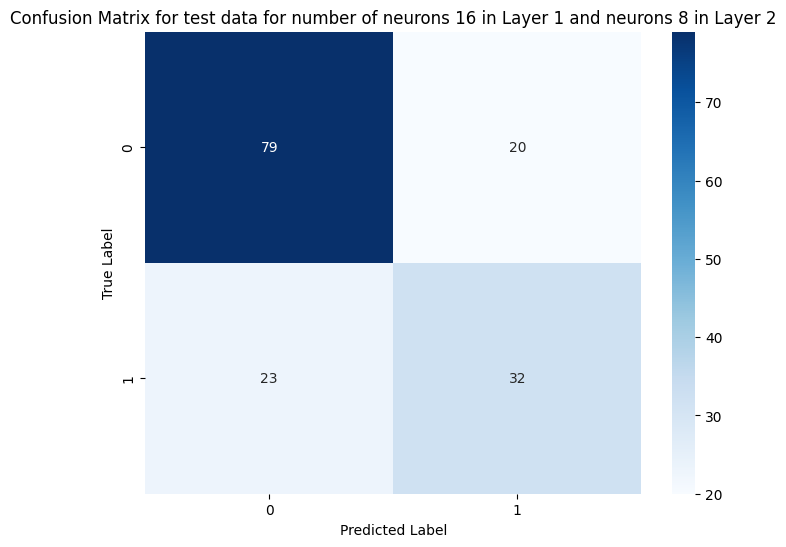

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


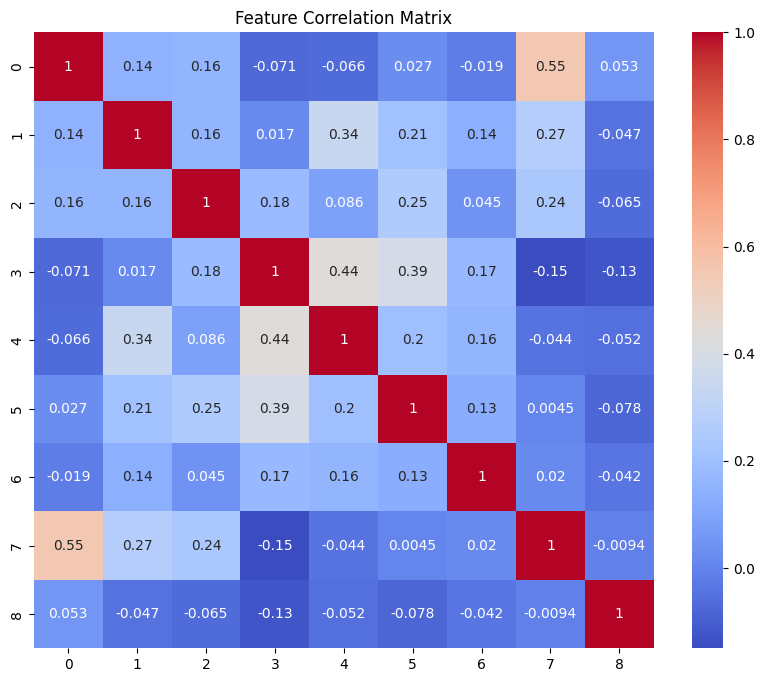

preprocessing Test Set Data....


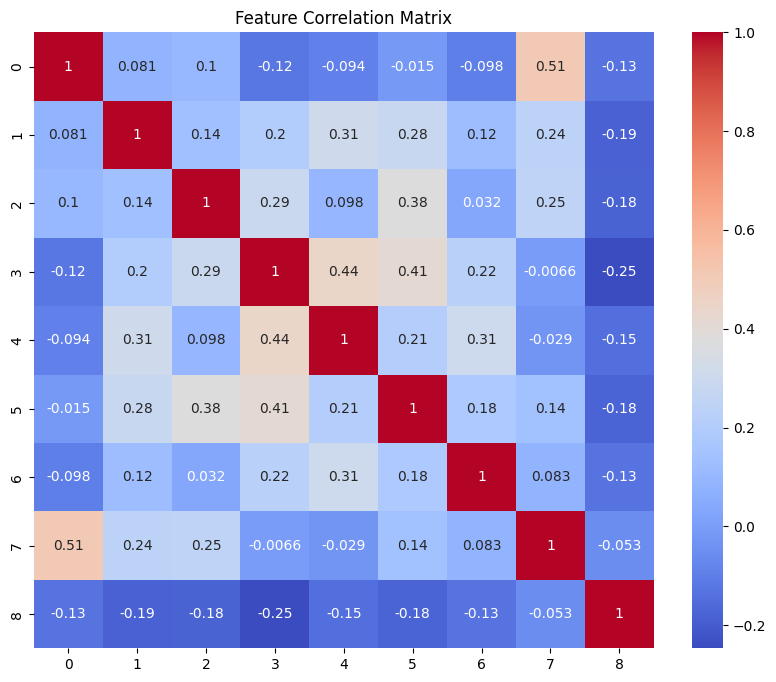

Training for number of neurons 16 in Layer 1 and neurons 9 in Layer 2.......





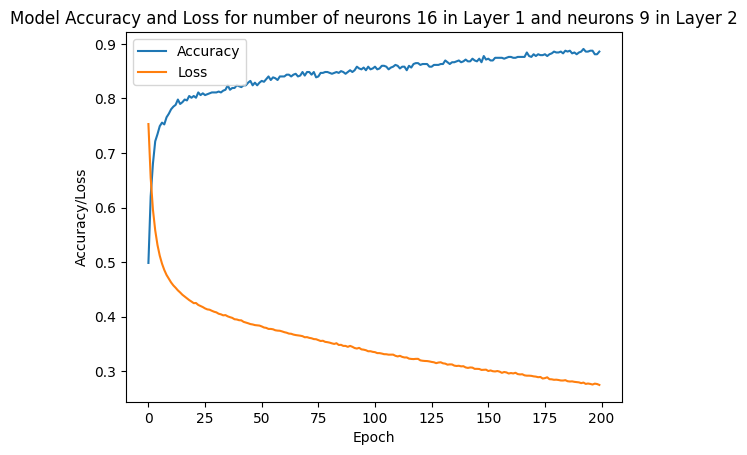

Evaluating the model on the train set for number of neurons 16 in Layer 1 and neurons 9 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Train accuracy: 0.89
Precision on train data: 0.85
Recall on train data: 0.82
ROC AUC Score on train data: 0.87


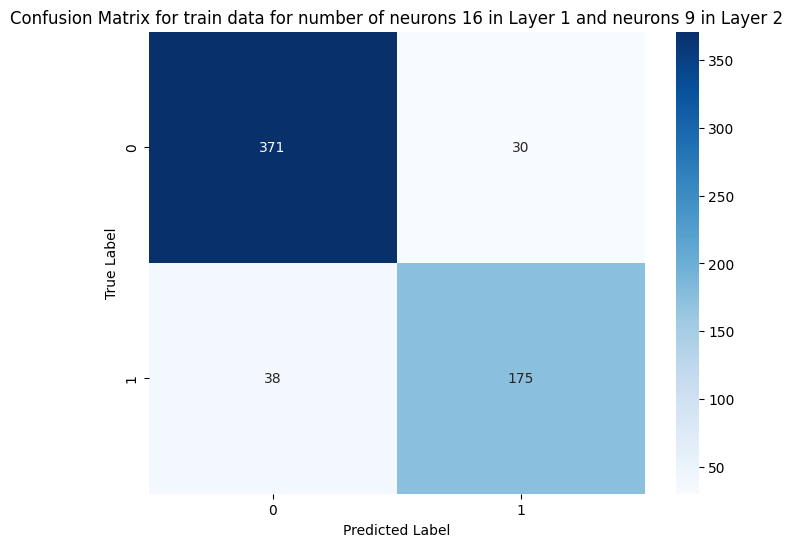

Evaluating the model on the test set for number of neurons 16 in Layer 1 and neurons 9 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Test accuracy: 0.73
Precision on test data: 0.63
Recall on test data: 0.62
ROC AUC Score on test data: 0.71


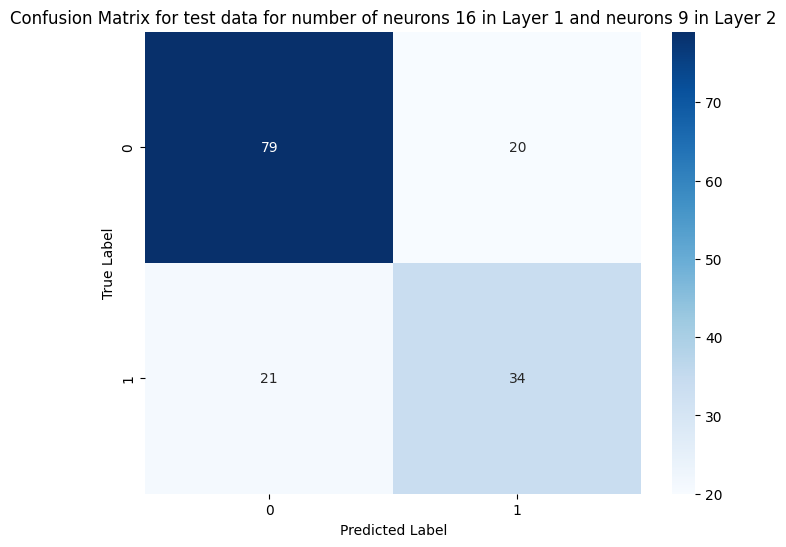

preprocessing Train Set Data....


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


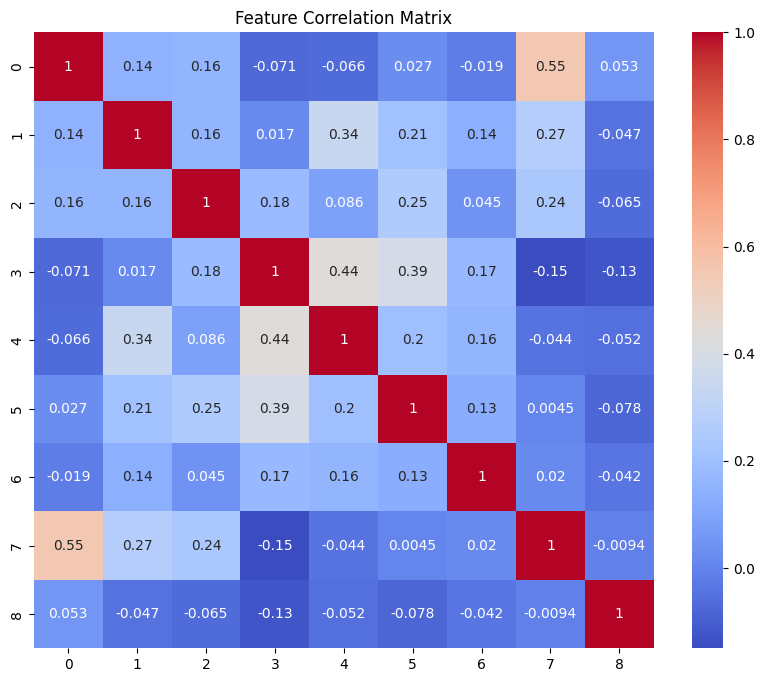

preprocessing Test Set Data....


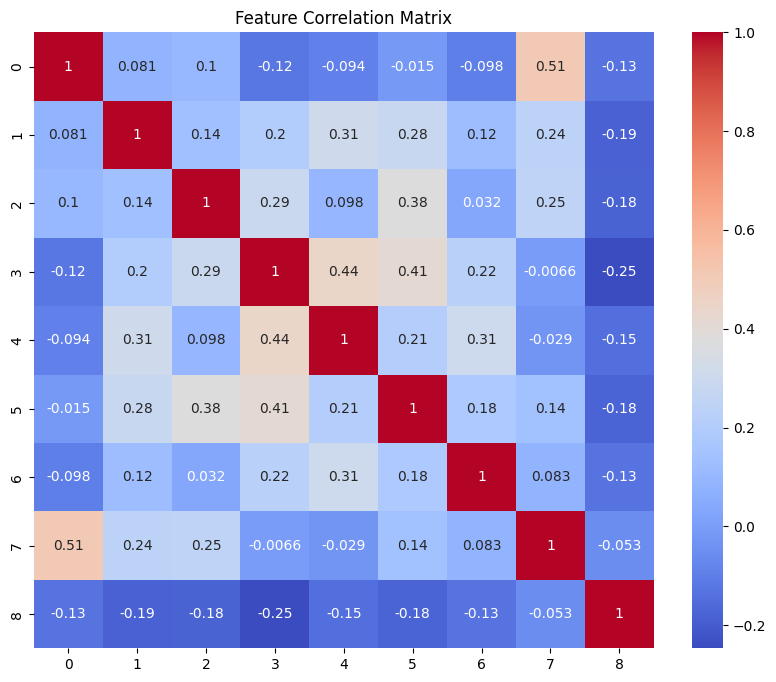

Training for number of neurons 16 in Layer 1 and neurons 10 in Layer 2.......





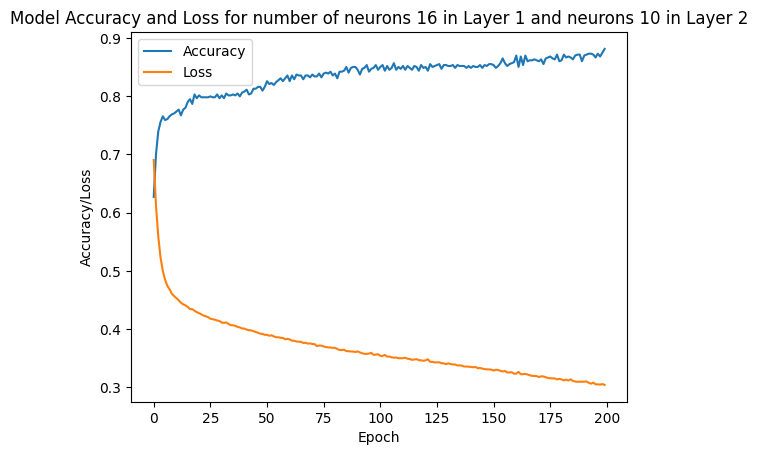

Evaluating the model on the train set for number of neurons 16 in Layer 1 and neurons 10 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Train accuracy: 0.88
Precision on train data: 0.85
Recall on train data: 0.80
ROC AUC Score on train data: 0.86


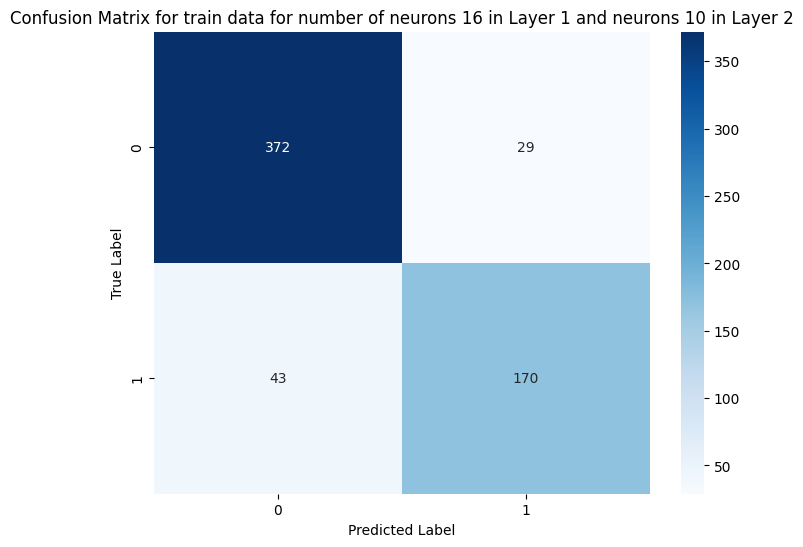

Evaluating the model on the test set for number of neurons 16 in Layer 1 and neurons 10 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Test accuracy: 0.73
Precision on test data: 0.63
Recall on test data: 0.58
ROC AUC Score on test data: 0.69


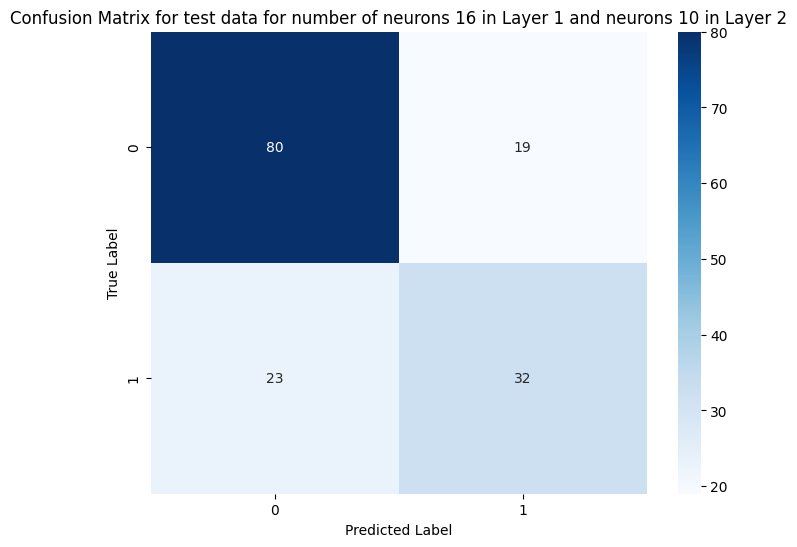

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


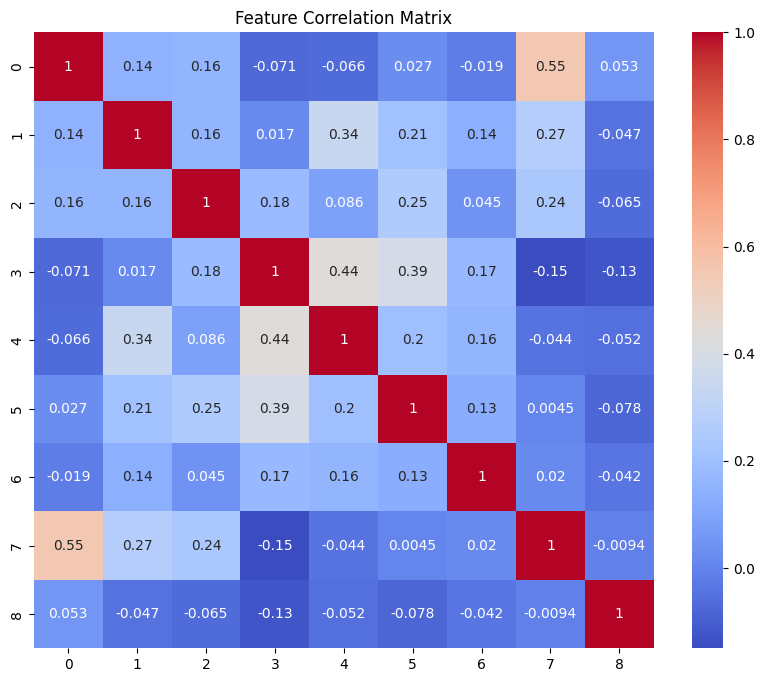

preprocessing Test Set Data....


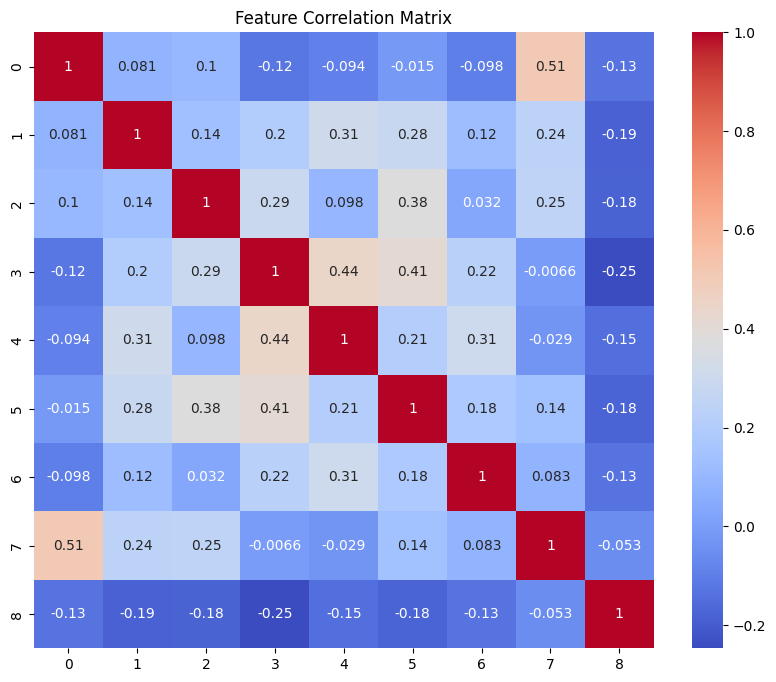

Training for number of neurons 16 in Layer 1 and neurons 11 in Layer 2.......





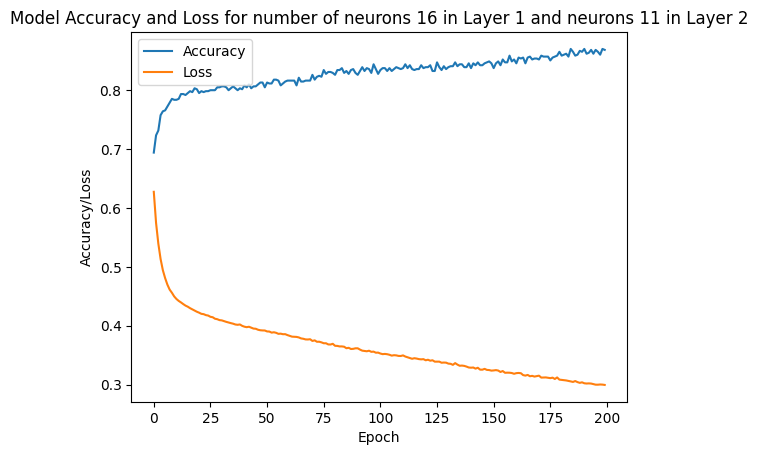

Evaluating the model on the train set for number of neurons 16 in Layer 1 and neurons 11 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Train accuracy: 0.87
Precision on train data: 0.85
Recall on train data: 0.76
ROC AUC Score on train data: 0.85


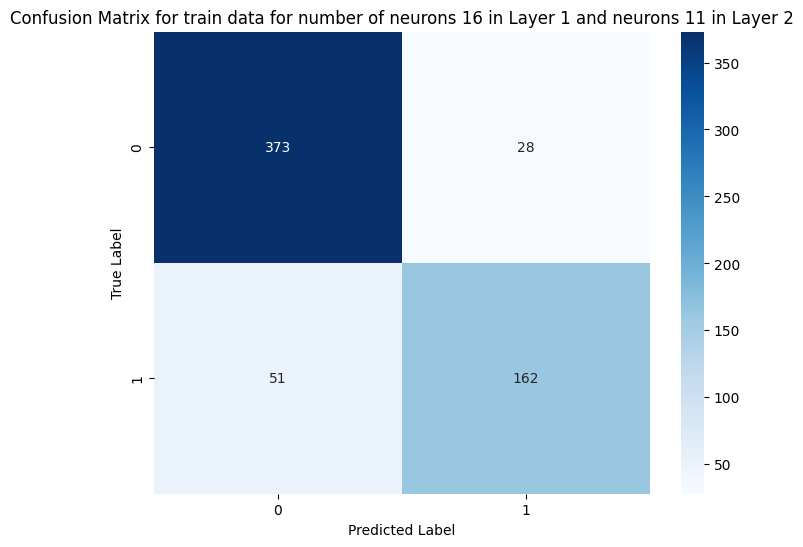

Evaluating the model on the test set for number of neurons 16 in Layer 1 and neurons 11 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Test accuracy: 0.74
Precision on test data: 0.65
Recall on test data: 0.60
ROC AUC Score on test data: 0.71


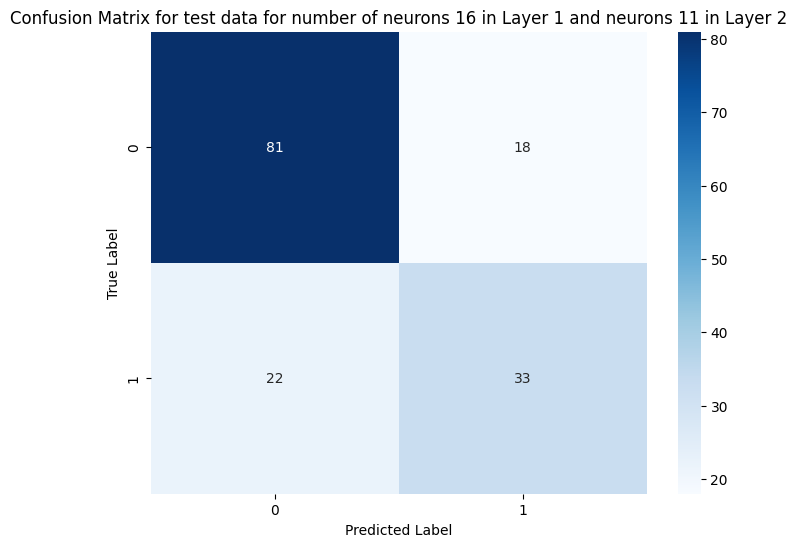

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


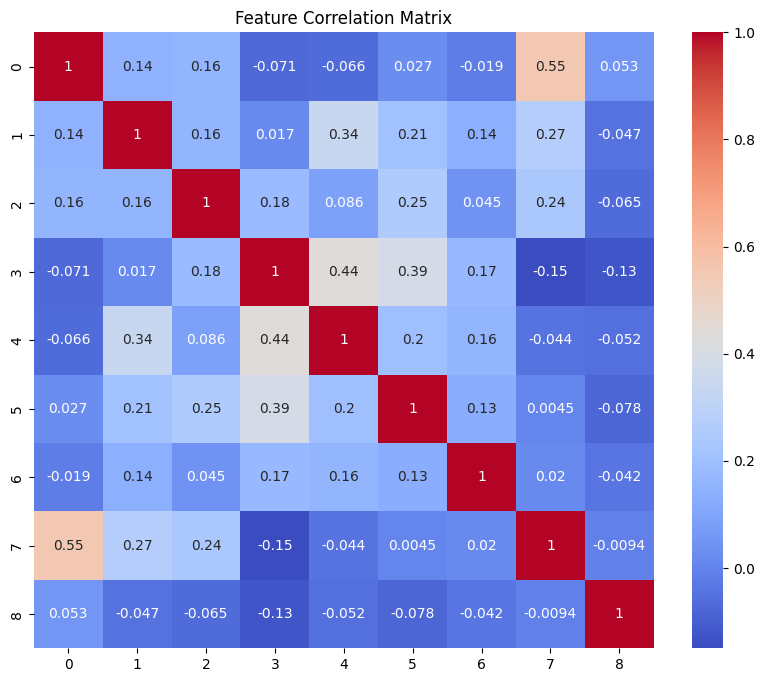

preprocessing Test Set Data....


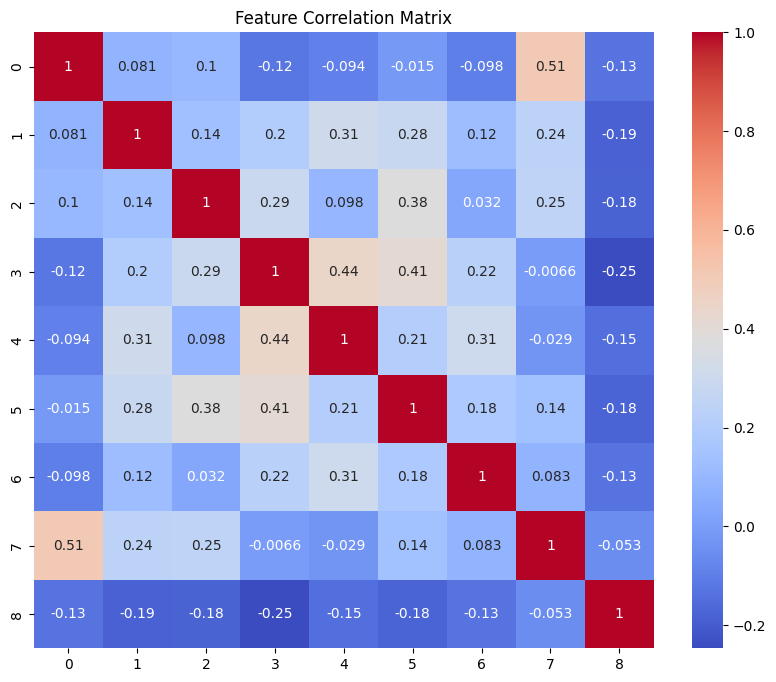

Training for number of neurons 16 in Layer 1 and neurons 12 in Layer 2.......





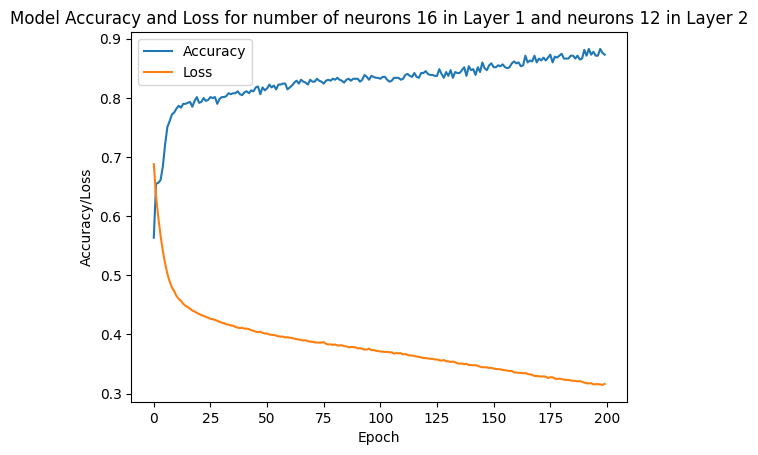

Evaluating the model on the train set for number of neurons 16 in Layer 1 and neurons 12 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Train accuracy: 0.88
Precision on train data: 0.84
Recall on train data: 0.81
ROC AUC Score on train data: 0.86


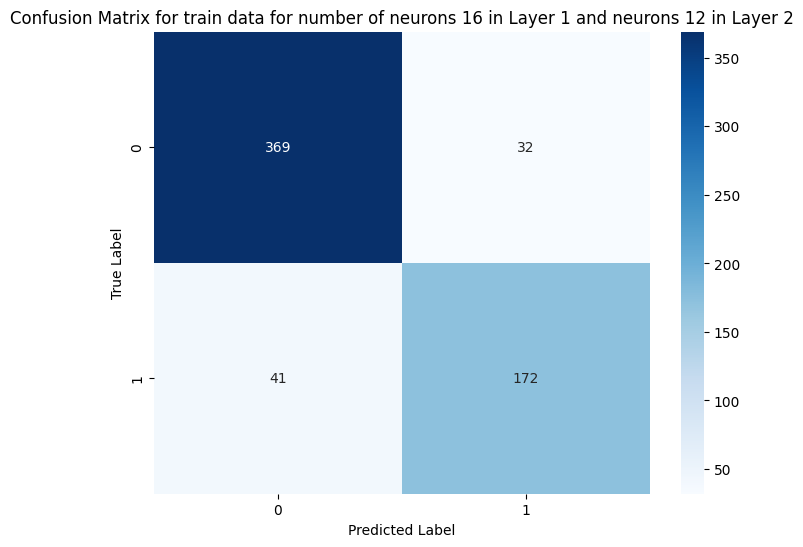

Evaluating the model on the test set for number of neurons 16 in Layer 1 and neurons 12 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Test accuracy: 0.75
Precision on test data: 0.65
Recall on test data: 0.67
ROC AUC Score on test data: 0.74


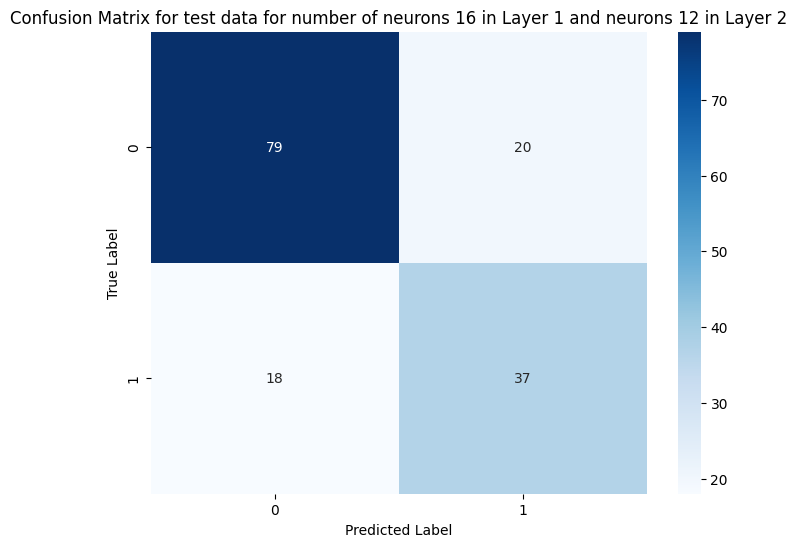

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


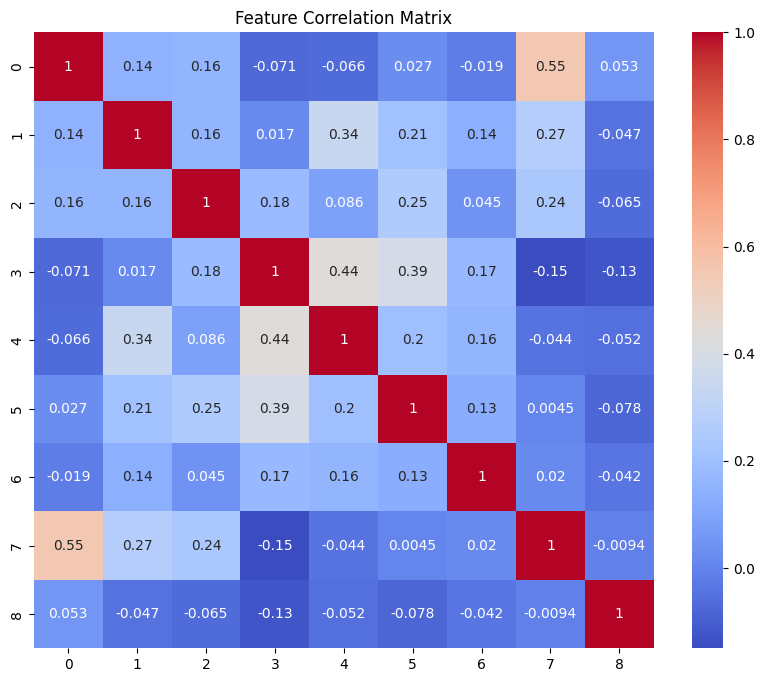

preprocessing Test Set Data....


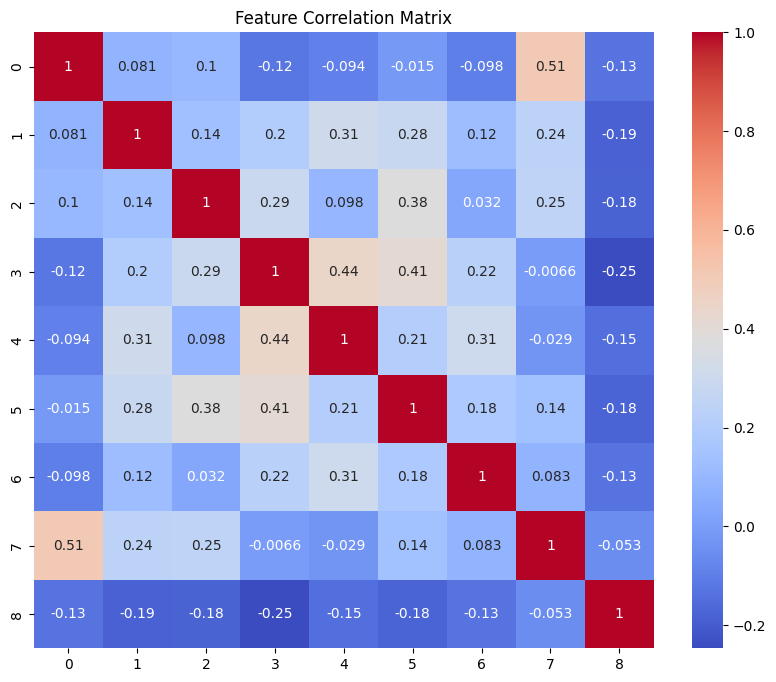

Training for number of neurons 16 in Layer 1 and neurons 13 in Layer 2.......





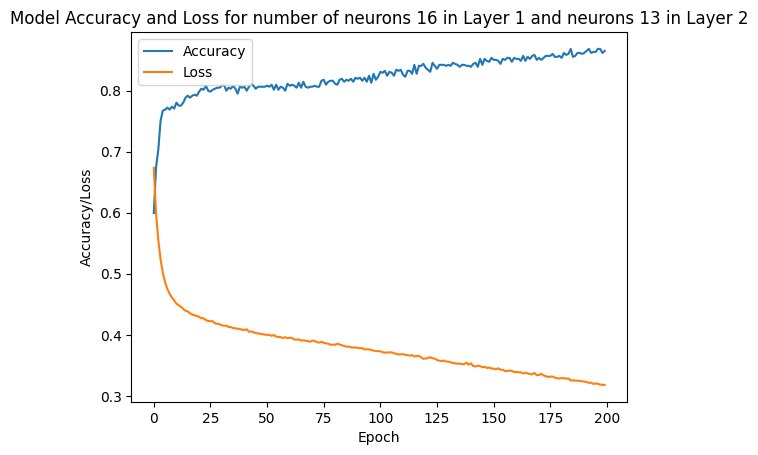

Evaluating the model on the train set for number of neurons 16 in Layer 1 and neurons 13 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Train accuracy: 0.87
Precision on train data: 0.83
Recall on train data: 0.78
ROC AUC Score on train data: 0.85


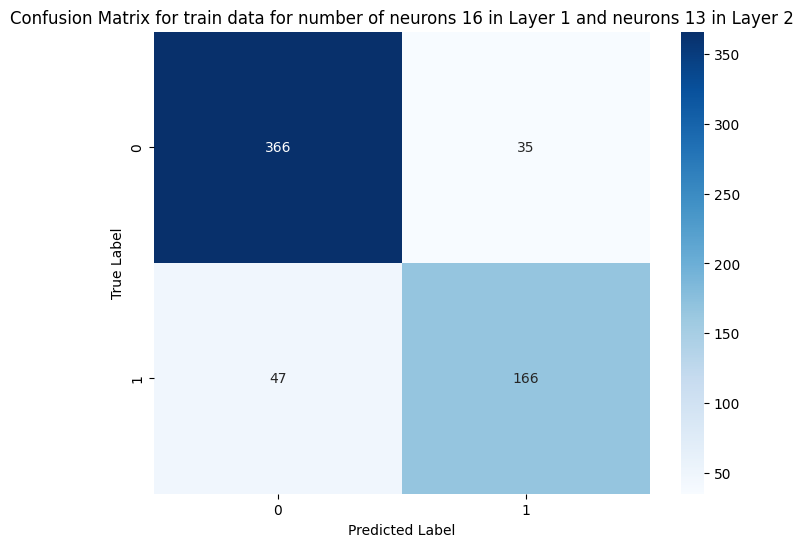

Evaluating the model on the test set for number of neurons 16 in Layer 1 and neurons 13 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Test accuracy: 0.73
Precision on test data: 0.64
Recall on test data: 0.58
ROC AUC Score on test data: 0.70


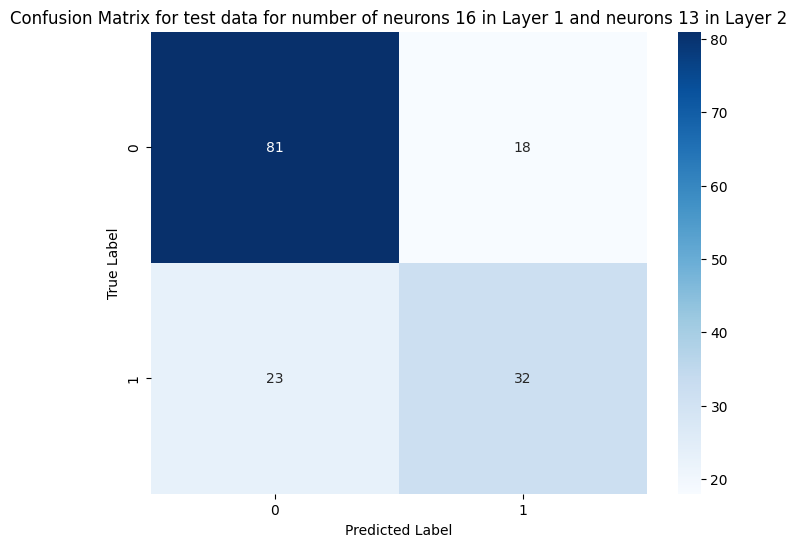

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


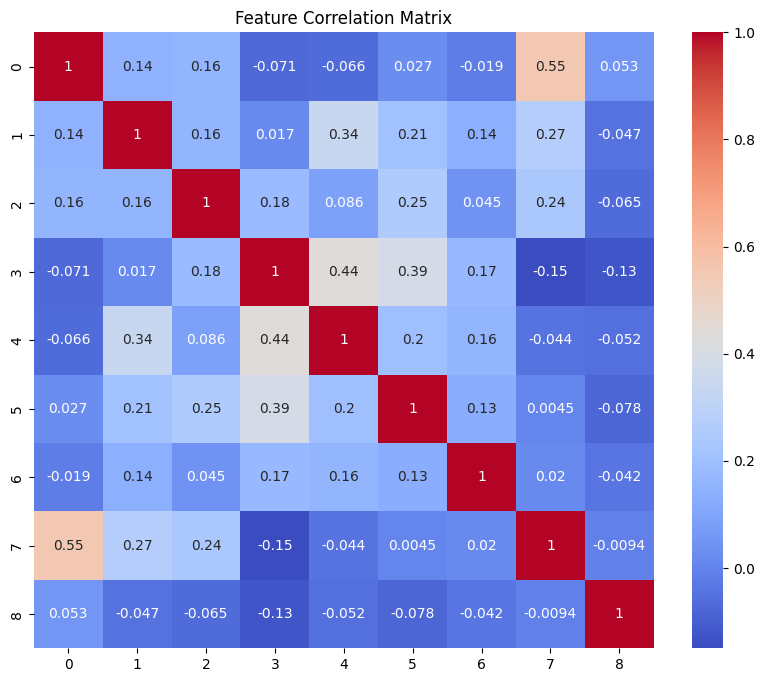

preprocessing Test Set Data....


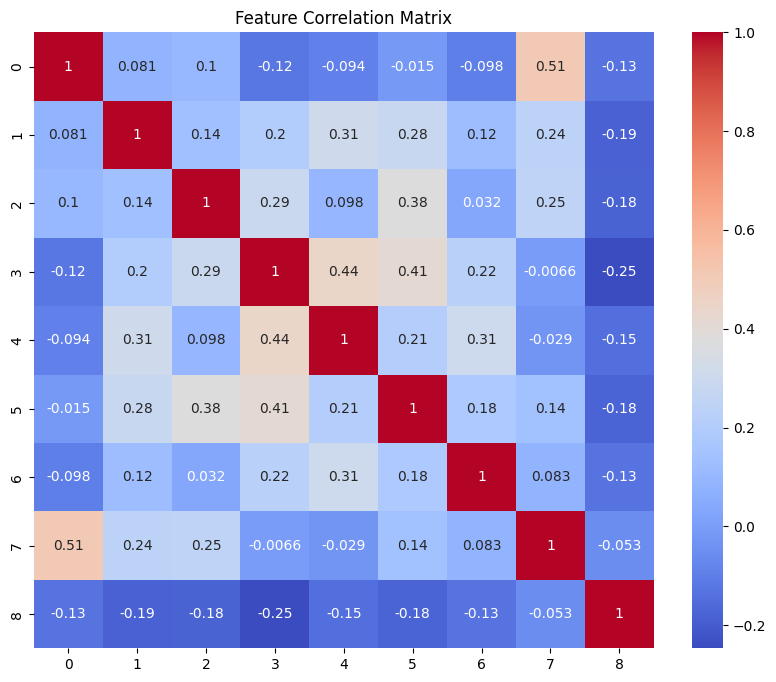

Training for number of neurons 16 in Layer 1 and neurons 14 in Layer 2.......





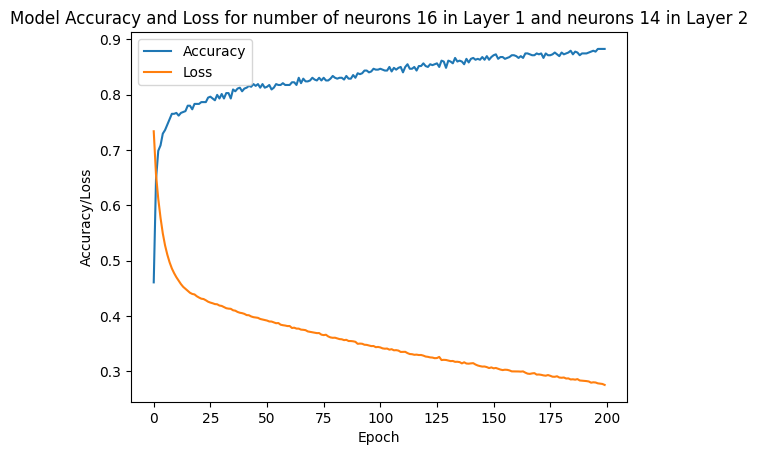

Evaluating the model on the train set for number of neurons 16 in Layer 1 and neurons 14 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Train accuracy: 0.88
Precision on train data: 0.84
Recall on train data: 0.82
ROC AUC Score on train data: 0.87


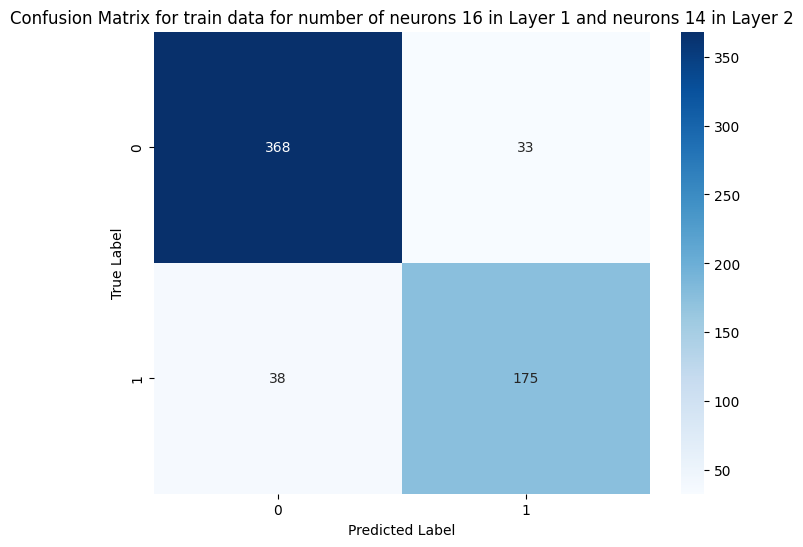

Evaluating the model on the test set for number of neurons 16 in Layer 1 and neurons 14 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Test accuracy: 0.73
Precision on test data: 0.62
Recall on test data: 0.64
ROC AUC Score on test data: 0.71


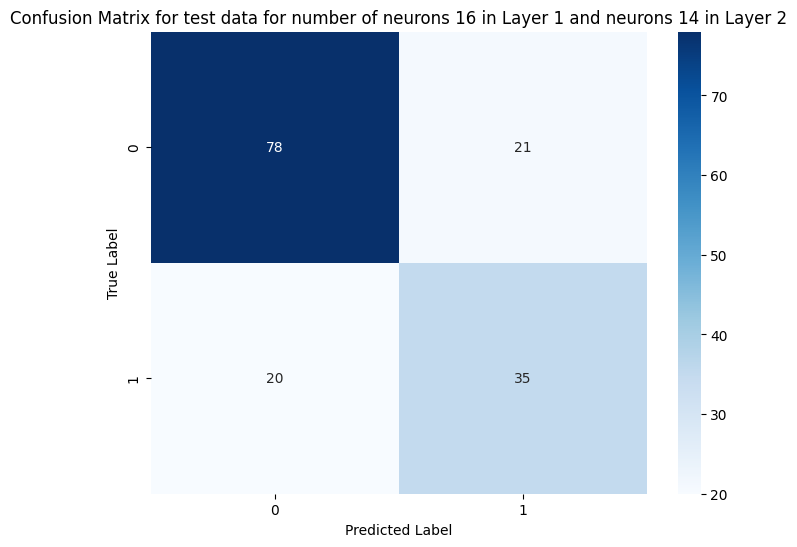

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


preprocessing Train Set Data....


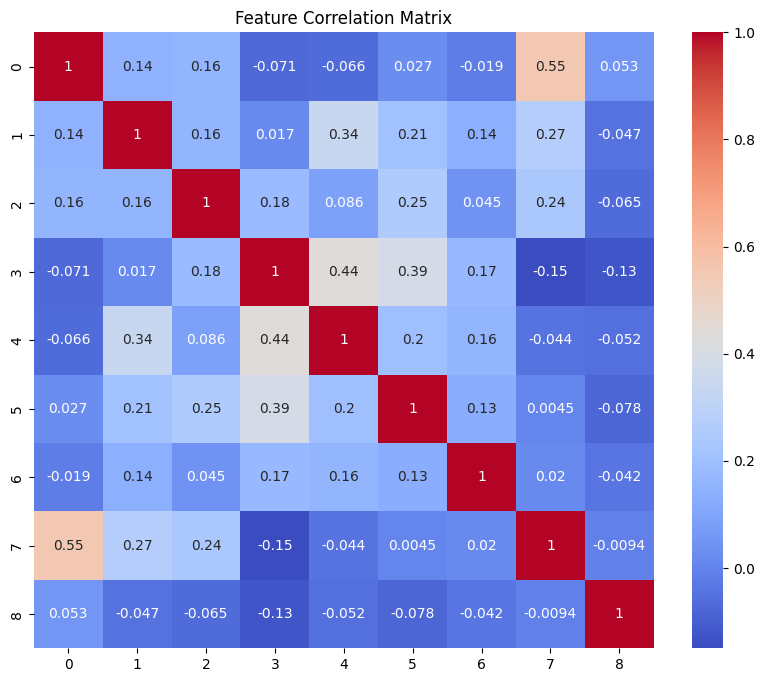

preprocessing Test Set Data....


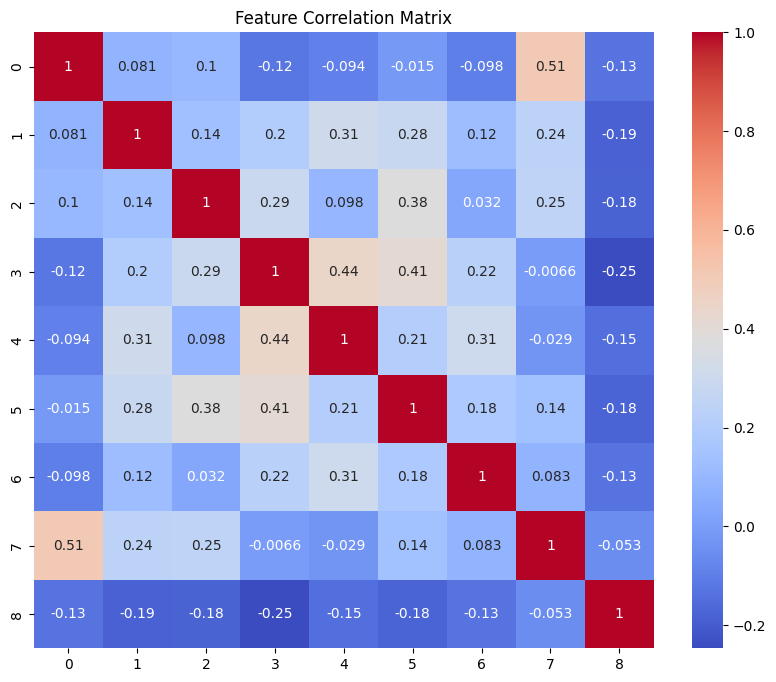

Training for number of neurons 16 in Layer 1 and neurons 15 in Layer 2.......





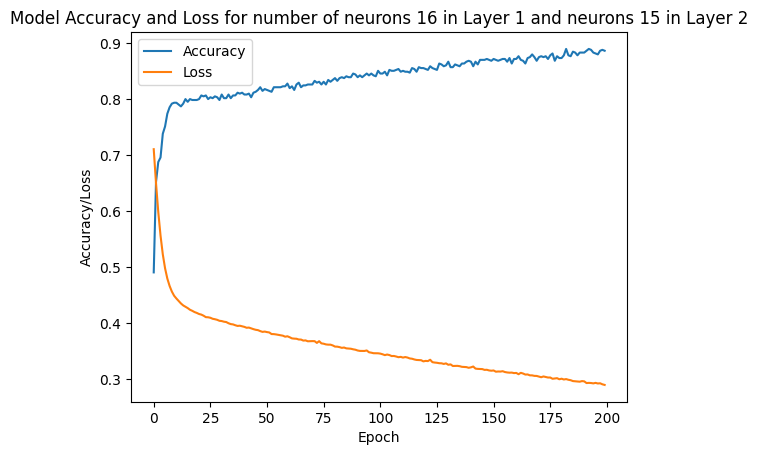

Evaluating the model on the train set for number of neurons 16 in Layer 1 and neurons 15 in Layer 2


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Train accuracy: 0.89
Precision on train data: 0.87
Recall on train data: 0.82
ROC AUC Score on train data: 0.88


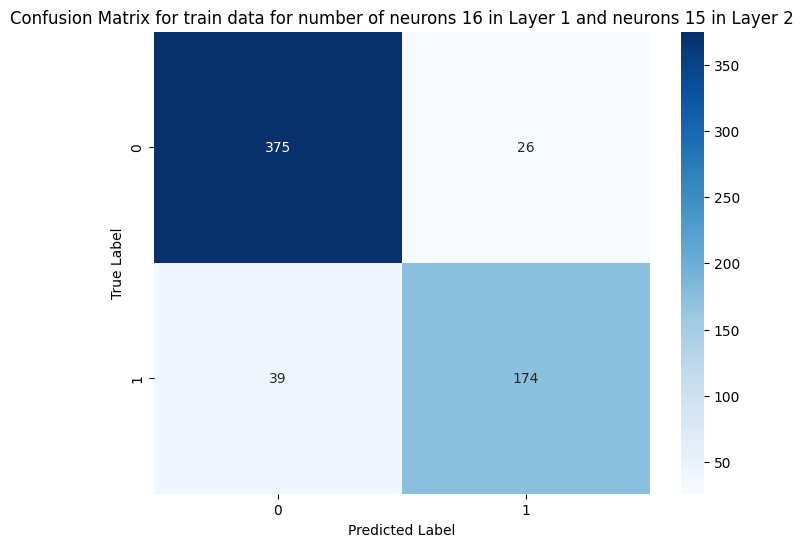

Evaluating the model on the test set for number of neurons 16 in Layer 1 and neurons 15 in Layer 2


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Test accuracy: 0.73
Precision on test data: 0.61
Recall on test data: 0.65
ROC AUC Score on test data: 0.71


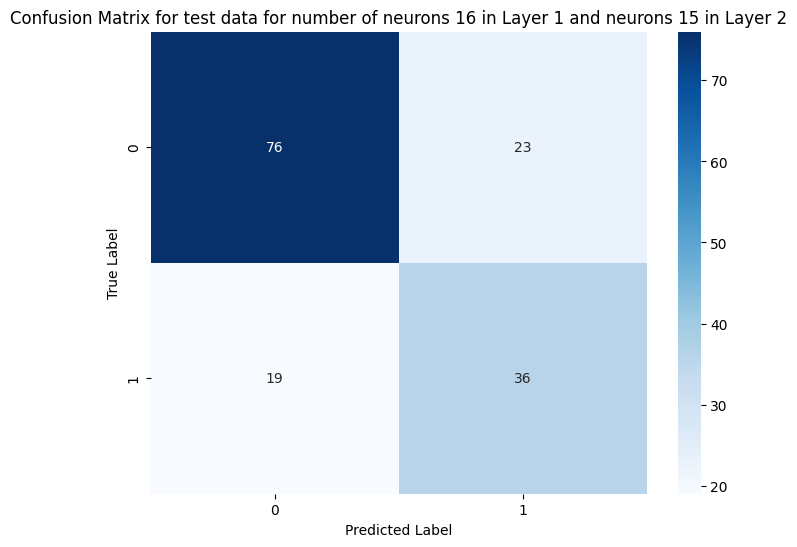

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

    number of neurons (layer 2)  train_size_val  Train Accuracy  \
0                             5             0.8        0.869707   
1                             6             0.8        0.869707   
2                             7             0.8        0.851792   
3                             8             0.8        0.872964   
4                             9             0.8        0.889251   
5                            10             0.8        0.882736   
6                            11             0.8        0.871336   
7                            12             0.8        0.881108   
8                            13             0.8        0.866450   
9                            14             0.8        0.884365   
10                           15             0.8        0.894137   

    Train Precision  Train Recall  Train ROC AUC  Test Accuracy  \
0          0.834171      0.779343       0.848524       0.779221   
1          0.834171      0.779343       0.848524       0.7337

In [ ]:
# @title Investigating neuron numbers variation in layer 2
if __name__ == "__main__":

  # Load dataset and perform basic splitting..
  X, y = load_data('pima-indians-diabetes.csv')
  test_size_val = 0.2
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size_val, random_state=42)

  results = []
  for n_layer2 in range(5, 16):
      train_accuracy, train_conf_matrix, train_precision, train_recall, train_roc_auc, test_accuracy, test_conf_matrix, test_precision, test_recall, test_roc_auc = main_nlayer(X_train, y_train, X_test, y_test, n_layer1=16, n_layer2 = n_layer2, epochs=200, batch_size=15,  preprocess =True)
      results.append([n_layer2, 1-test_size_val, train_accuracy, train_precision, train_recall, train_roc_auc, test_accuracy, test_precision, test_recall, test_roc_auc])

  results_df = pd.DataFrame(results, columns=['number of neurons (layer 2)', 'train_size_val', 'Train Accuracy', 'Train Precision', 'Train Recall', 'Train ROC AUC', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test ROC AUC'])
  results_df.to_csv('layer2_neuron_vary_results.csv', index=False)
  files.download('layer2_neuron_vary_results.csv')
  print(results_df)


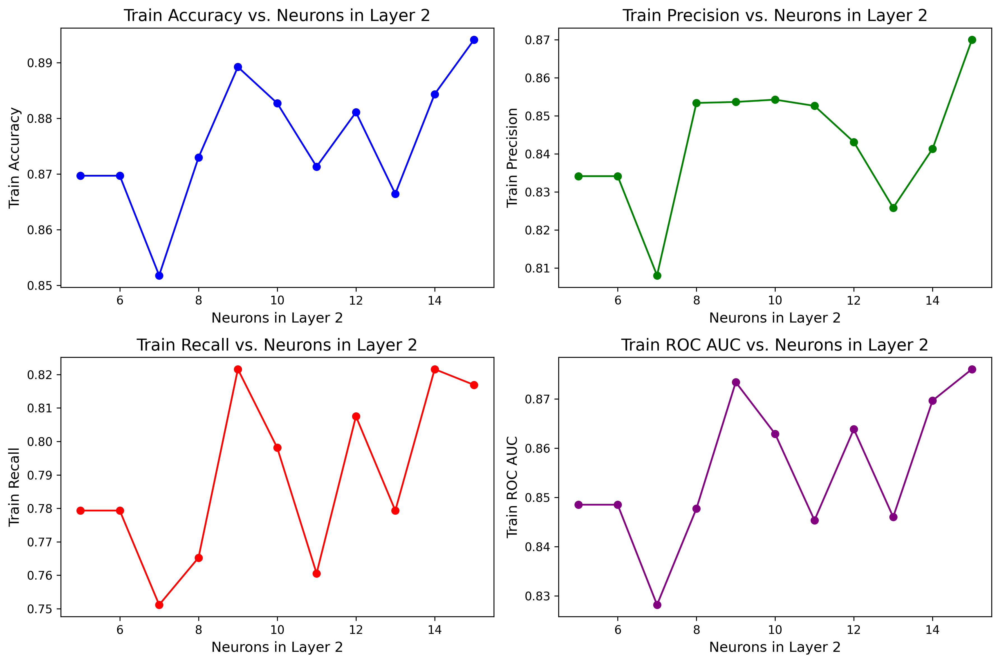

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

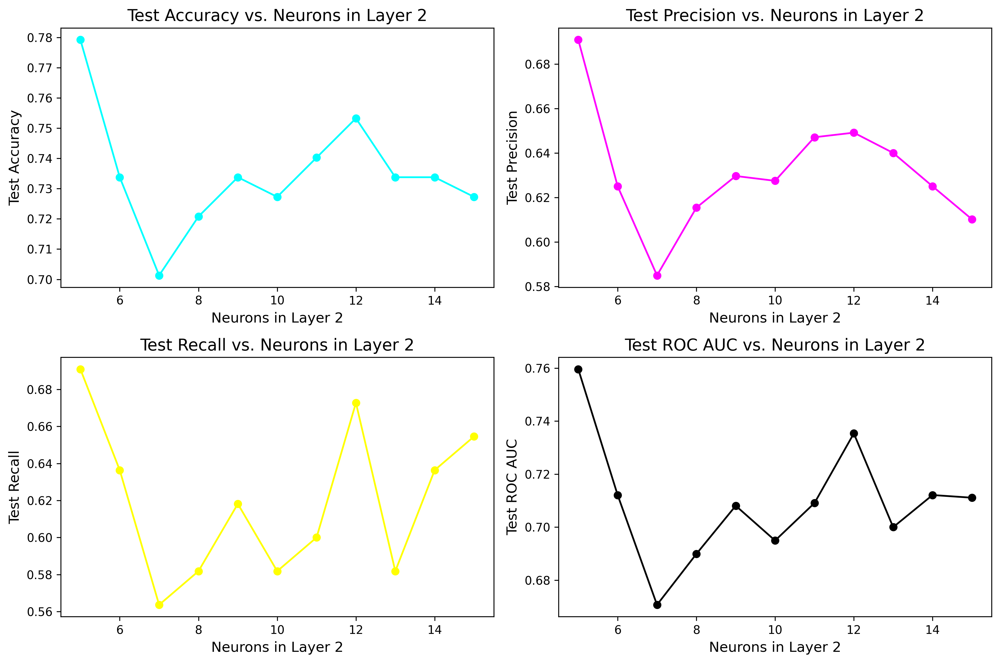

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# @title plots for varying neurons in layer 2

# --- Figure 1: Neurons in Layer 2 vs. Train Metrics ---
fig1, axes1 = plt.subplots(2, 2, figsize=(12, 8), dpi=300)  # High resolution
colors1 = ['blue', 'green', 'red', 'purple']

axes1[0, 0].plot(results_df['number of neurons (layer 2)'], results_df['Train Accuracy'], marker='o', color=colors1[0])
axes1[0, 0].set_title('Train Accuracy vs. Neurons in Layer 2', fontsize=14)  # Increased font size
axes1[0, 0].set_xlabel('Neurons in Layer 2', fontsize=12)
axes1[0, 0].set_ylabel('Train Accuracy', fontsize=12)

axes1[0, 1].plot(results_df['number of neurons (layer 2)'], results_df['Train Precision'], marker='o', color=colors1[1])
axes1[0, 1].set_title('Train Precision vs. Neurons in Layer 2', fontsize=14)
axes1[0, 1].set_xlabel('Neurons in Layer 2', fontsize=12)
axes1[0, 1].set_ylabel('Train Precision', fontsize=12)

axes1[1, 0].plot(results_df['number of neurons (layer 2)'], results_df['Train Recall'], marker='o', color=colors1[2])
axes1[1, 0].set_title('Train Recall vs. Neurons in Layer 2', fontsize=14)
axes1[1, 0].set_xlabel('Neurons in Layer 2', fontsize=12)
axes1[1, 0].set_ylabel('Train Recall', fontsize=12)

axes1[1, 1].plot(results_df['number of neurons (layer 2)'], results_df['Train ROC AUC'], marker='o', color=colors1[3])
axes1[1, 1].set_title('Train ROC AUC vs. Neurons in Layer 2', fontsize=14)
axes1[1, 1].set_xlabel('Neurons in Layer 2', fontsize=12)
axes1[1, 1].set_ylabel('Train ROC AUC', fontsize=12)

plt.tight_layout()
plt.savefig('neurons_layer2_vs_train_metrics.png', dpi=300)  # Save before downloading
plt.show()

files.download('neurons_layer2_vs_train_metrics.png')  # Download the figure



# --- Figure 2: Neurons in Layer 2 vs. Test Metrics ---
fig2, axes2 = plt.subplots(2, 2, figsize=(12, 8), dpi=300)
colors2 = ['cyan', 'magenta', 'yellow', 'black']

axes2[0, 0].plot(results_df['number of neurons (layer 2)'], results_df['Test Accuracy'], marker='o', color=colors2[0])
axes2[0, 0].set_title('Test Accuracy vs. Neurons in Layer 2', fontsize=14)
axes2[0, 0].set_xlabel('Neurons in Layer 2', fontsize=12)
axes2[0, 0].set_ylabel('Test Accuracy', fontsize=12)


axes2[0, 1].plot(results_df['number of neurons (layer 2)'], results_df['Test Precision'], marker='o', color=colors2[1])
axes2[0, 1].set_title('Test Precision vs. Neurons in Layer 2', fontsize=14)
axes2[0, 1].set_xlabel('Neurons in Layer 2', fontsize=12)
axes2[0, 1].set_ylabel('Test Precision', fontsize=12)

axes2[1, 0].plot(results_df['number of neurons (layer 2)'], results_df['Test Recall'], marker='o', color=colors2[2])
axes2[1, 0].set_title('Test Recall vs. Neurons in Layer 2', fontsize=14)
axes2[1, 0].set_xlabel('Neurons in Layer 2', fontsize=12)
axes2[1, 0].set_ylabel('Test Recall', fontsize=12)

axes2[1, 1].plot(results_df['number of neurons (layer 2)'], results_df['Test ROC AUC'], marker='o', color=colors2[3])
axes2[1, 1].set_title('Test ROC AUC vs. Neurons in Layer 2', fontsize=14)
axes2[1, 1].set_xlabel('Neurons in Layer 2', fontsize=12)
axes2[1, 1].set_ylabel('Test ROC AUC', fontsize=12)

plt.tight_layout()
plt.savefig('neurons_layer2_vs_test_metrics.png', dpi=300)
plt.show()

files.download('neurons_layer2_vs_test_metrics.png')

**Task-4**: Vary the activation function in Layer#1. Try the ones shown in the lecture. Document the results and identify the best cases. Try to intuitively justify the reason behind the best hyperparameter values.


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Training with Layer 1 Activation: relu and Layer 2 Activation: relu

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train Accuracy: 0.76, Precision: 0.79, Recall: 0.41, ROC AUC: 0.68


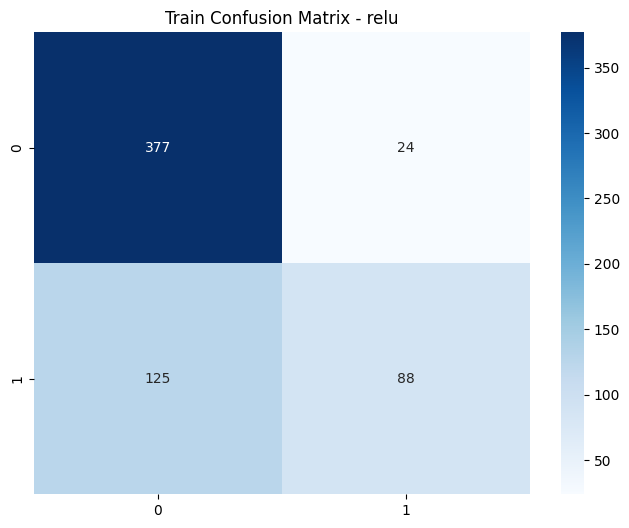

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Test Accuracy: 0.71, Precision: 0.66, Recall: 0.38, ROC AUC: 0.64


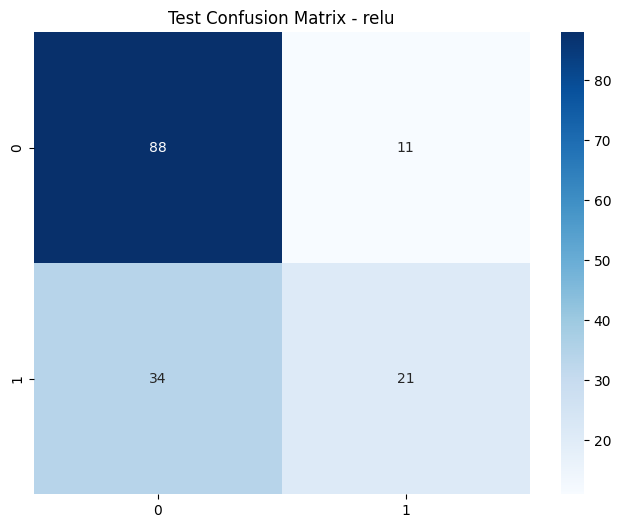

Training with Layer 1 Activation: sigmoid and Layer 2 Activation: relu



/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Train Accuracy: 0.76, Precision: 0.71, Recall: 0.51, ROC AUC: 0.70


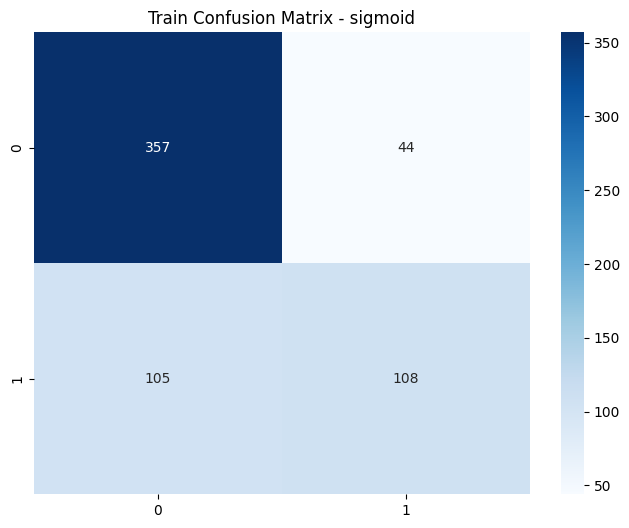

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Test Accuracy: 0.68, Precision: 0.58, Recall: 0.35, ROC AUC: 0.60


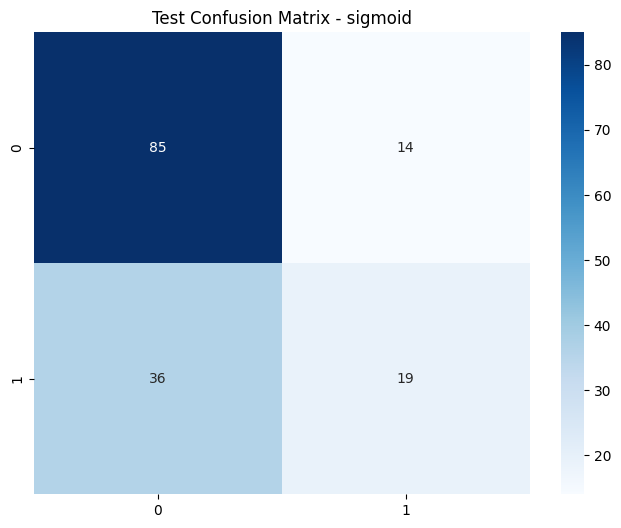

Training with Layer 1 Activation: tanh and Layer 2 Activation: relu



/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train Accuracy: 0.70, Precision: 0.61, Recall: 0.40, ROC AUC: 0.63


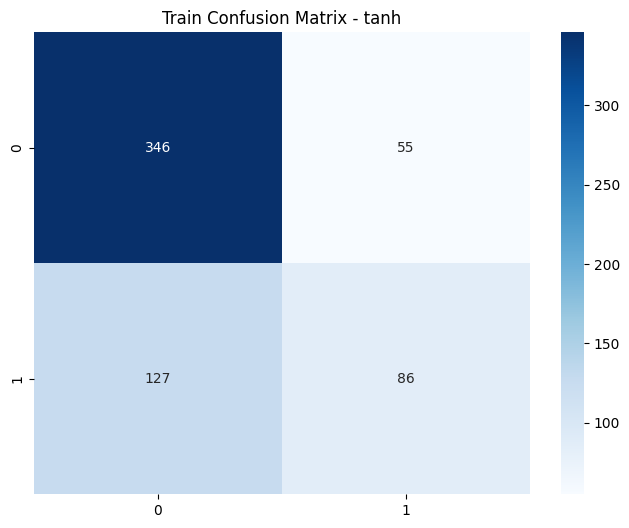

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Test Accuracy: 0.63, Precision: 0.47, Recall: 0.29, ROC AUC: 0.55


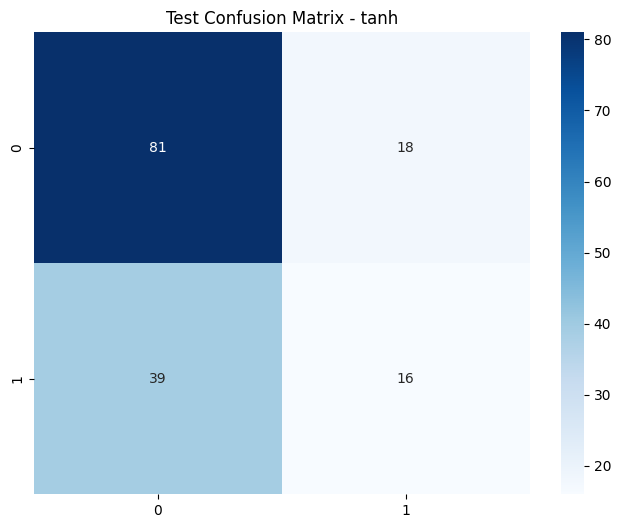

Training with Layer 1 Activation: softmax and Layer 2 Activation: relu



/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train Accuracy: 0.65, Precision: 1.00, Recall: 0.00, ROC AUC: 0.50


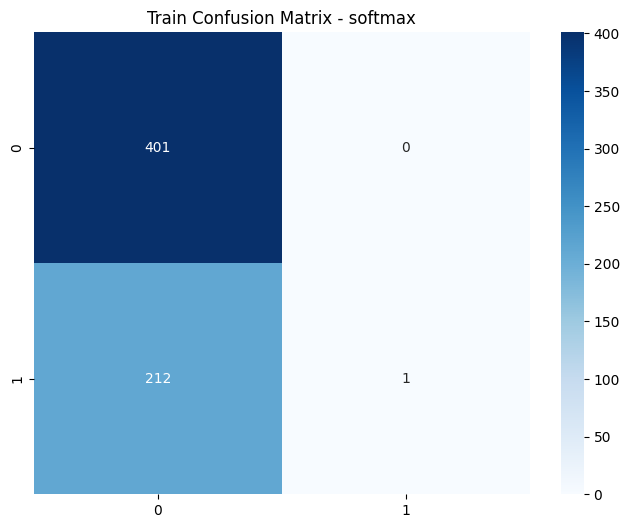

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Test Accuracy: 0.64, Precision: 0.00, Recall: 0.00, ROC AUC: 0.50


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


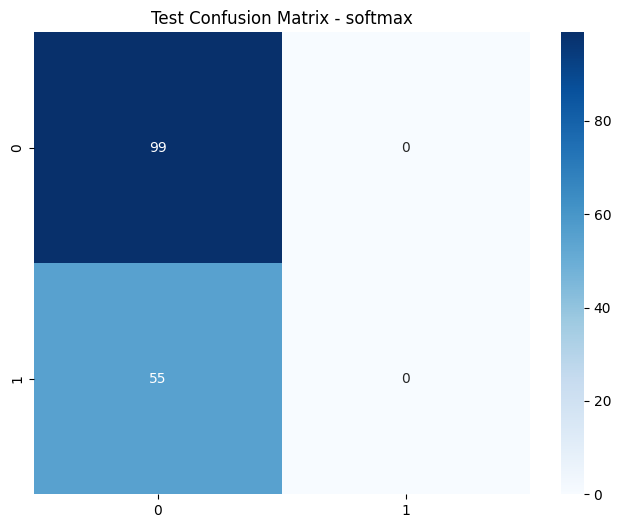

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  Layer 1 Activation  Train Accuracy        Train Conf Matrix  \
0               relu        0.757329   [[377, 24], [125, 88]]   
1            sigmoid        0.757329  [[357, 44], [105, 108]]   
2               tanh        0.703583   [[346, 55], [127, 86]]   
3            softmax        0.654723     [[401, 0], [212, 1]]   

   Train Precision  Train Recall  Train ROC AUC  Test Accuracy  \
0         0.785714      0.413146       0.676648       0.707792   
1         0.710526      0.507042       0.698658       0.675325   
2         0.609929      0.403756       0.633299       0.629870   
3         1.000000      0.004695       0.502347       0.642857   

       Test Conf Matrix  Test Precision  Test Recall  Test ROC AUC  
0  [[88, 11], [34, 21]]        0.656250     0.381818      0.635354  
1  [[85, 14], [36, 19]]        0.575758     0.345455      0.602020  
2  [[81, 18], [39, 16]]        0.470588     0.290909      0.554545  
3    [[99, 0], [55, 0]]        0.000000     0.000000      0.500000 

In [ ]:
# @title varying activation functions in layer 1

def main_actv_fnc(X_train, y_train, X_test, y_test, layer1_actv_fnc='relu', layer2_actv_fnc='relu', n_layer1=12, n_layer2=8, epochs=200, batch_size=15, preprocess=False):
    classifier = DiabetesClassifier(n_layer1=n_layer1, n_layer2=n_layer2, layer1_actv_fnc=layer1_actv_fnc, layer2_actv_fnc=layer2_actv_fnc)

    if preprocess:
        print(f"preprocessing Train Set Data....")
        train_preprocessor = DataPreprocessor()
        X_train = train_preprocessor.preprocess(X_train)
        train_preprocessor.plot_correlation(pd.concat([X_train, y_train], axis=1))

        print(f"preprocessing Test Set Data....")
        test_preprocessor = DataPreprocessor()
        X_test = test_preprocessor.preprocess(X_test)
        test_preprocessor.plot_correlation(pd.concat([X_test, y_test], axis=1))

    print(f"Training with Layer 1 Activation: {layer1_actv_fnc} and Layer 2 Activation: {layer2_actv_fnc}\n")
    history = classifier.train(X_train, y_train, epochs=epochs, batch_size=batch_size)

    # Train evaluation
    train_metrics = classifier.evaluate(X_train, y_train)
    print(f"Train Accuracy: {train_metrics[0]:.2f}, Precision: {train_metrics[2]:.2f}, Recall: {train_metrics[3]:.2f}, ROC AUC: {train_metrics[4]:.2f}")

    plt.figure(figsize=(8, 6))
    sns.heatmap(train_metrics[1], annot=True, fmt='d', cmap='Blues')
    plt.title(f'Train Confusion Matrix - {layer1_actv_fnc}')
    plt.show()

    # Test evaluation
    test_metrics = classifier.evaluate(X_test, y_test)
    print(f"Test Accuracy: {test_metrics[0]:.2f}, Precision: {test_metrics[2]:.2f}, Recall: {test_metrics[3]:.2f}, ROC AUC: {test_metrics[4]:.2f}")

    plt.figure(figsize=(8, 6))
    sns.heatmap(test_metrics[1], annot=True, fmt='d', cmap='Blues')
    plt.title(f'Test Confusion Matrix - {layer1_actv_fnc}')
    plt.show()

    return train_metrics + test_metrics

if __name__ == "__main__":
    X, y = load_data('pima-indians-diabetes.csv')
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    activation_functions = ['relu', 'sigmoid', 'tanh', 'softmax']
    results = []

    for act_fn in activation_functions:
        metrics = main_actv_fnc(X_train, y_train, X_test, y_test, layer1_actv_fnc=act_fn, layer2_actv_fnc='relu')
        results.append([act_fn] + list(metrics))

    results_df = pd.DataFrame(results, columns=['Layer 1 Activation', 'Train Accuracy', 'Train Conf Matrix', 'Train Precision', 'Train Recall', 'Train ROC AUC', 'Test Accuracy', 'Test Conf Matrix', 'Test Precision', 'Test Recall', 'Test ROC AUC'])
    results_df.to_csv('activation_function_layer1_results.csv', index=False)
    files.download('activation_function_layer1_results.csv')
    print(results_df)


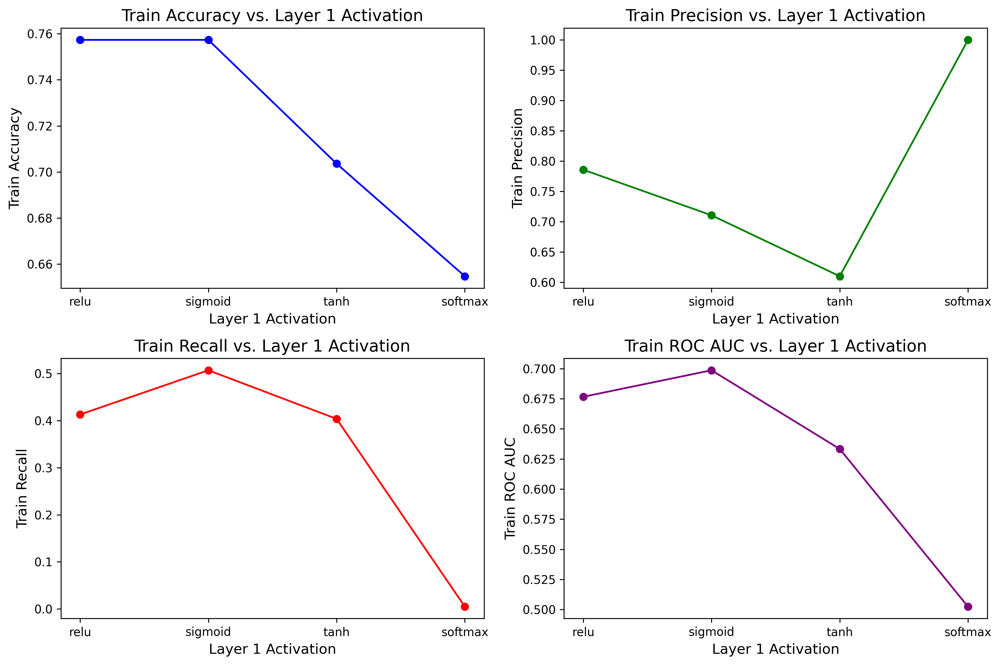

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

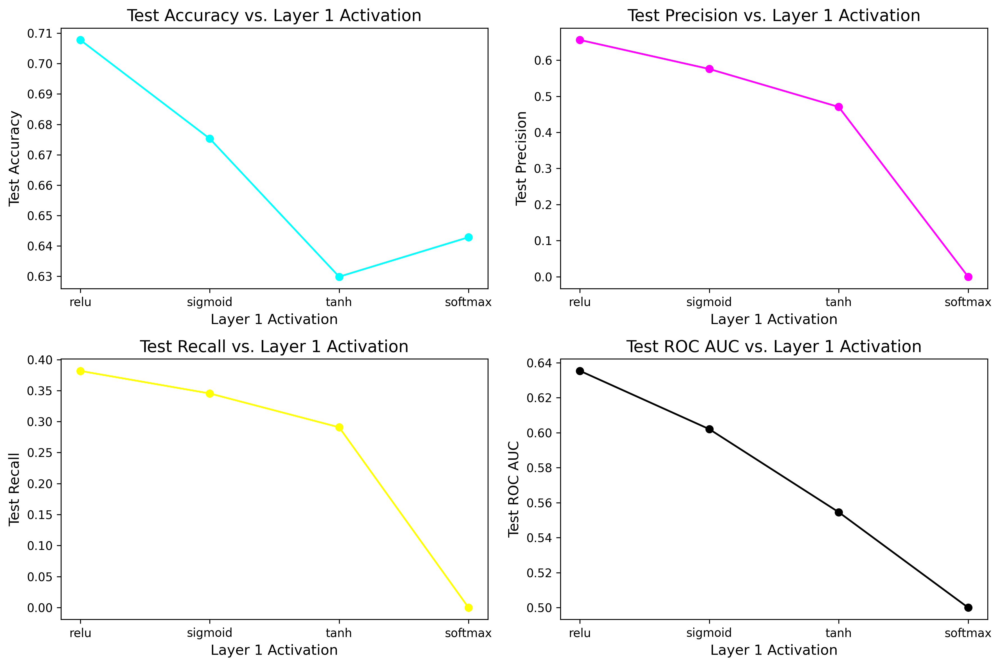

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# @title plots for varying activation function in layer 1

# --- Figure 1: Activation function in Layer 1 vs. Train Metrics ---
fig1, axes1 = plt.subplots(2, 2, figsize=(12, 8), dpi=300)  # High resolution
colors1 = ['blue', 'green', 'red', 'purple']

axes1[0, 0].plot(results_df['Layer 1 Activation'], results_df['Train Accuracy'], marker='o', color=colors1[0])
axes1[0, 0].set_title('Train Accuracy vs. Layer 1 Activation', fontsize=14)  # Increased font size
axes1[0, 0].set_xlabel('Layer 1 Activation', fontsize=12)
axes1[0, 0].set_ylabel('Train Accuracy', fontsize=12)

axes1[0, 1].plot(results_df['Layer 1 Activation'], results_df['Train Precision'], marker='o', color=colors1[1])
axes1[0, 1].set_title('Train Precision vs. Layer 1 Activation', fontsize=14)
axes1[0, 1].set_xlabel('Layer 1 Activation', fontsize=12)
axes1[0, 1].set_ylabel('Train Precision', fontsize=12)

axes1[1, 0].plot(results_df['Layer 1 Activation'], results_df['Train Recall'], marker='o', color=colors1[2])
axes1[1, 0].set_title('Train Recall vs. Layer 1 Activation', fontsize=14)
axes1[1, 0].set_xlabel('Layer 1 Activation', fontsize=12)
axes1[1, 0].set_ylabel('Train Recall', fontsize=12)

axes1[1, 1].plot(results_df['Layer 1 Activation'], results_df['Train ROC AUC'], marker='o', color=colors1[3])
axes1[1, 1].set_title('Train ROC AUC vs. Layer 1 Activation', fontsize=14)
axes1[1, 1].set_xlabel('Layer 1 Activation', fontsize=12)
axes1[1, 1].set_ylabel('Train ROC AUC', fontsize=12)

plt.tight_layout()
plt.savefig('Layer1_Activation_vs_train_metrics.png', dpi=300)  # Save before downloading
plt.show()

files.download('Layer1_Activation_vs_train_metrics.png')  # Download the figure



# --- Figure 2: Activation function in Layer 1 vs. Test Metrics ---
fig2, axes2 = plt.subplots(2, 2, figsize=(12, 8), dpi=300)
colors2 = ['cyan', 'magenta', 'yellow', 'black']

axes2[0, 0].plot(results_df['Layer 1 Activation'], results_df['Test Accuracy'], marker='o', color=colors2[0])
axes2[0, 0].set_title('Test Accuracy vs. Layer 1 Activation', fontsize=14)
axes2[0, 0].set_xlabel('Layer 1 Activation', fontsize=12)
axes2[0, 0].set_ylabel('Test Accuracy', fontsize=12)


axes2[0, 1].plot(results_df['Layer 1 Activation'], results_df['Test Precision'], marker='o', color=colors2[1])
axes2[0, 1].set_title('Test Precision vs. Layer 1 Activation', fontsize=14)
axes2[0, 1].set_xlabel('Layer 1 Activation', fontsize=12)
axes2[0, 1].set_ylabel('Test Precision', fontsize=12)

axes2[1, 0].plot(results_df['Layer 1 Activation'], results_df['Test Recall'], marker='o', color=colors2[2])
axes2[1, 0].set_title('Test Recall vs. Layer 1 Activation', fontsize=14)
axes2[1, 0].set_xlabel('Layer 1 Activation', fontsize=12)
axes2[1, 0].set_ylabel('Test Recall', fontsize=12)

axes2[1, 1].plot(results_df['Layer 1 Activation'], results_df['Test ROC AUC'], marker='o', color=colors2[3])
axes2[1, 1].set_title('Test ROC AUC vs. Layer 1 Activation', fontsize=14)
axes2[1, 1].set_xlabel('Layer 1 Activation', fontsize=12)
axes2[1, 1].set_ylabel('Test ROC AUC', fontsize=12)

plt.tight_layout()
plt.savefig('Layer1_Activation_vs_test_metrics.png', dpi=300)
plt.show()

files.download('Layer1_Activation_vs_test_metrics.png')

**Task-5**: Vary the activation function in Layer#2. Try the ones shown in the lecture. Document the results and identify the best cases. Try to intuitively justify the reason behind the best hyperparameter values.


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Training with Layer 1 Activation: relu and Layer 2 Activation: relu

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train Accuracy: 0.73, Precision: 0.60, Recall: 0.64, ROC AUC: 0.71


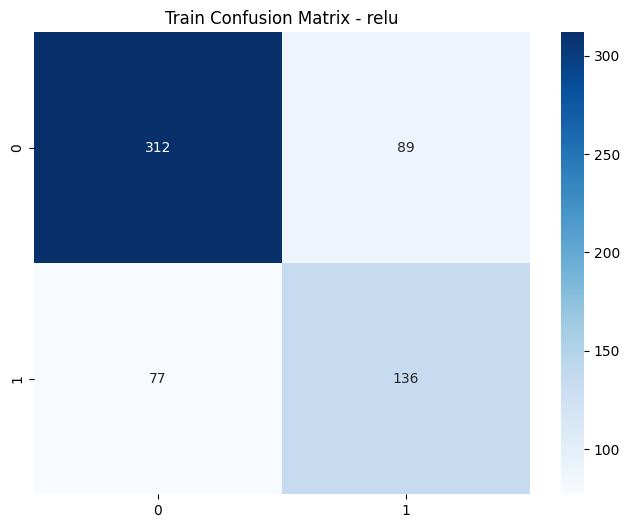

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Test Accuracy: 0.71, Precision: 0.59, Recall: 0.62, ROC AUC: 0.69


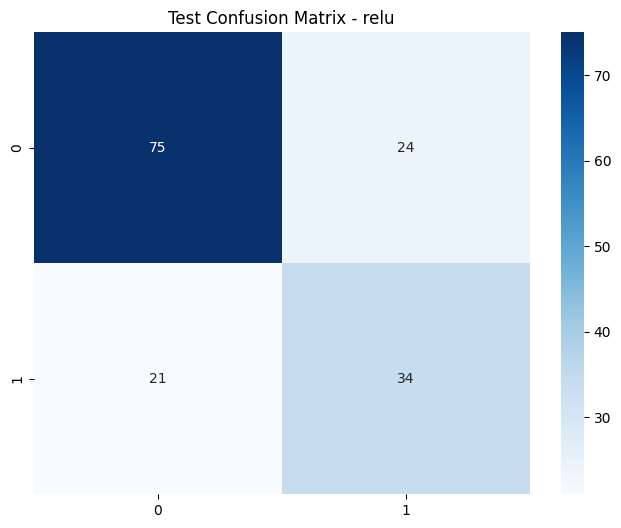

Training with Layer 1 Activation: relu and Layer 2 Activation: sigmoid



/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train Accuracy: 0.70, Precision: 0.77, Recall: 0.19, ROC AUC: 0.58


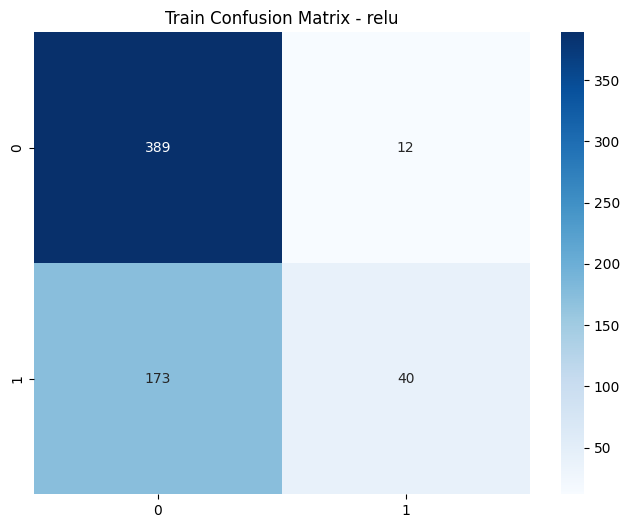

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Test Accuracy: 0.68, Precision: 0.69, Recall: 0.16, ROC AUC: 0.56


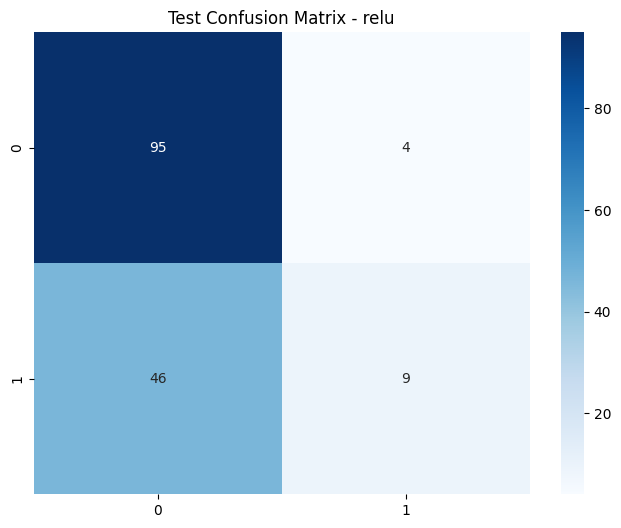

Training with Layer 1 Activation: relu and Layer 2 Activation: tanh



/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Train Accuracy: 0.73, Precision: 0.70, Recall: 0.38, ROC AUC: 0.65


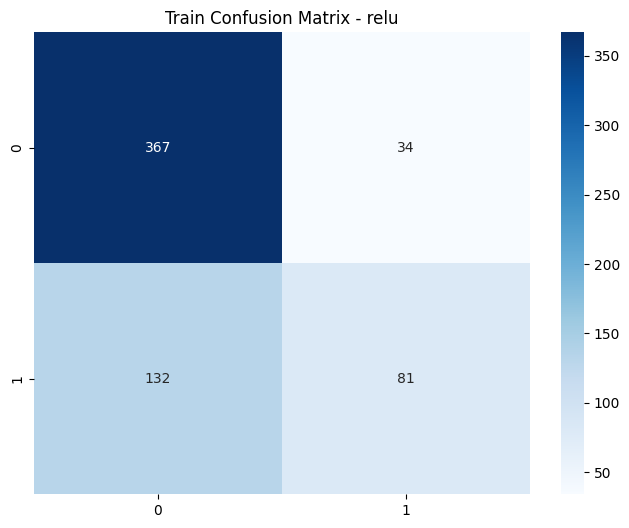

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Test Accuracy: 0.71, Precision: 0.67, Recall: 0.36, ROC AUC: 0.63


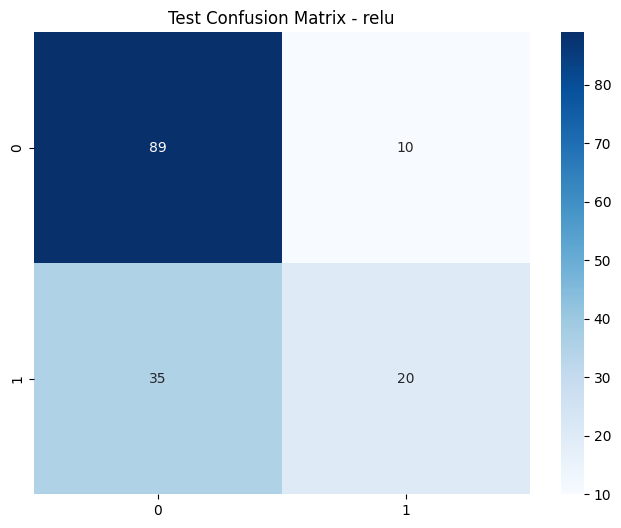

Training with Layer 1 Activation: relu and Layer 2 Activation: softmax



/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train Accuracy: 0.70, Precision: 0.63, Recall: 0.33, ROC AUC: 0.61


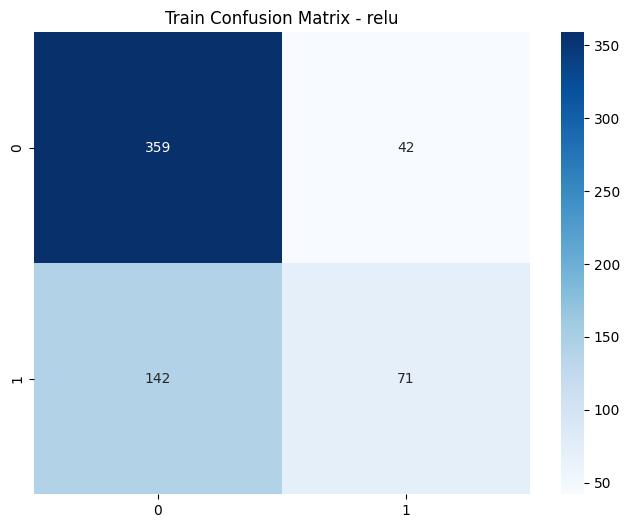

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Test Accuracy: 0.68, Precision: 0.64, Recall: 0.25, ROC AUC: 0.59


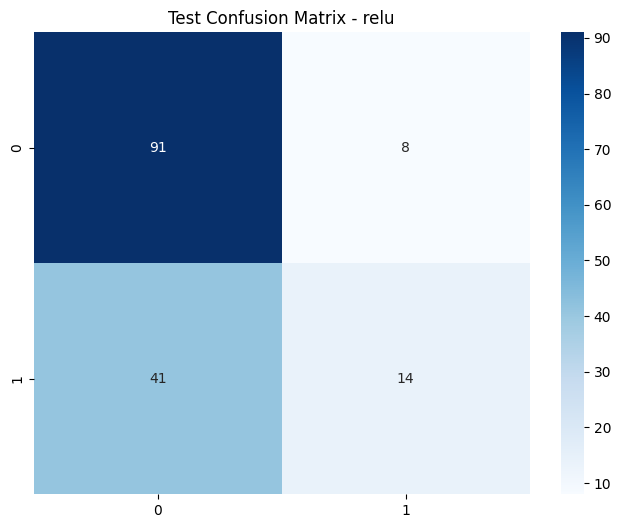

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  Layer 2 Activation  Train Accuracy       Train Conf Matrix  Train Precision  \
0               relu        0.729642  [[312, 89], [77, 136]]         0.604444   
1            sigmoid        0.698697  [[389, 12], [173, 40]]         0.769231   
2               tanh        0.729642  [[367, 34], [132, 81]]         0.704348   
3            softmax        0.700326  [[359, 42], [142, 71]]         0.628319   

   Train Recall  Train ROC AUC  Test Accuracy      Test Conf Matrix  \
0      0.638498       0.708276       0.707792  [[75, 24], [21, 34]]   
1      0.187793       0.578934       0.675325    [[95, 4], [46, 9]]   
2      0.380282       0.647747       0.707792  [[89, 10], [35, 20]]   
3      0.333333       0.614298       0.681818   [[91, 8], [41, 14]]   

   Test Precision  Test Recall  Test ROC AUC  
0        0.586207     0.618182      0.687879  
1        0.692308     0.163636      0.561616  
2        0.666667     0.363636      0.631313  
3        0.636364     0.254545      0.586869  


In [ ]:
# @title varying activation functions in layer 2

if __name__ == "__main__":
    X, y = load_data('pima-indians-diabetes.csv')
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    activation_functions = ['relu', 'sigmoid', 'tanh', 'softmax']
    results = []

    for act_fn in activation_functions:
        metrics = main_actv_fnc(X_train, y_train, X_test, y_test, layer1_actv_fnc='relu', layer2_actv_fnc=act_fn)
        results.append([act_fn] + list(metrics))

    results_df = pd.DataFrame(results, columns=['Layer 2 Activation', 'Train Accuracy', 'Train Conf Matrix', 'Train Precision', 'Train Recall', 'Train ROC AUC', 'Test Accuracy', 'Test Conf Matrix', 'Test Precision', 'Test Recall', 'Test ROC AUC'])
    results_df.to_csv('activation_function_layer2_results.csv', index=False)
    files.download('activation_function_layer2_results.csv')
    print(results_df)


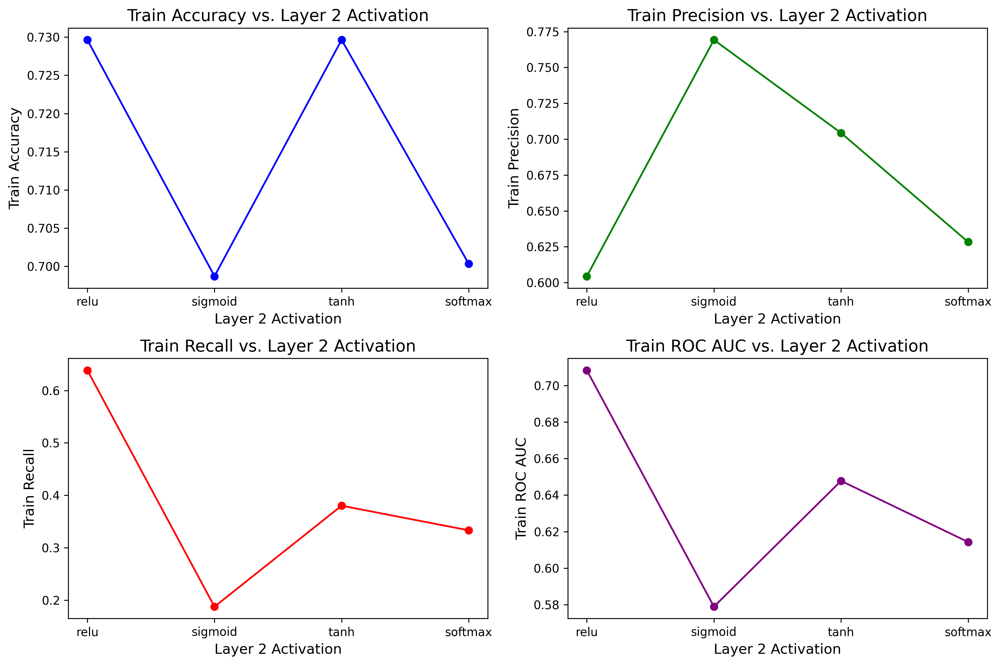

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

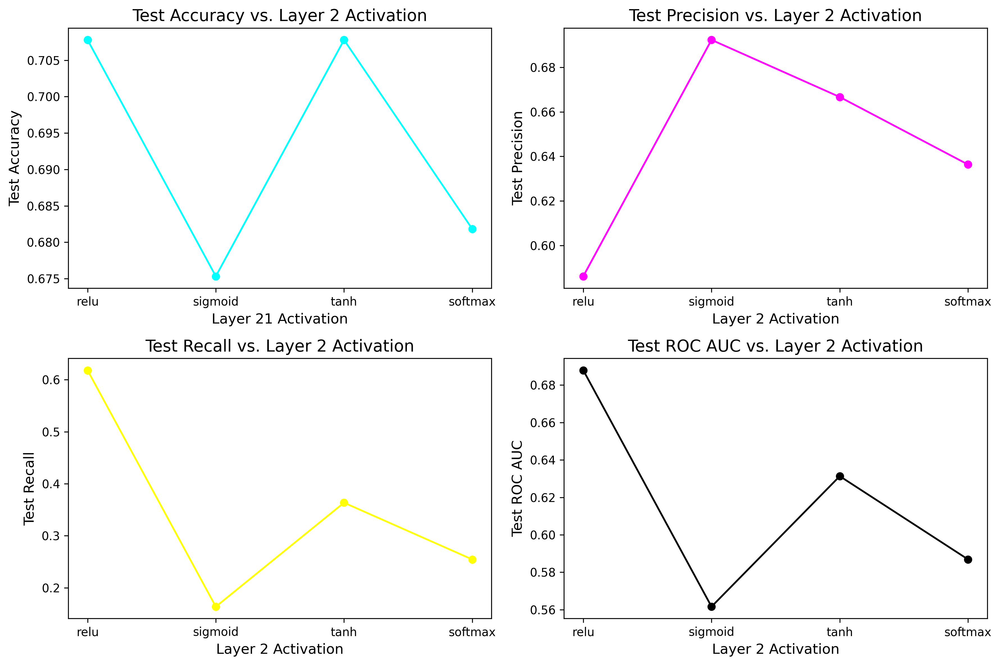

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# @title plots for varying activation function in layer 2

# --- Figure 1: Activation function in Layer 2 vs. Train Metrics ---
fig1, axes1 = plt.subplots(2, 2, figsize=(12, 8), dpi=300)  # High resolution
colors1 = ['blue', 'green', 'red', 'purple']

axes1[0, 0].plot(results_df['Layer 2 Activation'], results_df['Train Accuracy'], marker='o', color=colors1[0])
axes1[0, 0].set_title('Train Accuracy vs. Layer 2 Activation', fontsize=14)  # Increased font size
axes1[0, 0].set_xlabel('Layer 2 Activation', fontsize=12)
axes1[0, 0].set_ylabel('Train Accuracy', fontsize=12)

axes1[0, 1].plot(results_df['Layer 2 Activation'], results_df['Train Precision'], marker='o', color=colors1[1])
axes1[0, 1].set_title('Train Precision vs. Layer 2 Activation', fontsize=14)
axes1[0, 1].set_xlabel('Layer 2 Activation', fontsize=12)
axes1[0, 1].set_ylabel('Train Precision', fontsize=12)

axes1[1, 0].plot(results_df['Layer 2 Activation'], results_df['Train Recall'], marker='o', color=colors1[2])
axes1[1, 0].set_title('Train Recall vs. Layer 2 Activation', fontsize=14)
axes1[1, 0].set_xlabel('Layer 2 Activation', fontsize=12)
axes1[1, 0].set_ylabel('Train Recall', fontsize=12)

axes1[1, 1].plot(results_df['Layer 2 Activation'], results_df['Train ROC AUC'], marker='o', color=colors1[3])
axes1[1, 1].set_title('Train ROC AUC vs. Layer 2 Activation', fontsize=14)
axes1[1, 1].set_xlabel('Layer 2 Activation', fontsize=12)
axes1[1, 1].set_ylabel('Train ROC AUC', fontsize=12)

plt.tight_layout()
plt.savefig('Layer2_Activation_vs_train_metrics.png', dpi=300)  # Save before downloading
plt.show()

files.download('Layer2_Activation_vs_train_metrics.png')  # Download the figure



# --- Figure 2: Activation function in Layer 2 vs. Test Metrics ---
fig2, axes2 = plt.subplots(2, 2, figsize=(12, 8), dpi=300)
colors2 = ['cyan', 'magenta', 'yellow', 'black']

axes2[0, 0].plot(results_df['Layer 2 Activation'], results_df['Test Accuracy'], marker='o', color=colors2[0])
axes2[0, 0].set_title('Test Accuracy vs. Layer 2 Activation', fontsize=14)
axes2[0, 0].set_xlabel('Layer 21 Activation', fontsize=12)
axes2[0, 0].set_ylabel('Test Accuracy', fontsize=12)


axes2[0, 1].plot(results_df['Layer 2 Activation'], results_df['Test Precision'], marker='o', color=colors2[1])
axes2[0, 1].set_title('Test Precision vs. Layer 2 Activation', fontsize=14)
axes2[0, 1].set_xlabel('Layer 2 Activation', fontsize=12)
axes2[0, 1].set_ylabel('Test Precision', fontsize=12)

axes2[1, 0].plot(results_df['Layer 2 Activation'], results_df['Test Recall'], marker='o', color=colors2[2])
axes2[1, 0].set_title('Test Recall vs. Layer 2 Activation', fontsize=14)
axes2[1, 0].set_xlabel('Layer 2 Activation', fontsize=12)
axes2[1, 0].set_ylabel('Test Recall', fontsize=12)

axes2[1, 1].plot(results_df['Layer 2 Activation'], results_df['Test ROC AUC'], marker='o', color=colors2[3])
axes2[1, 1].set_title('Test ROC AUC vs. Layer 2 Activation', fontsize=14)
axes2[1, 1].set_xlabel('Layer 2 Activation', fontsize=12)
axes2[1, 1].set_ylabel('Test ROC AUC', fontsize=12)

plt.tight_layout()
plt.savefig('Layer2_Activation_vs_test_metrics.png', dpi=300)
plt.show()

files.download('Layer2_Activation_vs_test_metrics.png')

**Task-6**: Vary the number of hidden layers (Hidden: All the layers *excluding* the Input and Output layers). Try values in the range [1,4]. Document the results and identify the best cases. Try to intuitively justify the reason behind the best hyperparameter values.


In [ ]:
# @title new classifier for different hidden layer additions
# from tensorflow.keras.layers import InputLayer

class DiabetesClassifier_layer:
    def __init__(self, input_shape=(8,), n_layer1=12, n_layer2=8, actv_fnc='relu', hidden_layers=2):  # hidden_layers added
        self.model = Sequential()
        self.model.add(Dense(n_layer1, input_shape=input_shape, activation=actv_fnc))
        # self.model.add(InputLayer(input_shape=input_shape))  # Explicit Input Layer

        print('############################################\n\n\n\n')

        print(hidden_layers)

        print('############################################\n\n\n\n')

        if hidden_layers >= 1:
            self.model.add(Dense(n_layer1, activation=actv_fnc))
        if hidden_layers >= 2:
            self.model.add(Dense(n_layer2, activation=actv_fnc))
        if hidden_layers >= 3:
            self.model.add(Dense(8, activation=actv_fnc)) # You can adjust the number of neurons and activation as needed
        if hidden_layers >= 4:
            self.model.add(Dense(4, activation=actv_fnc)) # You can adjust the number of neurons and activation as needed

        self.model.add(Dense(1, activation='sigmoid'))  # Output Layer
        self.model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    def train(self, X_train, y_train, epochs=150, batch_size=10):
        history = self.model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)
        return history

    def evaluate(self, X_test, y_test):
        _, accuracy = self.model.evaluate(X_test, y_test, verbose=0)
        predictions = (self.model.predict(X_test) > 0.5).astype(int)
        conf_matrix = confusion_matrix(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)
        return accuracy, conf_matrix, precision, recall, roc_auc

preprocessing Train Set Data....


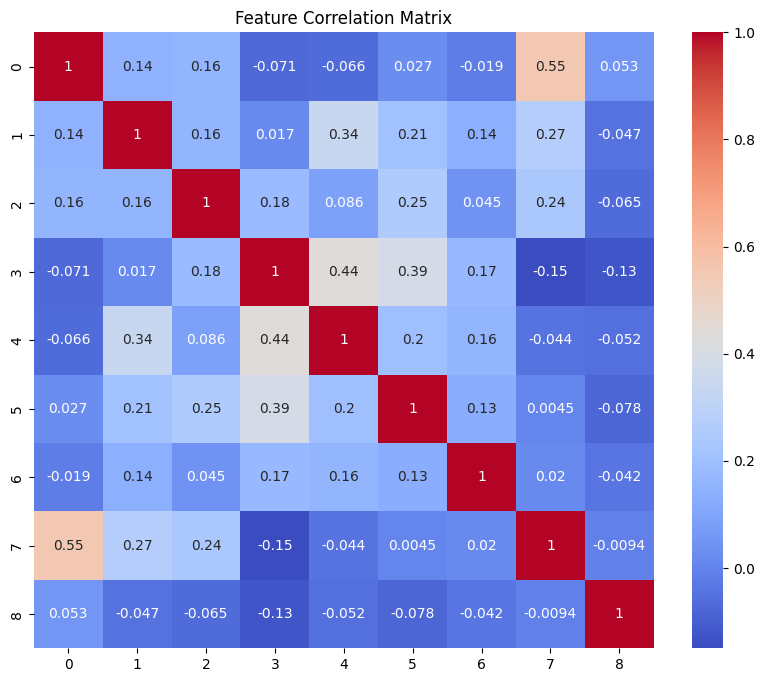

preprocessing Test Set Data....


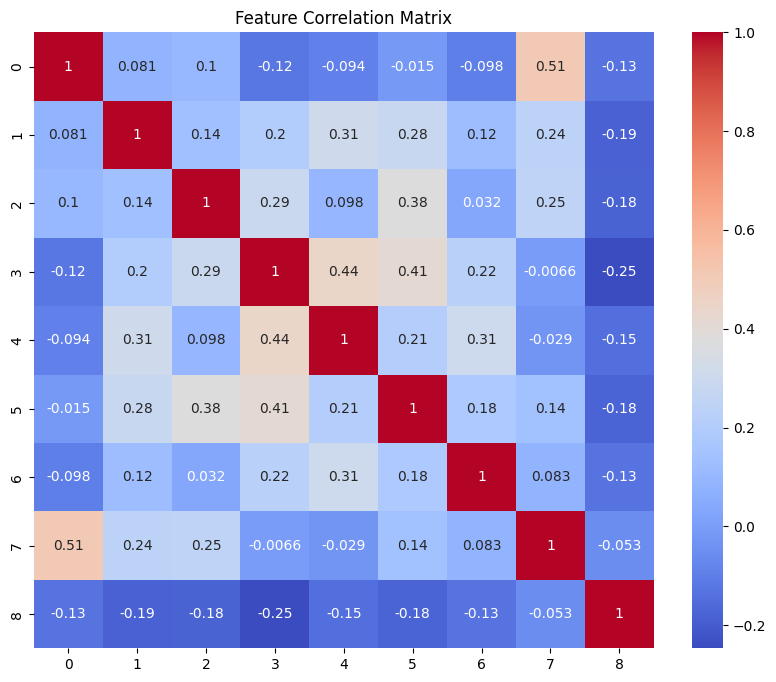

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


############################################




1
############################################




20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train Accuracy: 0.85, Precision: 0.80, Recall: 0.77, ROC AUC: 0.83


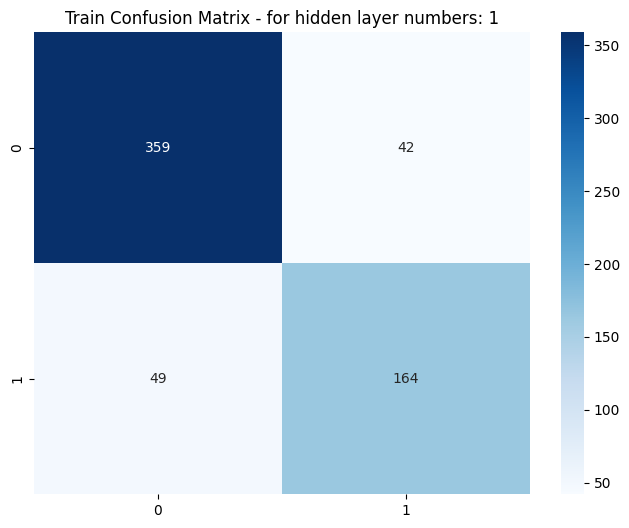

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Test Accuracy: 0.74, Precision: 0.63, Recall: 0.65, ROC AUC: 0.72


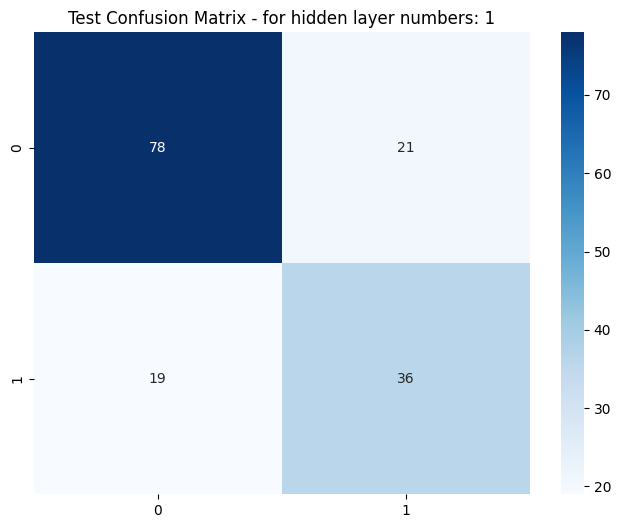

preprocessing Train Set Data....


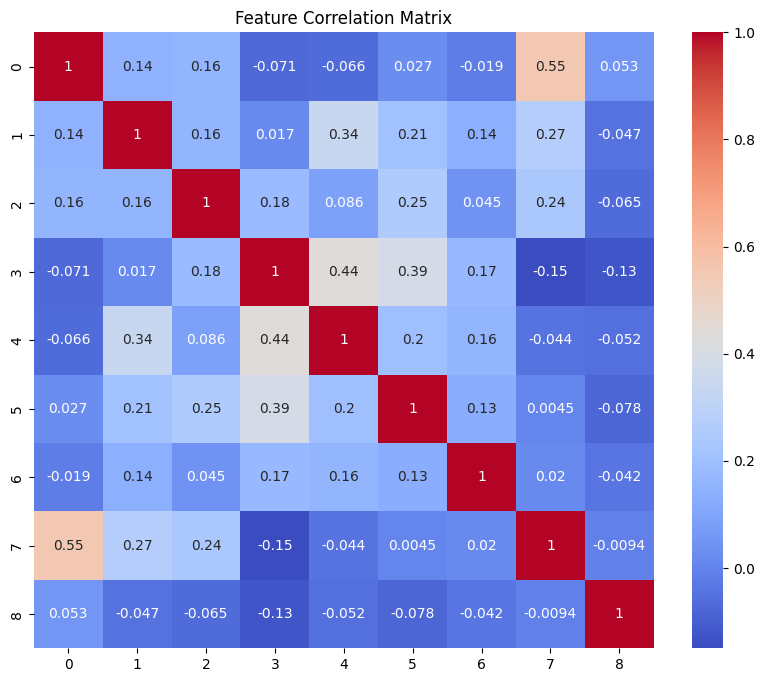

preprocessing Test Set Data....


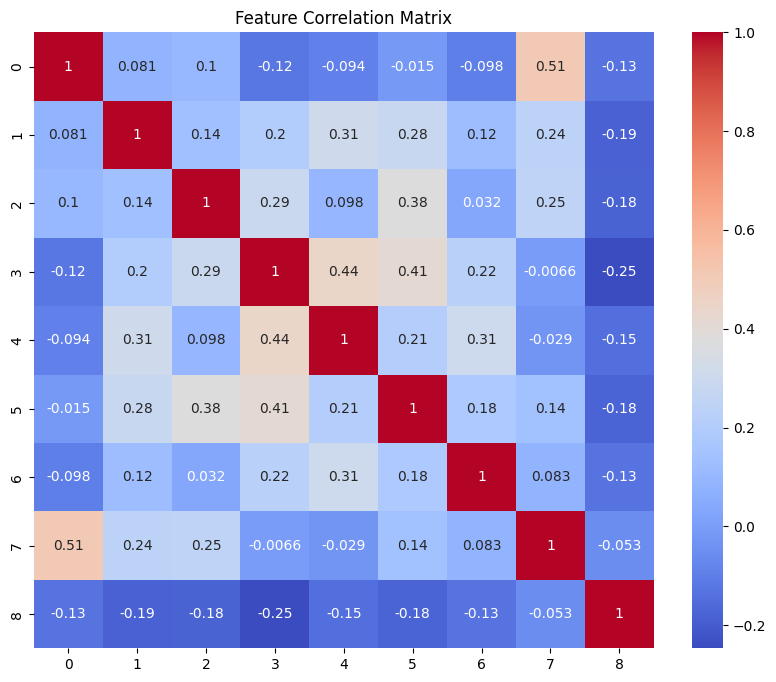

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


############################################




2
############################################




20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Train Accuracy: 0.89, Precision: 0.85, Recall: 0.85, ROC AUC: 0.88


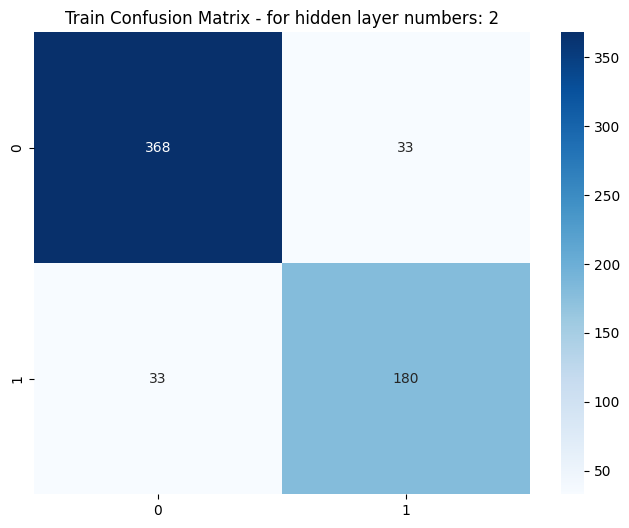

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Test Accuracy: 0.75, Precision: 0.65, Recall: 0.62, ROC AUC: 0.72


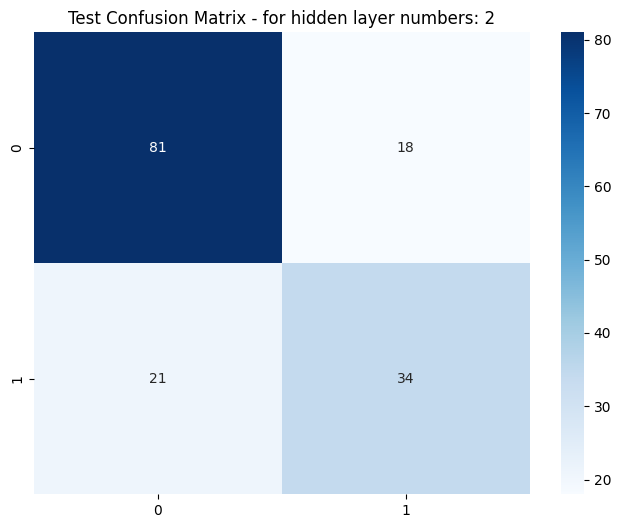

preprocessing Train Set Data....


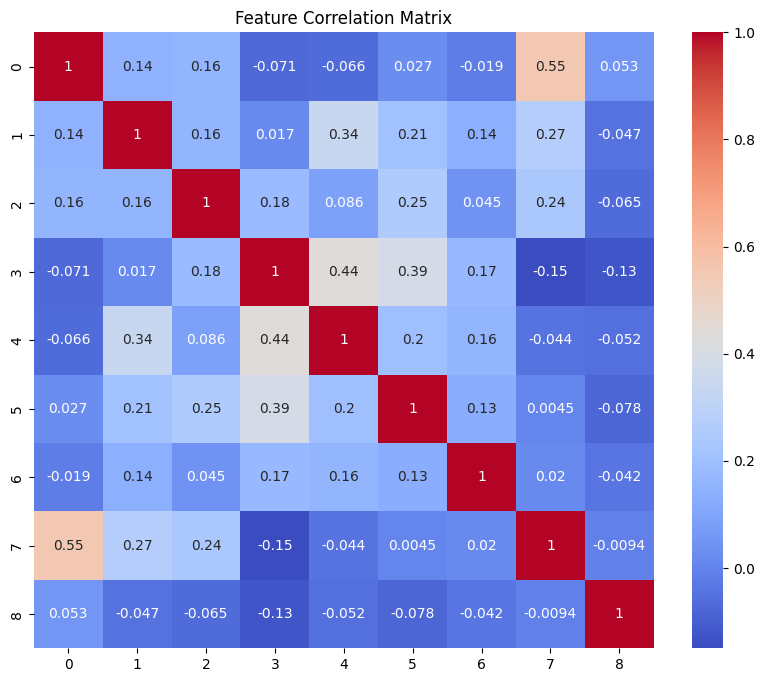

preprocessing Test Set Data....


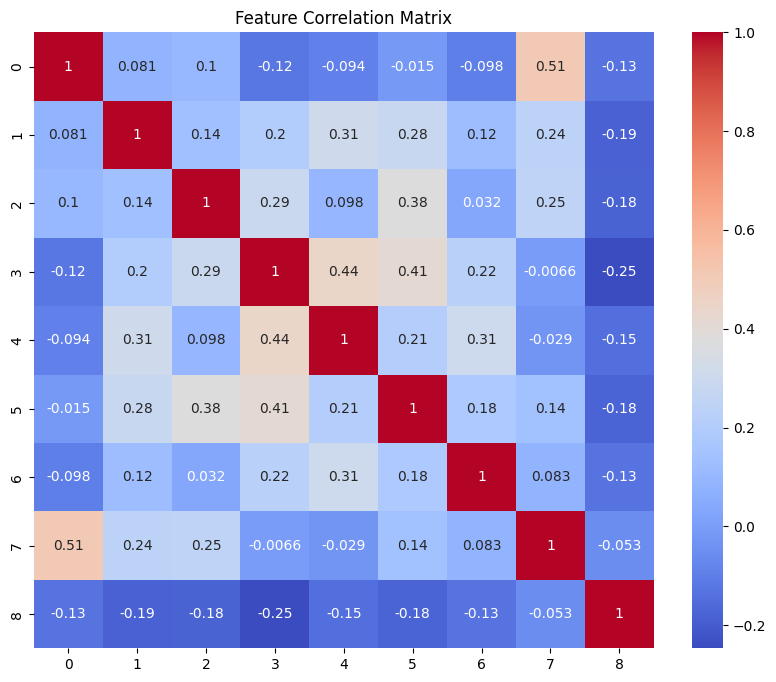

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


############################################




3
############################################




20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Train Accuracy: 0.94, Precision: 0.88, Recall: 0.95, ROC AUC: 0.94


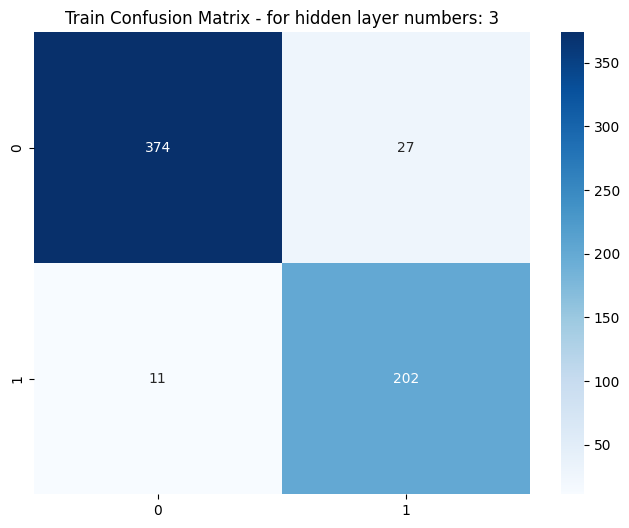

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Test Accuracy: 0.73, Precision: 0.61, Recall: 0.69, ROC AUC: 0.72


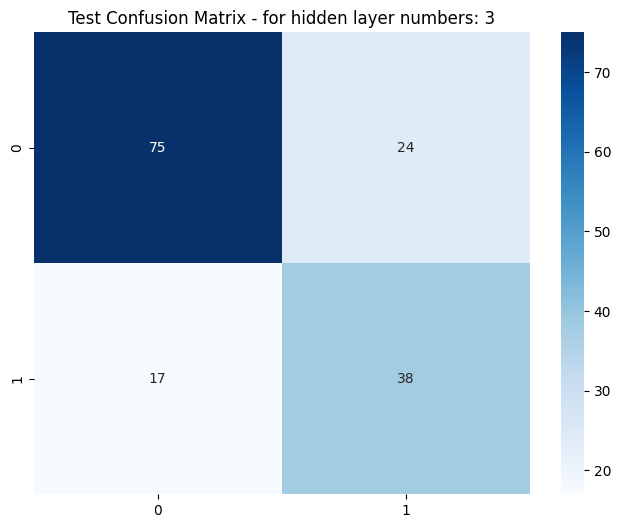

preprocessing Train Set Data....


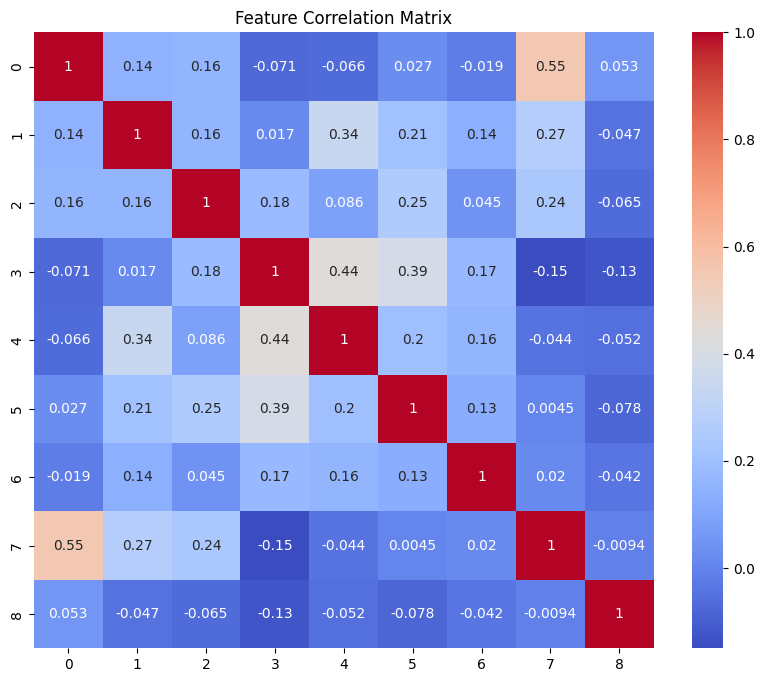

preprocessing Test Set Data....


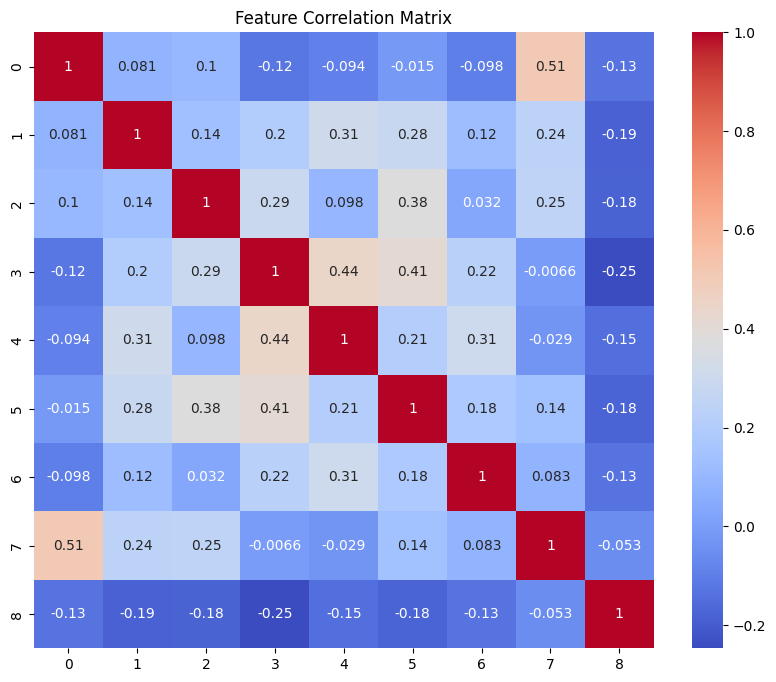

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


############################################




4
############################################




20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Train Accuracy: 0.93, Precision: 0.85, Recall: 0.98, ROC AUC: 0.94


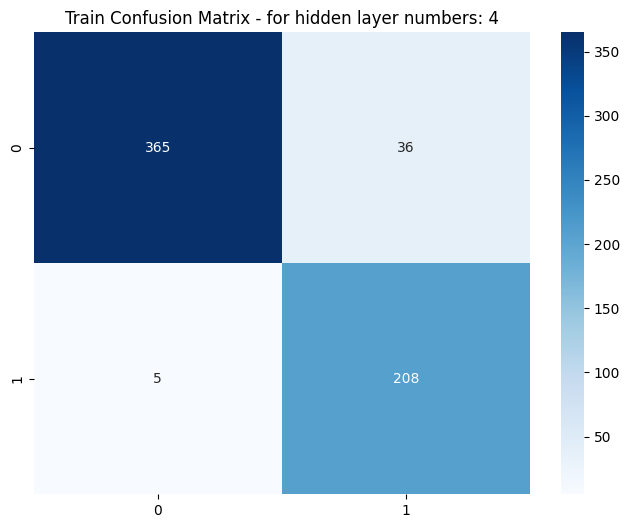

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Test Accuracy: 0.69, Precision: 0.56, Recall: 0.67, ROC AUC: 0.69


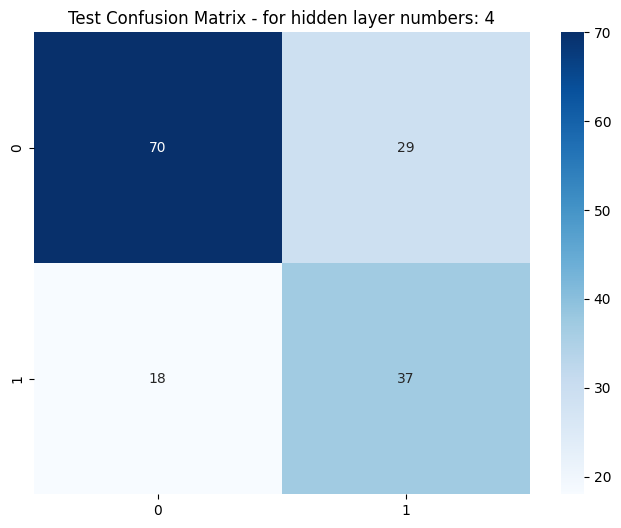

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

   hidden_layers  Train Accuracy       Train_conf_matrix  Train Precision  \
0              1        0.851792  [[359, 42], [49, 164]]         0.796117   
1              2        0.892508  [[368, 33], [33, 180]]         0.845070   
2              3        0.938111  [[374, 27], [11, 202]]         0.882096   
3              4        0.933225   [[365, 36], [5, 208]]         0.852459   

   Train Recall  Train ROC AUC  Test Accuracy      Test_conf_matrix  \
0      0.769953       0.832607       0.740260  [[78, 21], [19, 36]]   
1      0.845070       0.881388       0.746753  [[81, 18], [21, 34]]   
2      0.948357       0.940513       0.733766  [[75, 24], [17, 38]]   
3      0.976526       0.943375       0.694805  [[70, 29], [18, 37]]   

   Test Precision  Test Recall  Test ROC AUC  
0        0.631579     0.654545      0.721212  
1        0.653846     0.618182      0.718182  
2        0.612903     0.690909      0.724242  
3        0.560606     0.672727      0.689899  


In [ ]:
# @title varying hidden layers

def main_hid_layer(X_train, y_train, X_test, y_test, preprocess=False, epochs=150, hidden_layers=2, batch_size=10):

    if preprocess:
        print(f"preprocessing Train Set Data....")
        train_preprocessor = DataPreprocessor()
        X_train = train_preprocessor.preprocess(X_train)
        train_preprocessor.plot_correlation(pd.concat([X_train, y_train], axis=1))

        print(f"preprocessing Test Set Data....")
        test_preprocessor = DataPreprocessor()
        X_test = test_preprocessor.preprocess(X_test)
        test_preprocessor.plot_correlation(pd.concat([X_test, y_test], axis=1))


    classifier = DiabetesClassifier_layer(hidden_layers = hidden_layers)

    history = classifier.train(X_train, y_train, epochs=epochs, batch_size=batch_size)

    # Train evaluation
    train_metrics = classifier.evaluate(X_train, y_train)
    print(f"Train Accuracy: {train_metrics[0]:.2f}, Precision: {train_metrics[2]:.2f}, Recall: {train_metrics[3]:.2f}, ROC AUC: {train_metrics[4]:.2f}")

    plt.figure(figsize=(8, 6))
    sns.heatmap(train_metrics[1], annot=True, fmt='d', cmap='Blues')
    plt.title(f'Train Confusion Matrix - for hidden layer numbers: {hidden_layers}')
    plt.show()

    # Test evaluation
    test_metrics = classifier.evaluate(X_test, y_test)
    print(f"Test Accuracy: {test_metrics[0]:.2f}, Precision: {test_metrics[2]:.2f}, Recall: {test_metrics[3]:.2f}, ROC AUC: {test_metrics[4]:.2f}")

    plt.figure(figsize=(8, 6))
    sns.heatmap(test_metrics[1], annot=True, fmt='d', cmap='Blues')
    plt.title(f'Test Confusion Matrix - for hidden layer numbers: {hidden_layers}')
    plt.show()

    return train_metrics + test_metrics


if __name__ == "__main__":
    X, y = load_data('pima-indians-diabetes.csv')
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    results = []
    hidden_layers = [1, 2, 3, 4]
    for hidden_layer in hidden_layers:
      metrics = main_hid_layer(X_train, y_train, X_test, y_test, preprocess =True, epochs=200, hidden_layers=hidden_layer,  batch_size=15)
      results.append([hidden_layer] + list(metrics))

    results_df = pd.DataFrame(results, columns=['hidden_layers',  'Train Accuracy', 'Train_conf_matrix', 'Train Precision', 'Train Recall', 'Train ROC AUC', 'Test Accuracy', 'Test_conf_matrix', 'Test Precision', 'Test Recall', 'Test ROC AUC'])
    results_df.to_csv('hidden_layers_vary_results.csv', index=False)
    files.download('hidden_layers_vary_results.csv')
    print(results_df)

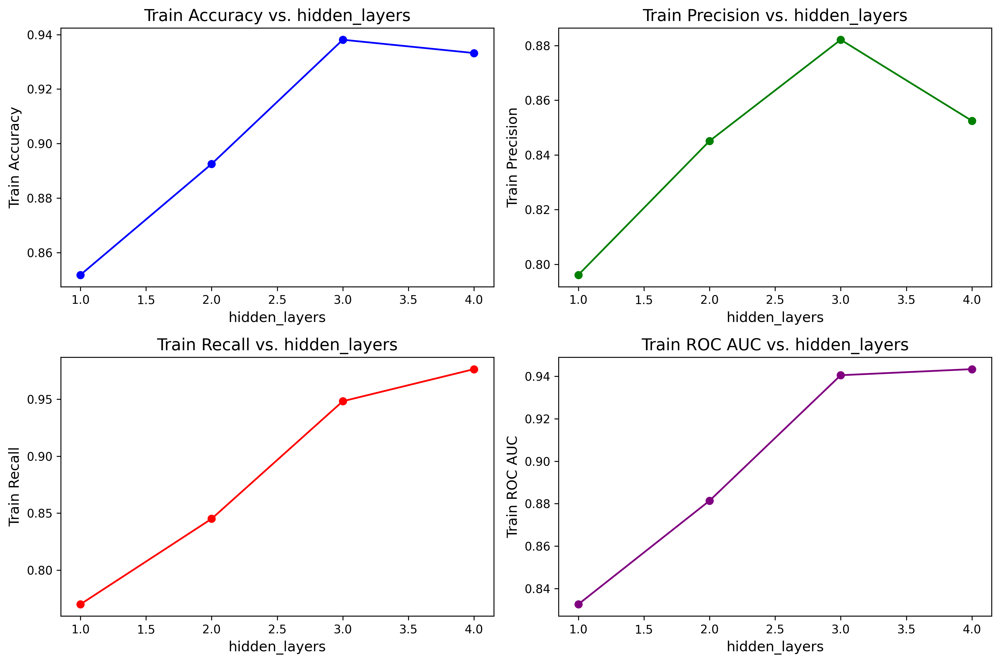

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

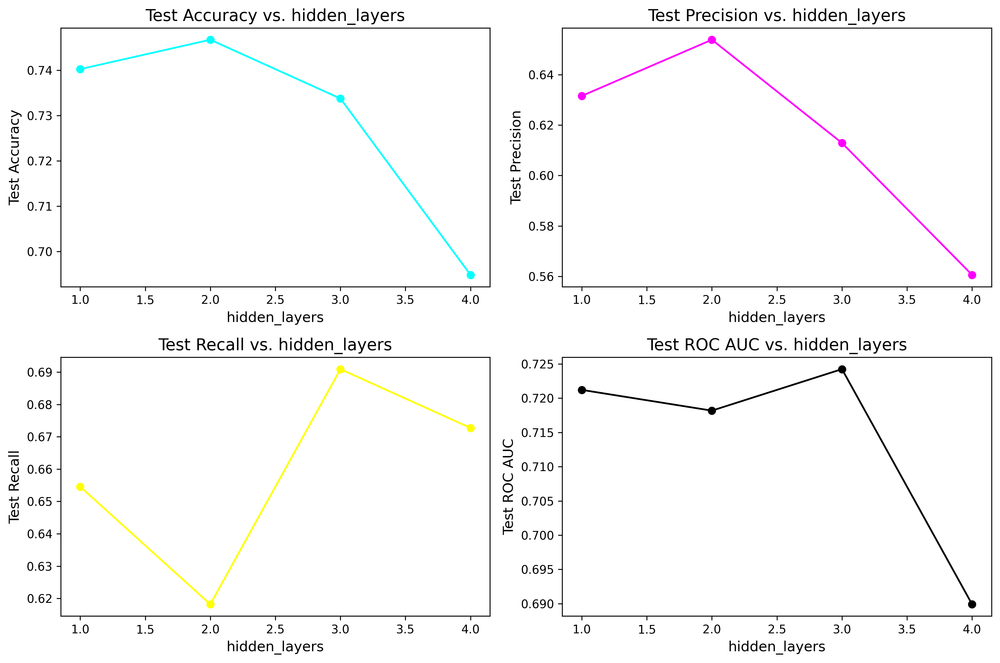

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# @title plots for varying hidden_layer

# --- Figure 1: hidden_layers vs. Train Metrics ---
fig1, axes1 = plt.subplots(2, 2, figsize=(12, 8), dpi=300)
colors1 = ['blue', 'green', 'red', 'purple']

axes1[0, 0].plot(results_df['hidden_layers'], results_df['Train Accuracy'], marker='o', color=colors1[0])
axes1[0, 0].set_title('Train Accuracy vs. hidden_layers', fontsize=14)
axes1[0, 0].set_xlabel('hidden_layers', fontsize=12)
axes1[0, 0].set_ylabel('Train Accuracy', fontsize=12)

axes1[0, 1].plot(results_df['hidden_layers'], results_df['Train Precision'], marker='o', color=colors1[1])
axes1[0, 1].set_title('Train Precision vs. hidden_layers', fontsize=14)
axes1[0, 1].set_xlabel('hidden_layers', fontsize=12)
axes1[0, 1].set_ylabel('Train Precision', fontsize=12)

axes1[1, 0].plot(results_df['hidden_layers'], results_df['Train Recall'], marker='o', color=colors1[2])
axes1[1, 0].set_title('Train Recall vs. hidden_layers', fontsize=14)
axes1[1, 0].set_xlabel('hidden_layers', fontsize=12)
axes1[1, 0].set_ylabel('Train Recall', fontsize=12)

axes1[1, 1].plot(results_df['hidden_layers'], results_df['Train ROC AUC'], marker='o', color=colors1[3])
axes1[1, 1].set_title('Train ROC AUC vs. hidden_layers', fontsize=14)
axes1[1, 1].set_xlabel('hidden_layers', fontsize=12)
axes1[1, 1].set_ylabel('Train ROC AUC', fontsize=12)

plt.tight_layout()
plt.savefig('hidden_layers_vs_train_metrics.png', dpi=300)
plt.show()

files.download('hidden_layers_vs_train_metrics.png')



# --- Figure 2: hidden_layers vs. Test Metrics ---
fig2, axes2 = plt.subplots(2, 2, figsize=(12, 8), dpi=300)
colors2 = ['cyan', 'magenta', 'yellow', 'black']

axes2[0, 0].plot(results_df['hidden_layers'], results_df['Test Accuracy'], marker='o', color=colors2[0])
axes2[0, 0].set_title('Test Accuracy vs. hidden_layers', fontsize=14)
axes2[0, 0].set_xlabel('hidden_layers', fontsize=12)
axes2[0, 0].set_ylabel('Test Accuracy', fontsize=12)


axes2[0, 1].plot(results_df['hidden_layers'], results_df['Test Precision'], marker='o', color=colors2[1])
axes2[0, 1].set_title('Test Precision vs. hidden_layers', fontsize=14)
axes2[0, 1].set_xlabel('hidden_layers', fontsize=12)
axes2[0, 1].set_ylabel('Test Precision', fontsize=12)

axes2[1, 0].plot(results_df['hidden_layers'], results_df['Test Recall'], marker='o', color=colors2[2])
axes2[1, 0].set_title('Test Recall vs. hidden_layers', fontsize=14)
axes2[1, 0].set_xlabel('hidden_layers', fontsize=12)
axes2[1, 0].set_ylabel('Test Recall', fontsize=12)

axes2[1, 1].plot(results_df['hidden_layers'], results_df['Test ROC AUC'], marker='o', color=colors2[3])
axes2[1, 1].set_title('Test ROC AUC vs. hidden_layers', fontsize=14)
axes2[1, 1].set_xlabel('hidden_layers', fontsize=12)
axes2[1, 1].set_ylabel('Test ROC AUC', fontsize=12)

plt.tight_layout()
plt.savefig('hidden_layers_vs_test_metrics.png', dpi=300)
plt.show()

files.download('hidden_layers_vs_test_metrics.png')

**Task-7**: Vary the number of training epochs. Try values in the range [50, 75, 100, 125, 150, 175, 200, 225, 250]. Document the results and identify the best cases. Try to intuitively justify the reason behind the best hyperparameter values.

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train Accuracy: 0.75, Precision: 0.64, Recall: 0.60, ROC AUC: 0.71


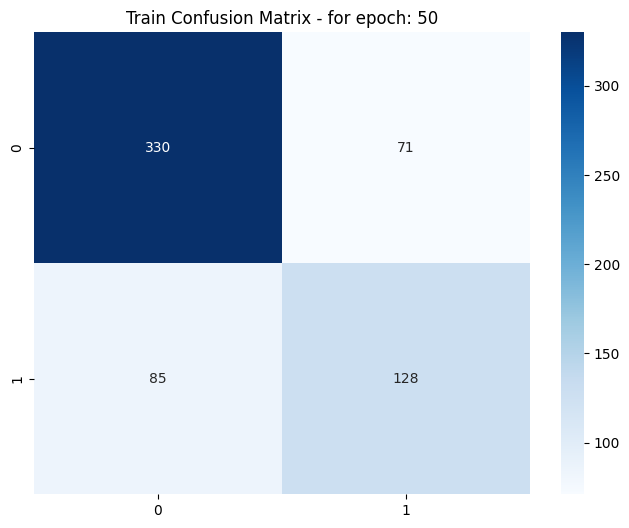

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Test Accuracy: 0.72, Precision: 0.60, Recall: 0.64, ROC AUC: 0.70


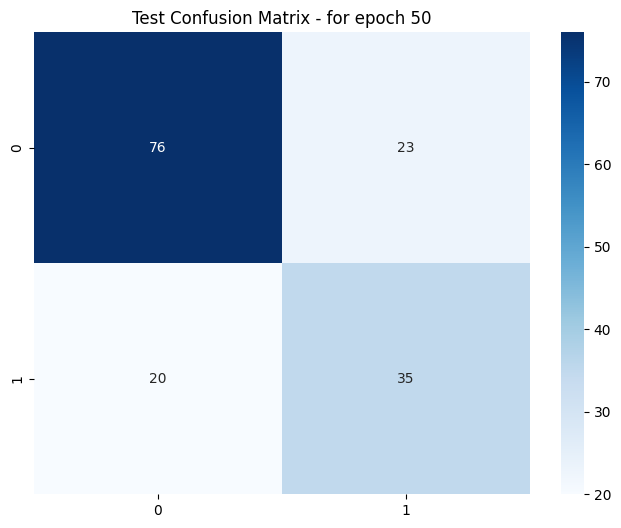

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train Accuracy: 0.76, Precision: 0.71, Recall: 0.54, ROC AUC: 0.71


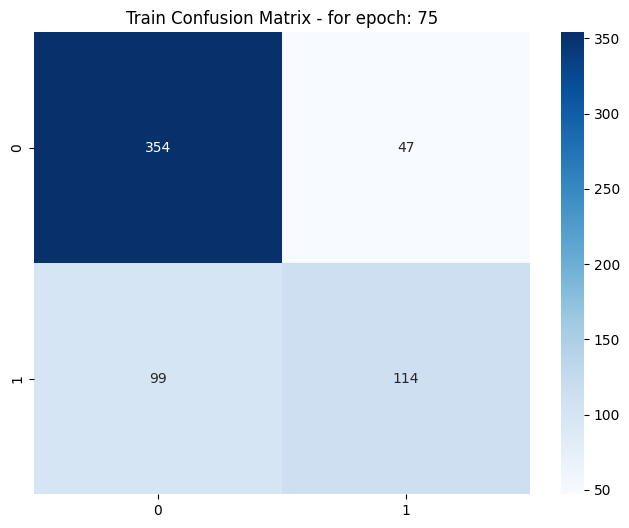

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Test Accuracy: 0.77, Precision: 0.70, Recall: 0.60, ROC AUC: 0.73


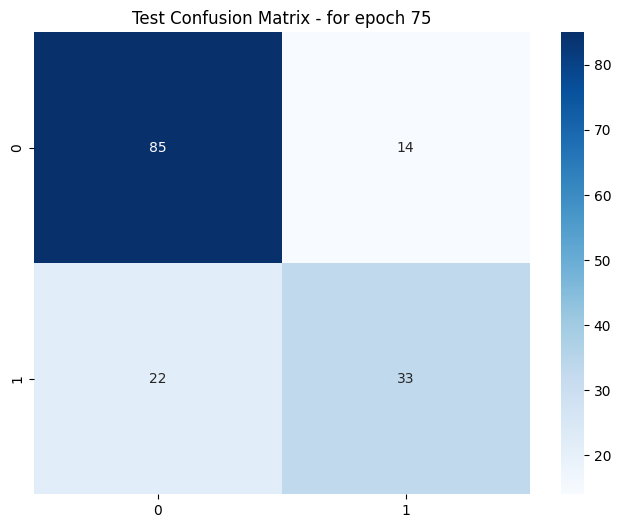

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train Accuracy: 0.74, Precision: 0.72, Recall: 0.43, ROC AUC: 0.67


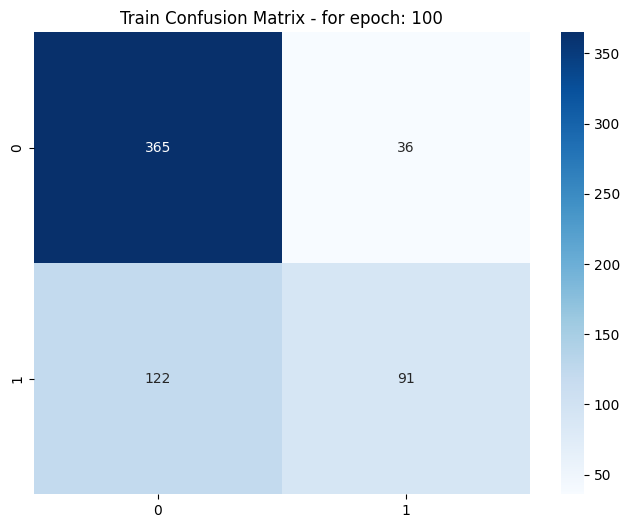

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Test Accuracy: 0.73, Precision: 0.71, Recall: 0.44, ROC AUC: 0.67


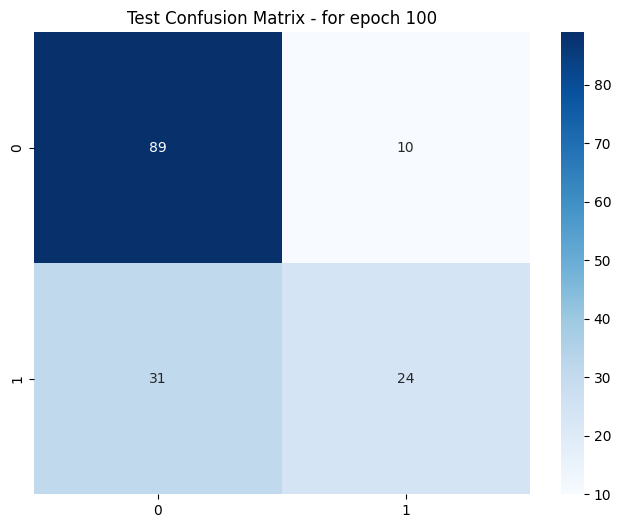

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train Accuracy: 0.76, Precision: 0.66, Recall: 0.64, ROC AUC: 0.73


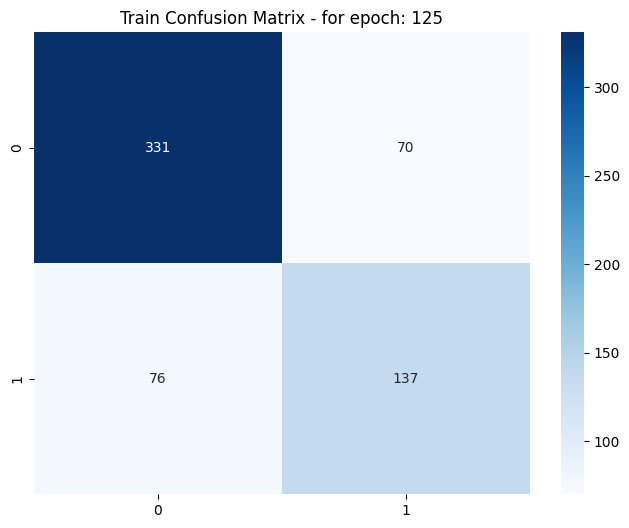

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Test Accuracy: 0.75, Precision: 0.65, Recall: 0.65, ROC AUC: 0.73


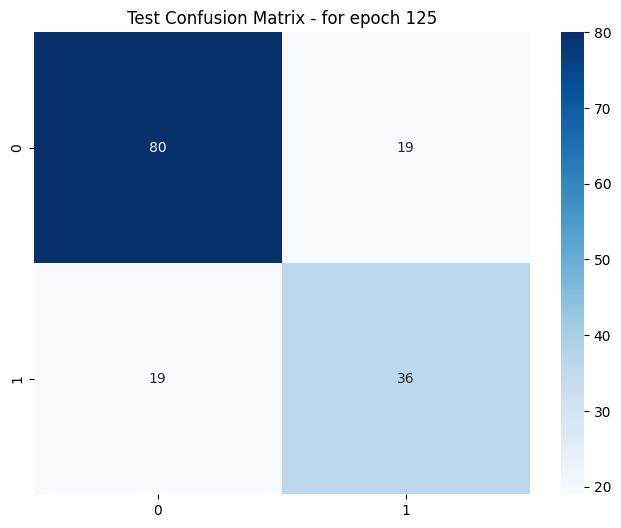

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Train Accuracy: 0.77, Precision: 0.72, Recall: 0.57, ROC AUC: 0.72


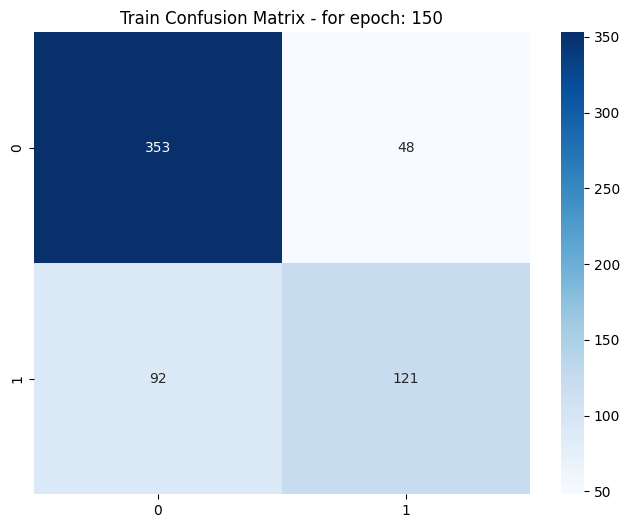

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
Test Accuracy: 0.75, Precision: 0.69, Recall: 0.53, ROC AUC: 0.70


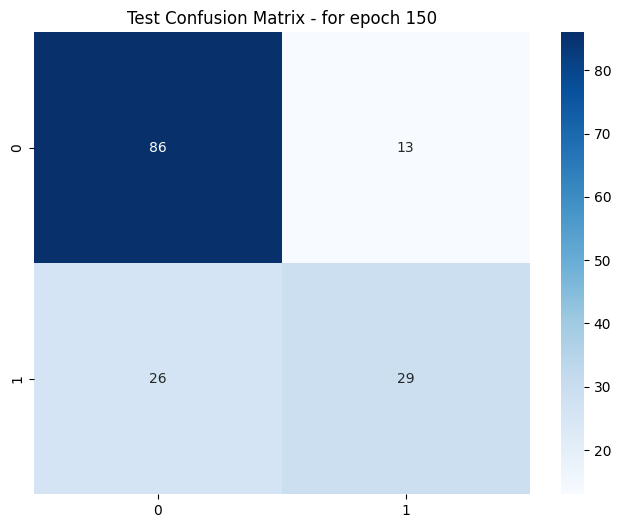

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train Accuracy: 0.78, Precision: 0.74, Recall: 0.57, ROC AUC: 0.73


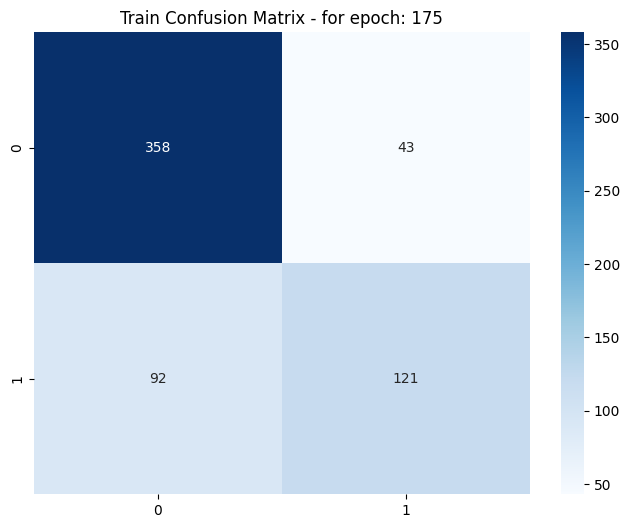

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Test Accuracy: 0.79, Precision: 0.74, Recall: 0.64, ROC AUC: 0.76


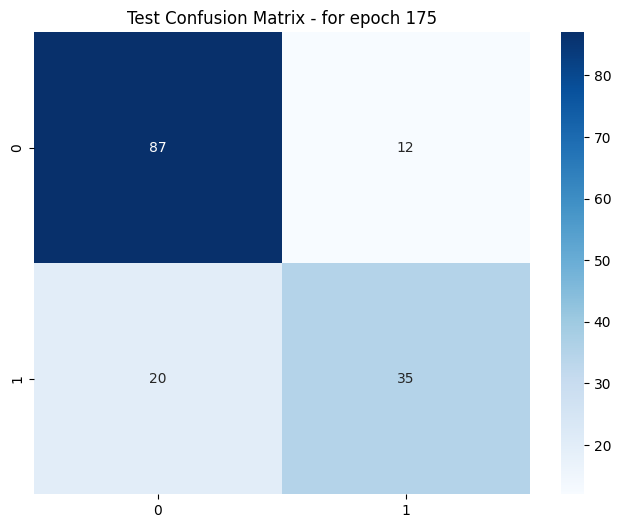

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train Accuracy: 0.79, Precision: 0.67, Recall: 0.77, ROC AUC: 0.78


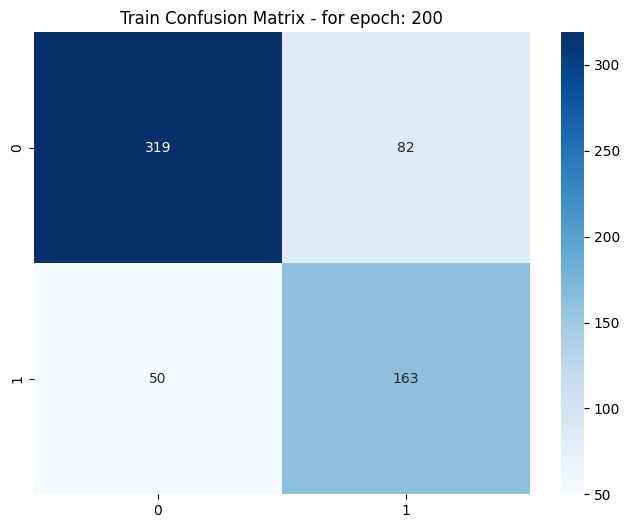

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
Test Accuracy: 0.70, Precision: 0.57, Recall: 0.71, ROC AUC: 0.70


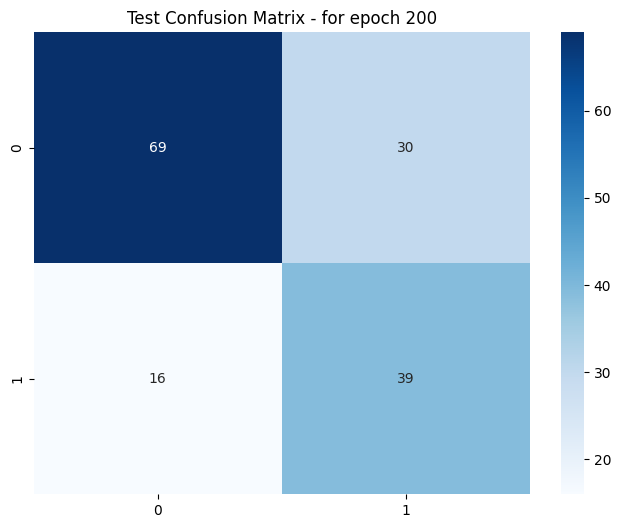

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Train Accuracy: 0.77, Precision: 0.79, Recall: 0.47, ROC AUC: 0.70


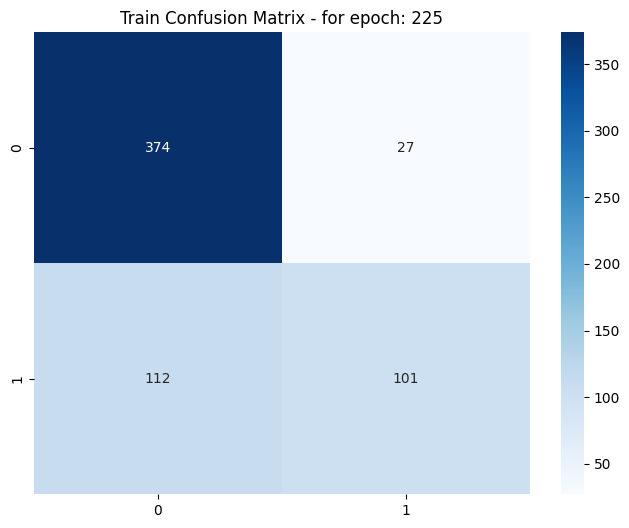

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Test Accuracy: 0.75, Precision: 0.72, Recall: 0.51, ROC AUC: 0.70


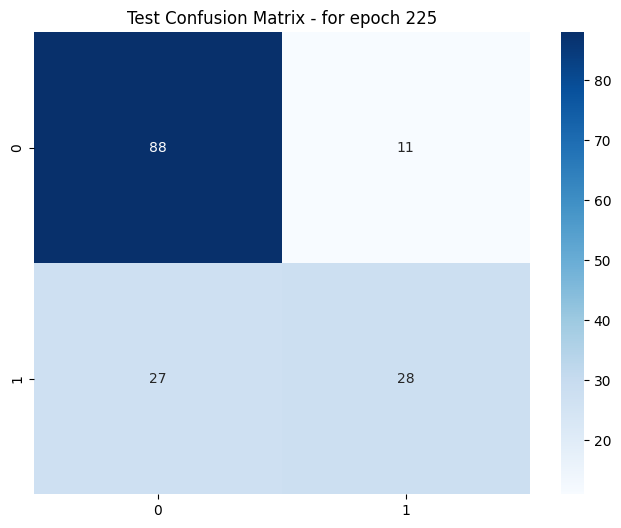

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Train Accuracy: 0.77, Precision: 0.82, Recall: 0.44, ROC AUC: 0.70


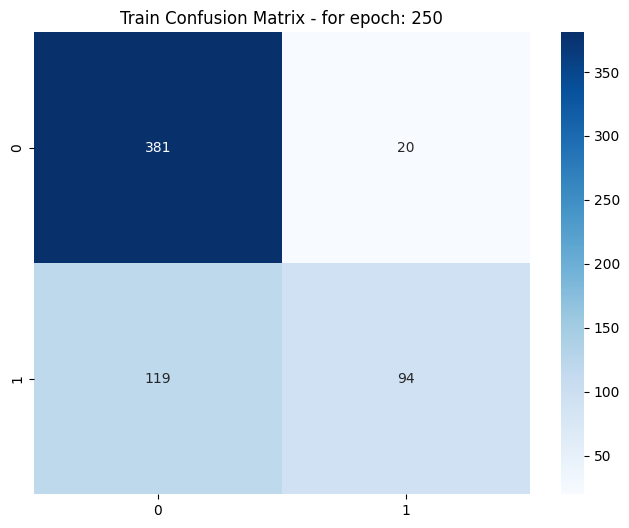

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
Test Accuracy: 0.74, Precision: 0.68, Recall: 0.51, ROC AUC: 0.69


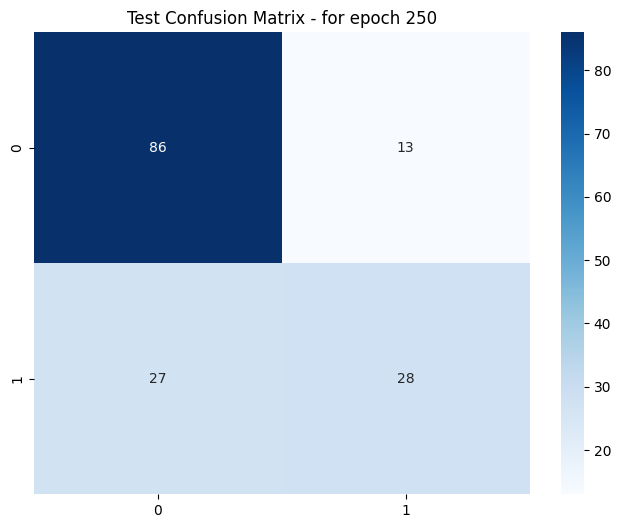

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

   no. of epochs  Train Accuracy        Train Conf Matrix  Train Precision  \
0             50        0.745928   [[330, 71], [85, 128]]         0.643216   
1             75        0.762215   [[354, 47], [99, 114]]         0.708075   
2            100        0.742671   [[365, 36], [122, 91]]         0.716535   
3            125        0.762215   [[331, 70], [76, 137]]         0.661836   
4            150        0.771987   [[353, 48], [92, 121]]         0.715976   
5            175        0.780130   [[358, 43], [92, 121]]         0.737805   
6            200        0.785016   [[319, 82], [50, 163]]         0.665306   
7            225        0.773616  [[374, 27], [112, 101]]         0.789062   
8            250        0.773616   [[381, 20], [119, 94]]         0.824561   

   Train Recall  Train ROC AUC  Test Accuracy      Test Conf Matrix  \
0      0.600939       0.711941       0.720779  [[76, 23], [20, 35]]   
1      0.535211       0.709002       0.766234  [[85, 14], [22, 33]]   
2     

In [ ]:
#@title varying epochs..


def main_epoch(X_train, y_train, X_test, y_test, preprocess=False, epochs=150, batch_size=10):

    if preprocess:
        print(f"preprocessing Train Set Data....")
        train_preprocessor = DataPreprocessor()
        X_train = train_preprocessor.preprocess(X_train)
        train_preprocessor.plot_correlation(pd.concat([X_train, y_train], axis=1))

        print(f"preprocessing Test Set Data....")
        test_preprocessor = DataPreprocessor()
        X_test = test_preprocessor.preprocess(X_test)
        test_preprocessor.plot_correlation(pd.concat([X_test, y_test], axis=1))


    classifier = DiabetesClassifier()

    history = classifier.train(X_train, y_train, epochs=epochs, batch_size=batch_size)

    # Train evaluation
    train_metrics = classifier.evaluate(X_train, y_train)
    print(f"Train Accuracy: {train_metrics[0]:.2f}, Precision: {train_metrics[2]:.2f}, Recall: {train_metrics[3]:.2f}, ROC AUC: {train_metrics[4]:.2f}")

    plt.figure(figsize=(8, 6))
    sns.heatmap(train_metrics[1], annot=True, fmt='d', cmap='Blues')
    plt.title(f'Train Confusion Matrix - for epoch: {epochs}')
    plt.show()

    # Test evaluation
    test_metrics = classifier.evaluate(X_test, y_test)
    print(f"Test Accuracy: {test_metrics[0]:.2f}, Precision: {test_metrics[2]:.2f}, Recall: {test_metrics[3]:.2f}, ROC AUC: {test_metrics[4]:.2f}")

    plt.figure(figsize=(8, 6))
    sns.heatmap(test_metrics[1], annot=True, fmt='d', cmap='Blues')
    plt.title(f'Test Confusion Matrix - for epoch {epochs}')
    plt.show()

    return train_metrics + test_metrics


if __name__ == "__main__":
    X, y = load_data('pima-indians-diabetes.csv')
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


    results = []

    epochs_list = [50, 75, 100, 125, 150, 175, 200, 225, 250]

    for epoch in epochs_list:
        metrics = main_epoch(X_train, y_train, X_test, y_test, preprocess=False, epochs=epoch, batch_size=10)
        results.append([epoch] + list(metrics))

    results_df = pd.DataFrame(results, columns=['no. of epochs', 'Train Accuracy', 'Train Conf Matrix', 'Train Precision', 'Train Recall', 'Train ROC AUC', 'Test Accuracy', 'Test Conf Matrix', 'Test Precision', 'Test Recall', 'Test ROC AUC'])
    results_df.to_csv('varying_epoch_results.csv', index=False)
    files.download('varying_epoch_results.csv')
    print(results_df)


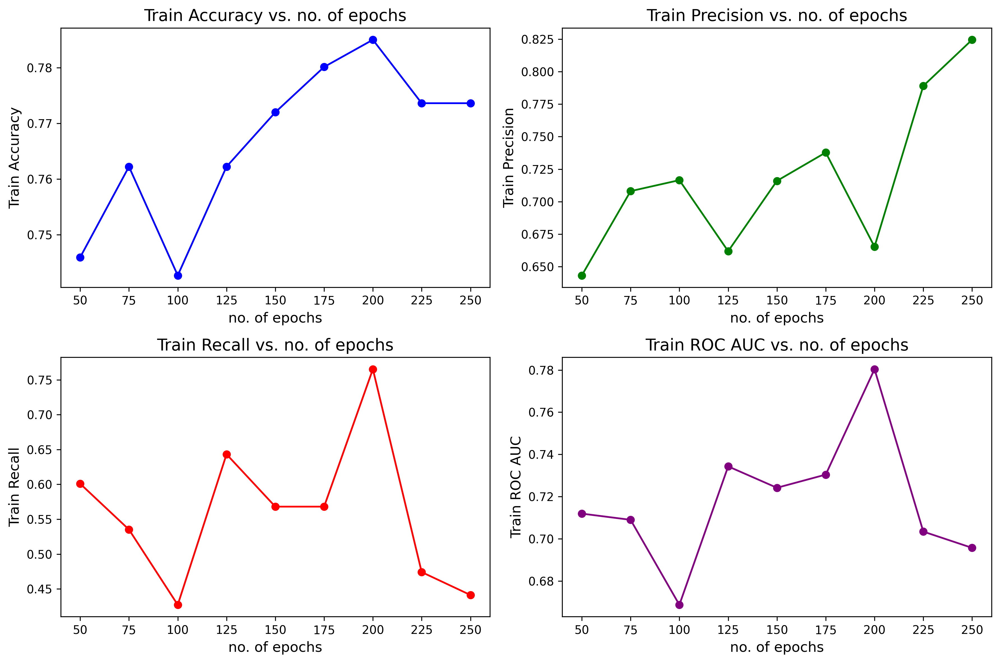

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

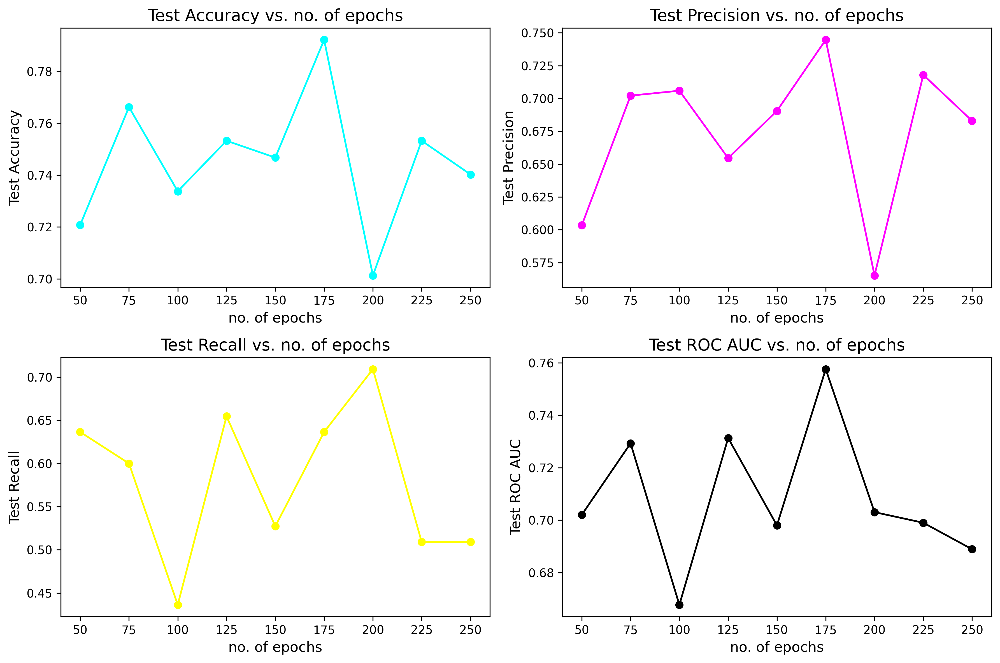

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# @title plots for varying epochs

# --- Figure 1: epochs vs. Train Metrics ---
fig1, axes1 = plt.subplots(2, 2, figsize=(12, 8), dpi=300)
colors1 = ['blue', 'green', 'red', 'purple']

axes1[0, 0].plot(results_df['no. of epochs'], results_df['Train Accuracy'], marker='o', color=colors1[0])
axes1[0, 0].set_title('Train Accuracy vs. no. of epochs', fontsize=14)
axes1[0, 0].set_xlabel('no. of epochs', fontsize=12)
axes1[0, 0].set_ylabel('Train Accuracy', fontsize=12)

axes1[0, 1].plot(results_df['no. of epochs'], results_df['Train Precision'], marker='o', color=colors1[1])
axes1[0, 1].set_title('Train Precision vs. no. of epochs', fontsize=14)
axes1[0, 1].set_xlabel('no. of epochs', fontsize=12)
axes1[0, 1].set_ylabel('Train Precision', fontsize=12)

axes1[1, 0].plot(results_df['no. of epochs'], results_df['Train Recall'], marker='o', color=colors1[2])
axes1[1, 0].set_title('Train Recall vs. no. of epochs', fontsize=14)
axes1[1, 0].set_xlabel('no. of epochs', fontsize=12)
axes1[1, 0].set_ylabel('Train Recall', fontsize=12)

axes1[1, 1].plot(results_df['no. of epochs'], results_df['Train ROC AUC'], marker='o', color=colors1[3])
axes1[1, 1].set_title('Train ROC AUC vs. no. of epochs', fontsize=14)
axes1[1, 1].set_xlabel('no. of epochs', fontsize=12)
axes1[1, 1].set_ylabel('Train ROC AUC', fontsize=12)

plt.tight_layout()
plt.savefig('epochs_vs_train_metrics.png', dpi=300)
plt.show()

files.download('epochs_vs_train_metrics.png')



# --- Figure 2: no. of epochs vs. Test Metrics ---
fig2, axes2 = plt.subplots(2, 2, figsize=(12, 8), dpi=300)
colors2 = ['cyan', 'magenta', 'yellow', 'black']

axes2[0, 0].plot(results_df['no. of epochs'], results_df['Test Accuracy'], marker='o', color=colors2[0])
axes2[0, 0].set_title('Test Accuracy vs. no. of epochs', fontsize=14)
axes2[0, 0].set_xlabel('no. of epochs', fontsize=12)
axes2[0, 0].set_ylabel('Test Accuracy', fontsize=12)


axes2[0, 1].plot(results_df['no. of epochs'], results_df['Test Precision'], marker='o', color=colors2[1])
axes2[0, 1].set_title('Test Precision vs. no. of epochs', fontsize=14)
axes2[0, 1].set_xlabel('no. of epochs', fontsize=12)
axes2[0, 1].set_ylabel('Test Precision', fontsize=12)

axes2[1, 0].plot(results_df['no. of epochs'], results_df['Test Recall'], marker='o', color=colors2[2])
axes2[1, 0].set_title('Test Recall vs. no. of epochs', fontsize=14)
axes2[1, 0].set_xlabel('no. of epochs', fontsize=12)
axes2[1, 0].set_ylabel('Test Recall', fontsize=12)

axes2[1, 1].plot(results_df['no. of epochs'], results_df['Test ROC AUC'], marker='o', color=colors2[3])
axes2[1, 1].set_title('Test ROC AUC vs. no. of epochs', fontsize=14)
axes2[1, 1].set_xlabel('no. of epochs', fontsize=12)
axes2[1, 1].set_ylabel('Test ROC AUC', fontsize=12)

plt.tight_layout()
plt.savefig('epochs_vs_test_metrics.png', dpi=300)
plt.show()

files.download('epochs_vs_test_metrics.png')


# Assignment-1
**Task-1**: Do plain validation and k-fold cross validation. For plain validation, try different train:test ratios like 80:20, 70:30, 90:10, etc. And for k-fold CrossCV, try k=[3,4,5,6,7,8,9,10]. Document the results and identify the best cases. Try to intuitively justify the reason behind the best hyperparameter values.

**Task-2**: Vary the number of neurons in Layer#1. Try values in the range [10,20]. Document the results and identify the best cases. Try to intuitively justify the reason behind the best hyperparameter values.

**Task-3**: Vary the number of neurons in Layer#2. Try values in the range [5,15]. Document the results and identify the best cases. Try to intuitively justify the reason behind the best hyperparameter values.

**Task-3**: Vary the activation function in Layer#1. Try the ones shown in the lecture. Document the results and identify the best cases. Try to intuitively justify the reason behind the best hyperparameter values.

**Task-4**: Vary the activation function in Layer#2. Try the ones shown in the lecture. Document the results and identify the best cases. Try to intuitively justify the reason behind the best hyperparameter values.

**Task-5**: Vary the number of hidden layers (Hidden: All the layers *excluding* the Input and Output layers). Try values in the range [1,4]. Document the results and identify the best cases. Try to intuitively justify the reason behind the best hyperparameter values.

**Task-6**: Vary the number of training epochs. Try values in the range [50, 75, 100, 125, 150, 175, 200, 225, 250]. Document the results and identify the best cases. Try to intuitively justify the reason behind the best hyperparameter values.

# Instructions for Submission
Document your results in a pdf file (idea: convert .docx to .pdf) and submit it to elms. In that file, provide the link (with ***access***) to the notebook file in which you ran your code (if you run on your own PC, upload the source .py file to drive and provide the link to the file).

For ***bonus*** marks, generate beautiful visuals (plots drawn in matplotlib, seaborn, etc.), and paste them onto your document. The codes to draw the visuals must be there in your source code.

For *** additional bonus*** marks, use latex to write your report, and split it into sections like *Introduction, Methods, Results, and Conclusion*, just like a research paper.